Cel: Analiza wpływu migracji na rynek pracy
* Ocena korelacji pomiędzy poziomem migracji a wskaźnikami zatrudnienia, bezrobocia oraz zatrudnienia w poszczególnych sektorach
* Stworzenie modeli statystycznych oceniających wpływ 
* Wykorzystane zestawy danych z Eurostatu:
    - Employment by citizenship
    - Employment rates by sex, age and citizenship - QUARTERLY & YEARLY
    - Unemployment rates by sex, age and citizenship QUARTERLY & YEARLY
    - Employment by sex, age and economic activity

In [49]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Employment rates by sex, age and citizenship quarterly

W analizie biorę pod uwagę: 
* citizenship jako Reporting country/Foreign country/Total
* age -> jedynie 15-64 (w statystyce porównawczej te granice są najczęściej przyjmowane)
* sex -> Females/Males/Total

Wskaźnik zatrudnienia – wskaźnik określający, jaki odsetek ludności w wieku produkcyjnym pracuje zawodowo (jednostka: %)

### Wstępna anliza danych 

In [77]:
e_rate_df = pd.read_csv('../processed_data/employmnet_rates.csv')

In [78]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain"]
df = e_rate_df[e_rate_df['geo'].isin(selected_countries)]

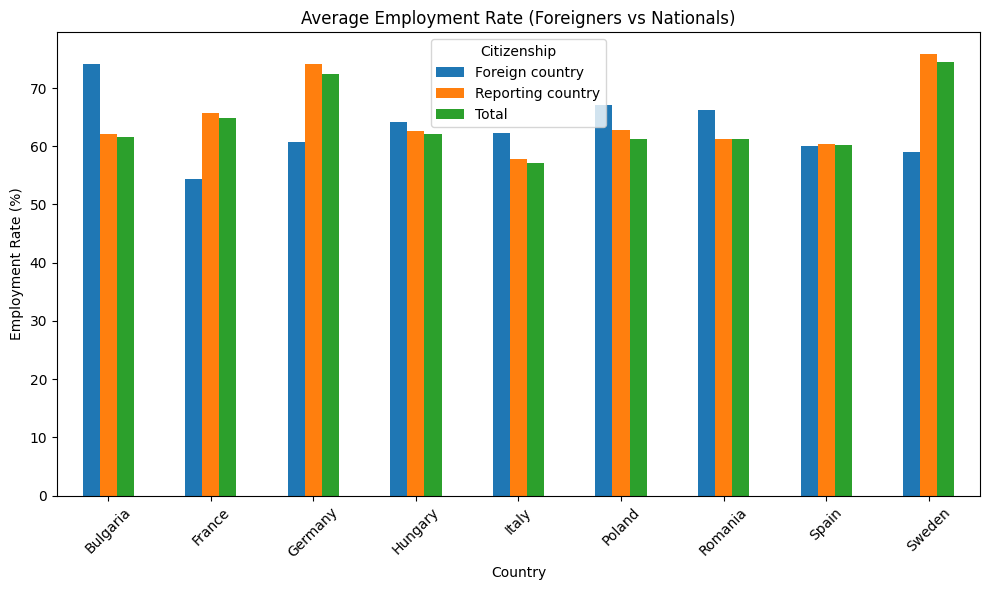

<Figure size 1200x600 with 0 Axes>

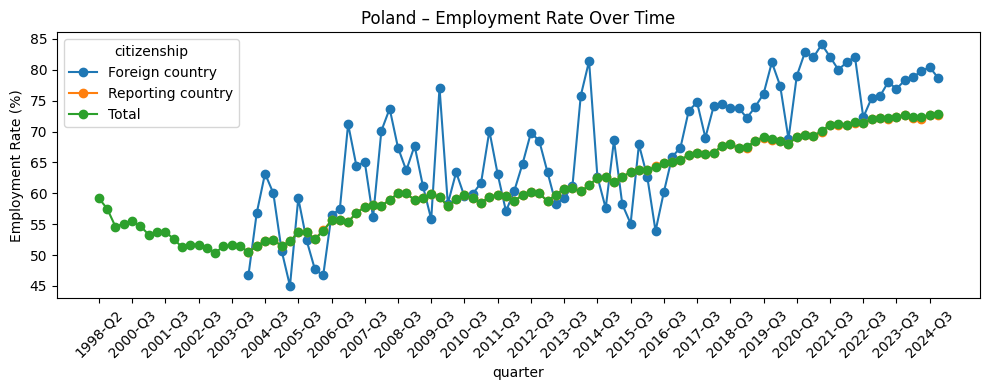

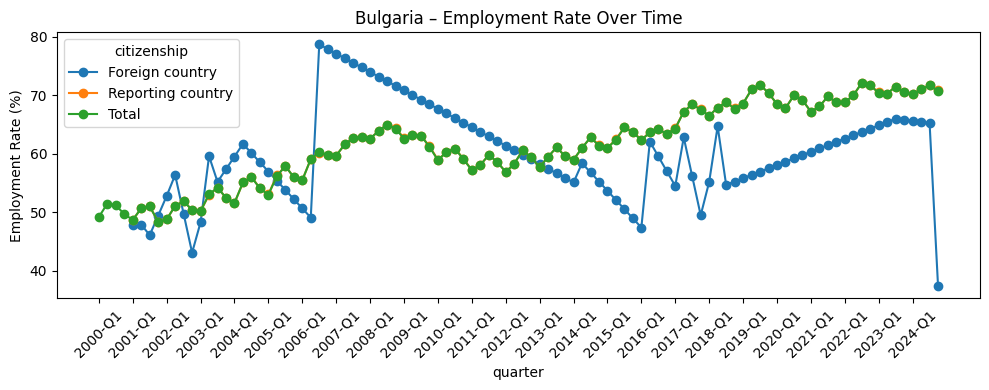

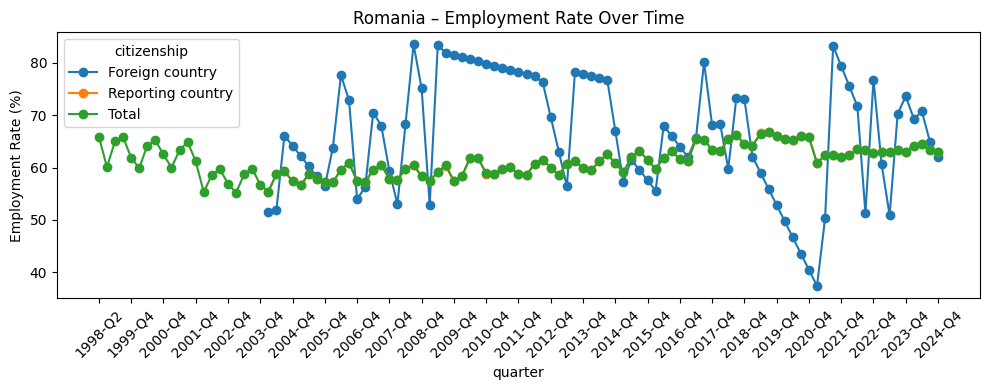

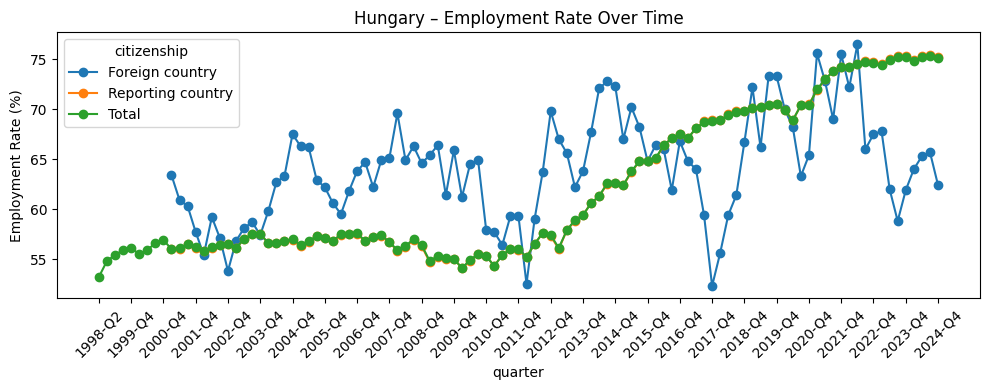

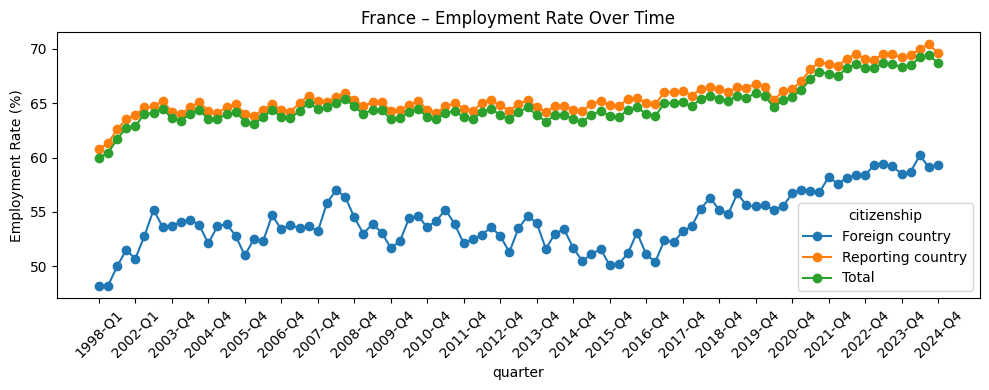

...

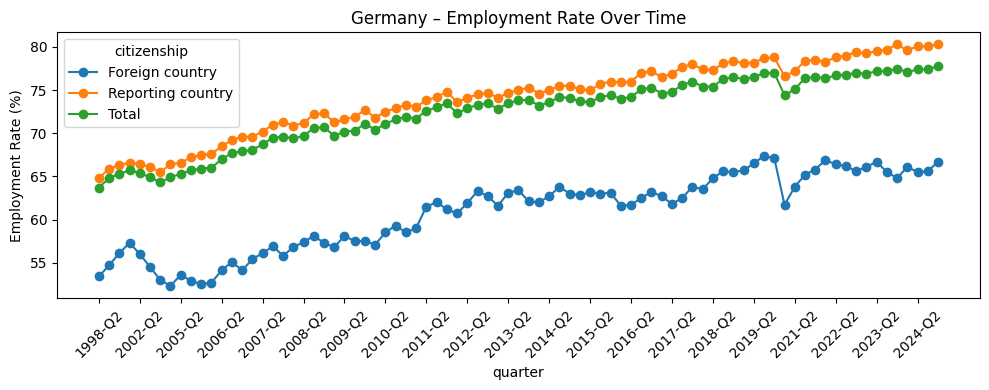

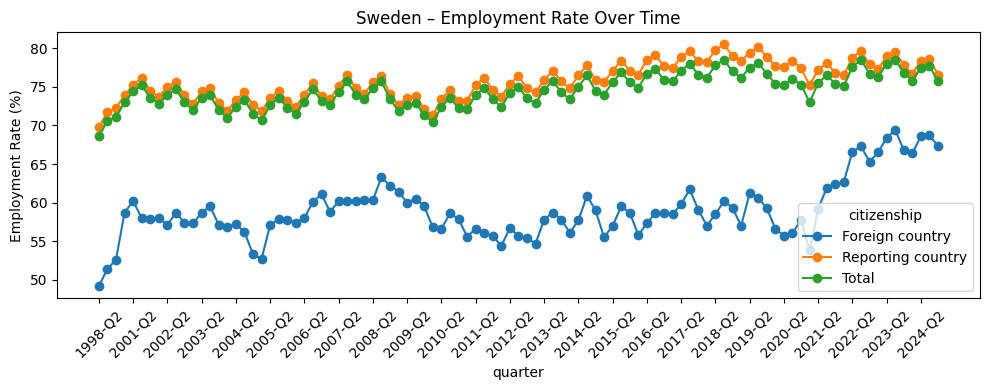

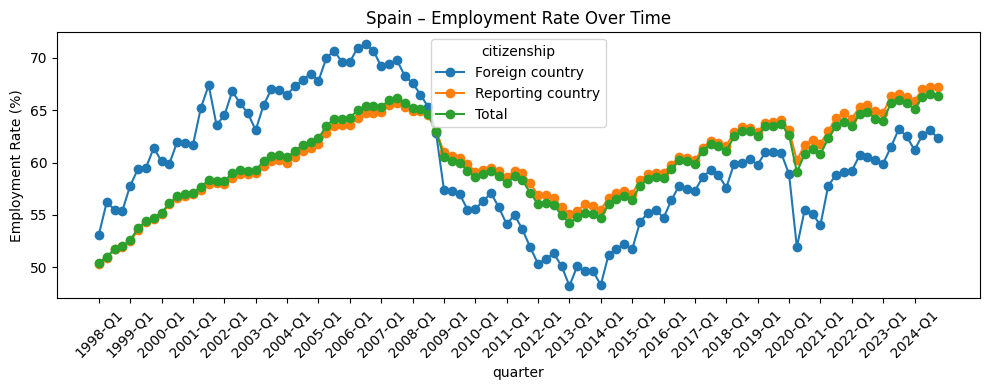

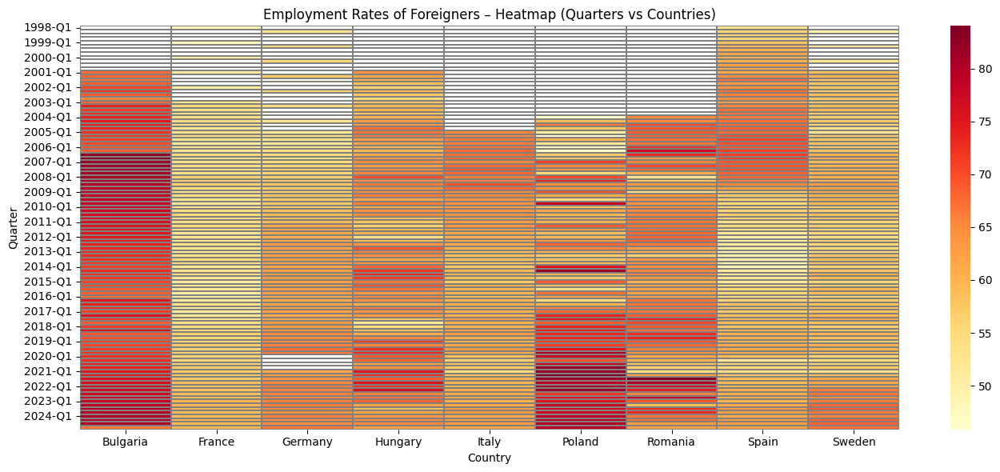

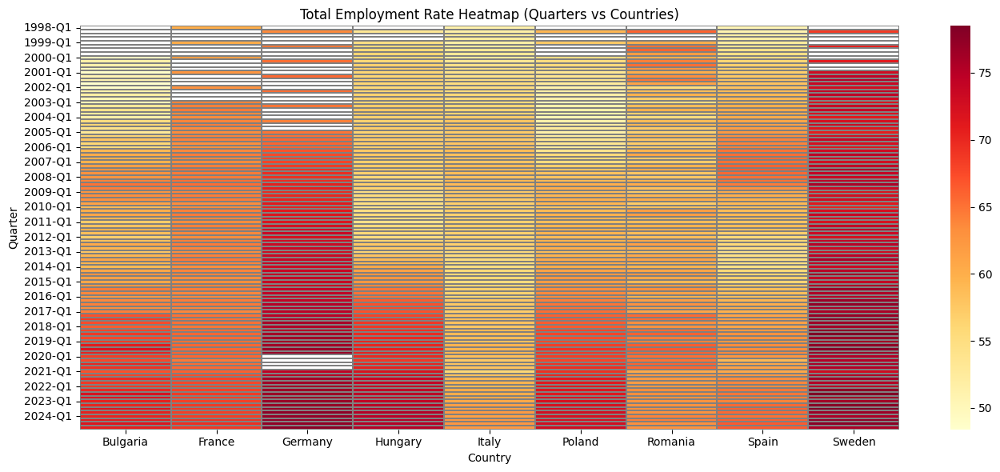

In [79]:
# Average employment rate by citizenship and country
pivot_mean = df.groupby(['geo', 'citizenship'])['employment_rate'].mean().unstack()

pivot_mean.plot(kind='bar', figsize=(10,6))
plt.title("Average Employment Rate (Foreigners vs Nationals)")
plt.ylabel("Employment Rate (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend(title="Citizenship")
plt.tight_layout()
plt.show()

# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in selected_countries:
    subset = df[(df['geo'] == country) & (df['citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='quarter', columns='citizenship', values='employment_rate')
    subset.plot(title=f"{country} – Employment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks), 4), labels=xticks[::4], rotation=45)
    plt.tight_layout()
    plt.show()

# Heatmap of foreigner employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Foreign country'].pivot_table(index='quarter', columns='geo', values='employment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Employment Rates of Foreigners – Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


# Heatmap of total employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Total'].pivot_table(index='quarter', columns='geo', values='employment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Total Employment Rate Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


Wątpliwe długie liniowe fragmenty - dla Bułgarii oraz Rumunii

### Próba analizy dla Bułgarii i Rumunii (foreign citizens) - dane rzeczywiste bez liniowej interpolacji

In [55]:
extra_df = pd.read_csv('../processed_data/employment_and_unemployment_rates_quarter.csv')

In [56]:
countries = ['Bulgaria', 'Romania']
extra_df = extra_df[
    (extra_df['geo'].isin(countries)) & 
    (extra_df['Country of citizenship'] == 'Foreign country')
]

In [57]:
print(len(extra_df[extra_df['employment_rate'] == 0])/len(extra_df)) 

0.3055555555555556


In [58]:
filtered_df = extra_df[extra_df['employment_rate'] > 0]
filtered_df = filtered_df.dropna(subset=['employment_rate'])

<Figure size 1200x600 with 0 Axes>

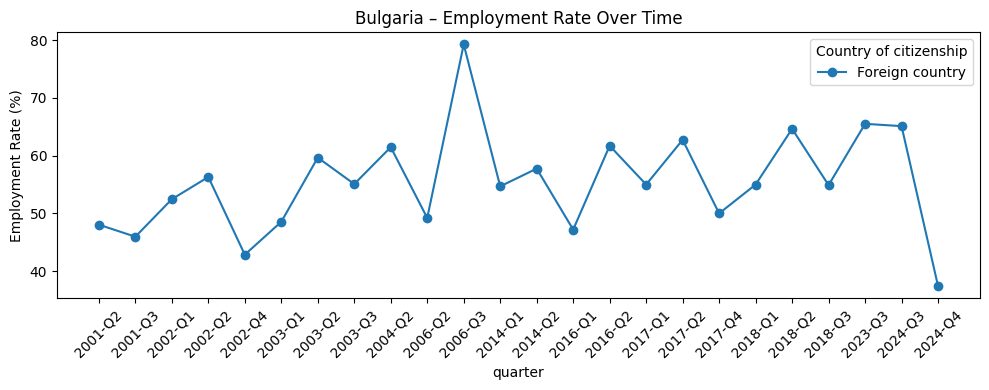

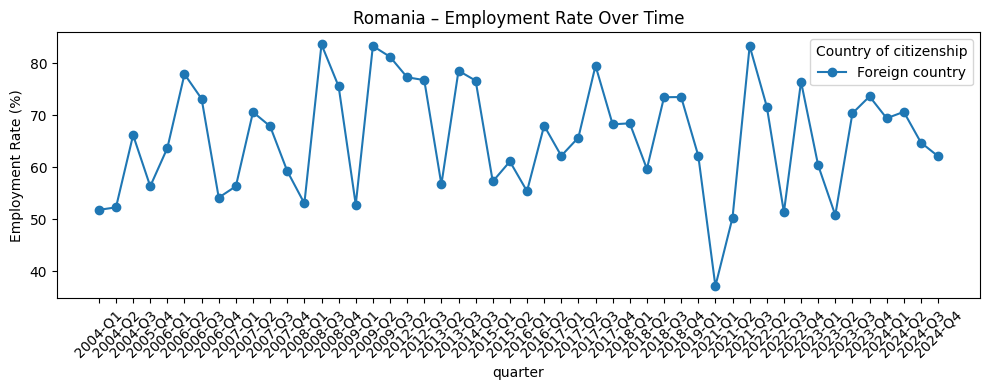

In [59]:
# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in countries:
    subset = filtered_df[(filtered_df['geo'] == country) & (filtered_df['Country of citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (filtered_df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='quarter', columns='Country of citizenship', values='employment_rate')
    subset.plot(title=f"{country} – Employment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks)), labels=xticks, rotation=45)
    plt.tight_layout()
    plt.show()

Niewiele pomogło, ale coś można odczytywać

Widać znaczny wzrost wskaźnika zatrudnienia w Polsce na przestrzeni lat

Widać braki w danych dla niektórych krajów - Bługarię i Rumunię należy wykluczyć z tej analizy / zastąpić innymi krajami / samodzielnie wyliczyć employment rate (z danych dotyczących employment). Postanowiono sprawdzić Grecję i Słowenię. 

In [60]:
new_countries = ['Greece', 'Slovenia']
# Filter the DataFrame for the new countries
df_extra_countries = e_rate_df[e_rate_df['geo'].isin(new_countries)]


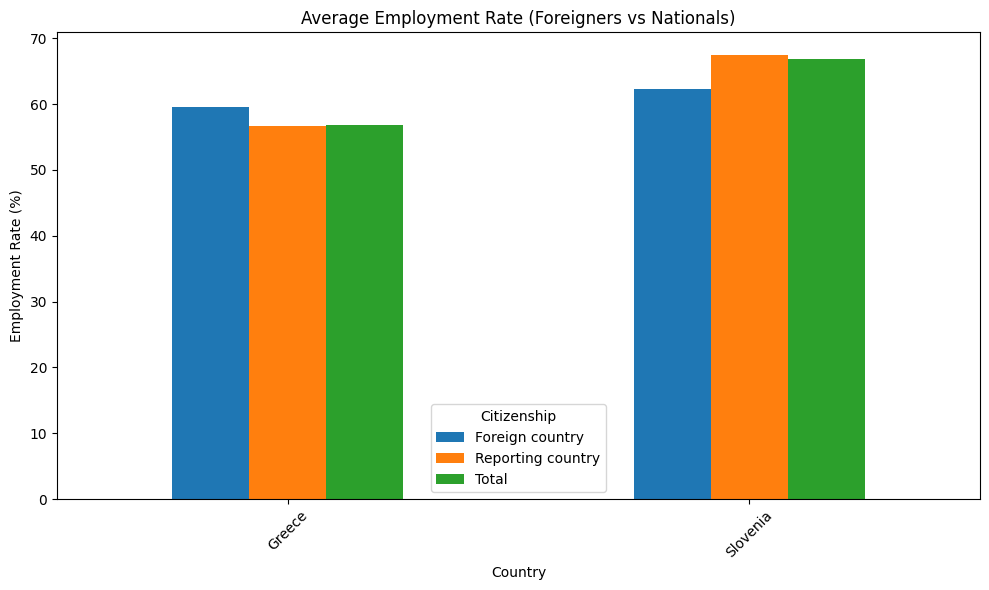

<Figure size 1200x600 with 0 Axes>

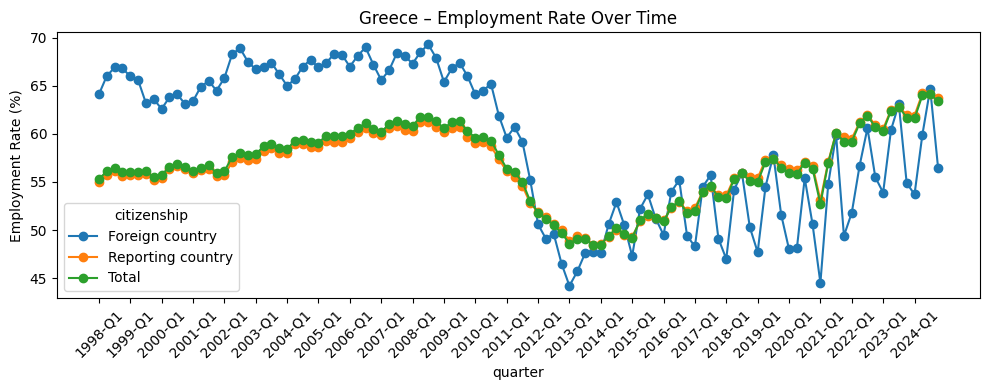

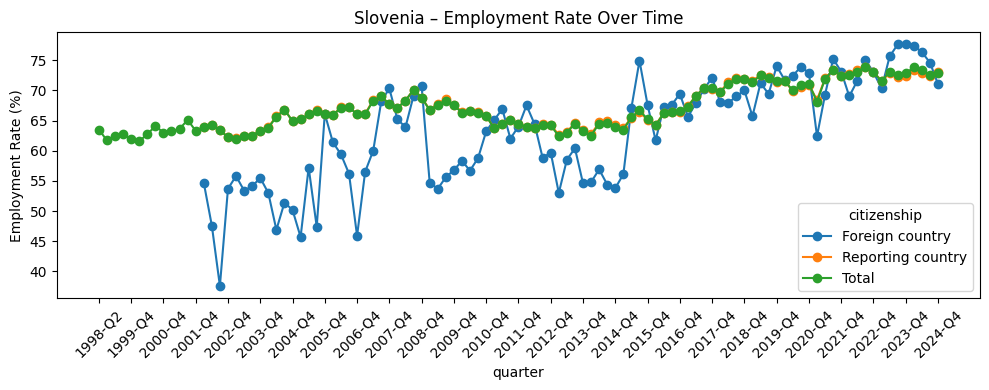

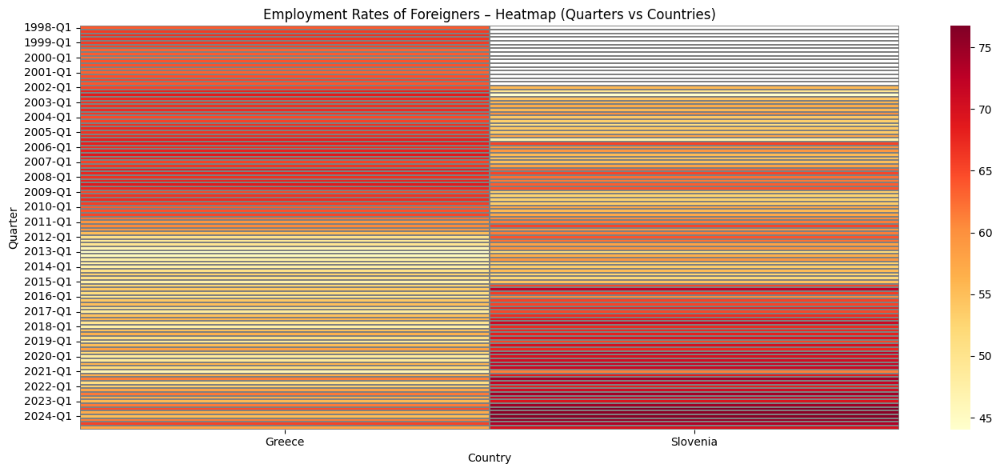

In [61]:
# Average employment rate by citizenship and country
pivot_mean = df_extra_countries.groupby(['geo', 'citizenship'])['employment_rate'].mean().unstack()

pivot_mean.plot(kind='bar', figsize=(10,6))
plt.title("Average Employment Rate (Foreigners vs Nationals)")
plt.ylabel("Employment Rate (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend(title="Citizenship")
plt.tight_layout()
plt.show()

# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in new_countries:
    subset = df_extra_countries[
        (df_extra_countries['geo'] == country) &
        (df_extra_countries['citizenship'].isin(['Reporting country', 'Foreign country', 'Total'])) &
        (df_extra_countries['Sex'] == 'Total')
    ]
    subset = subset.pivot_table(index='quarter', columns='citizenship', values='employment_rate')
    subset.plot(title=f"{country} – Employment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks), 4), labels=xticks[::4], rotation=45)
    plt.tight_layout()
    plt.show()


# Heatmap of foreigner employment rates by country and quarter
heatmap_data = df_extra_countries[df_extra_countries['citizenship'] == 'Foreign country'].pivot_table(
    index='quarter', columns='geo', values='employment_rate'
)

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Employment Rates of Foreigners – Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


### Analiza związana z płcią


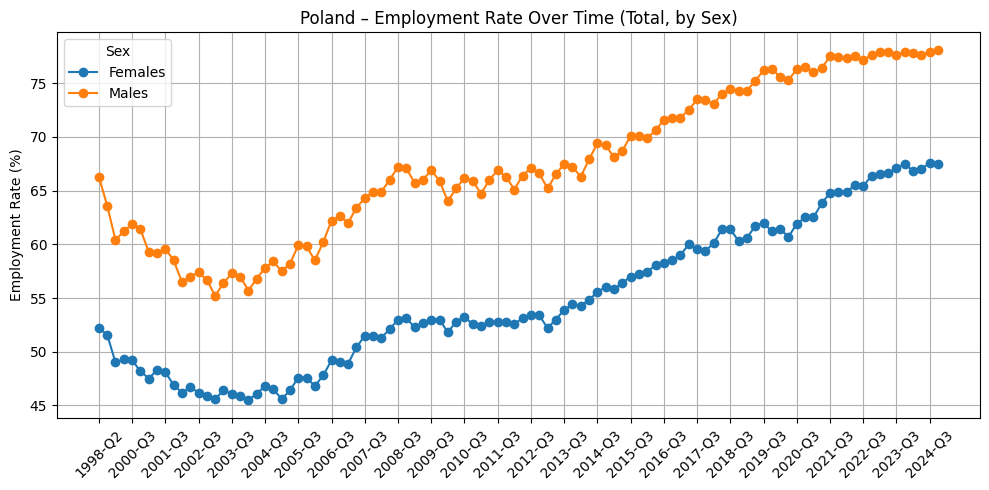

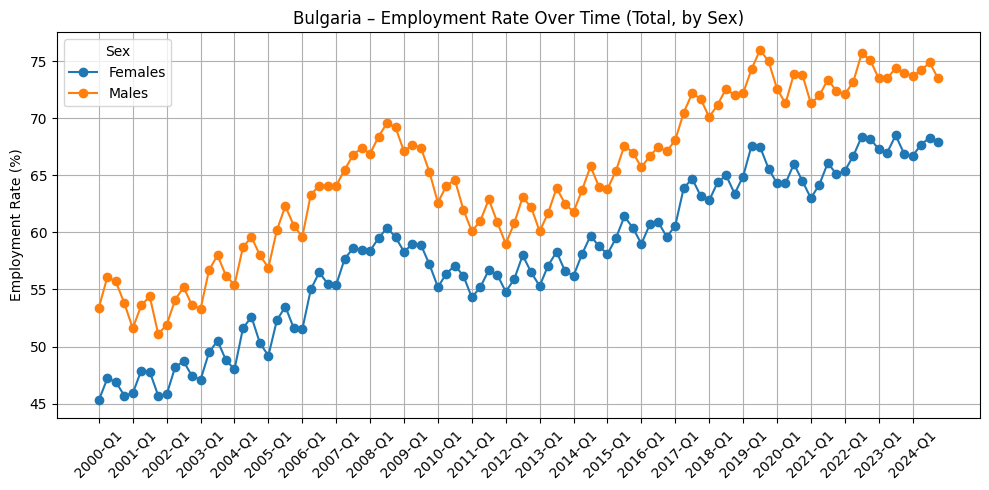

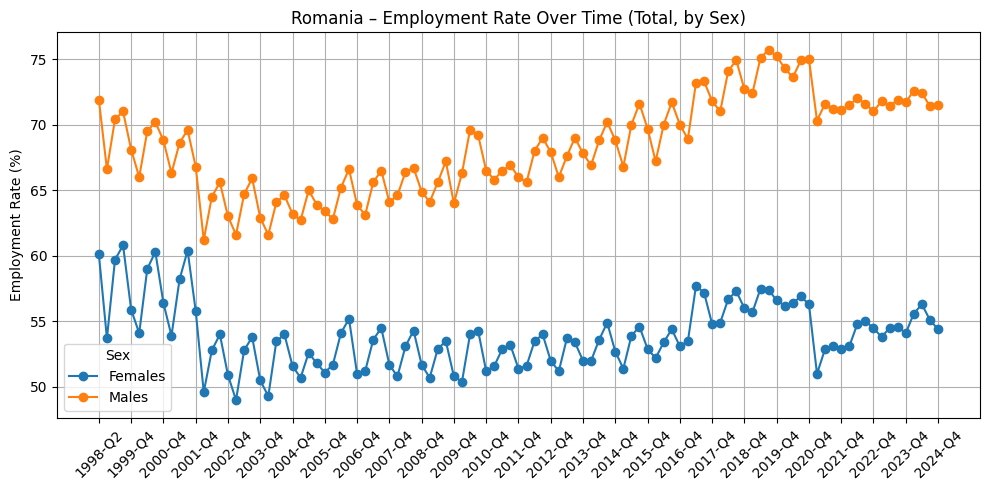

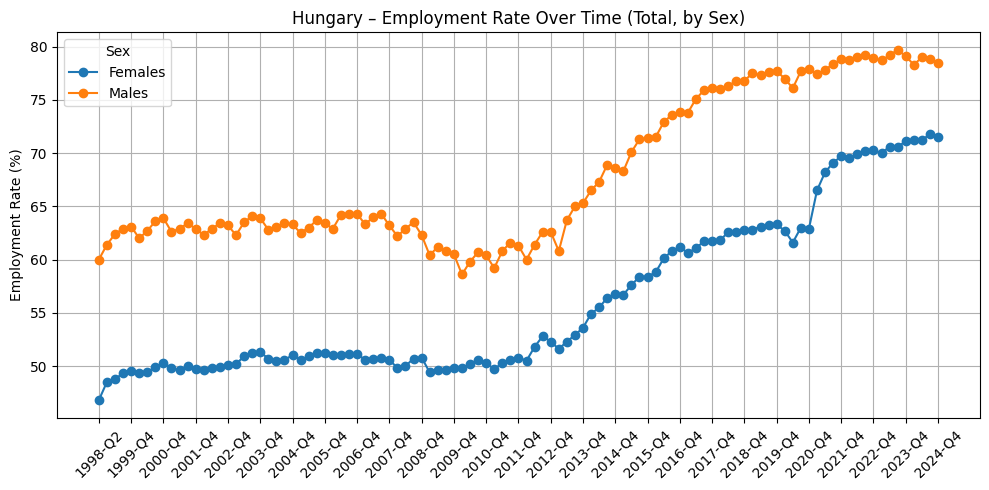

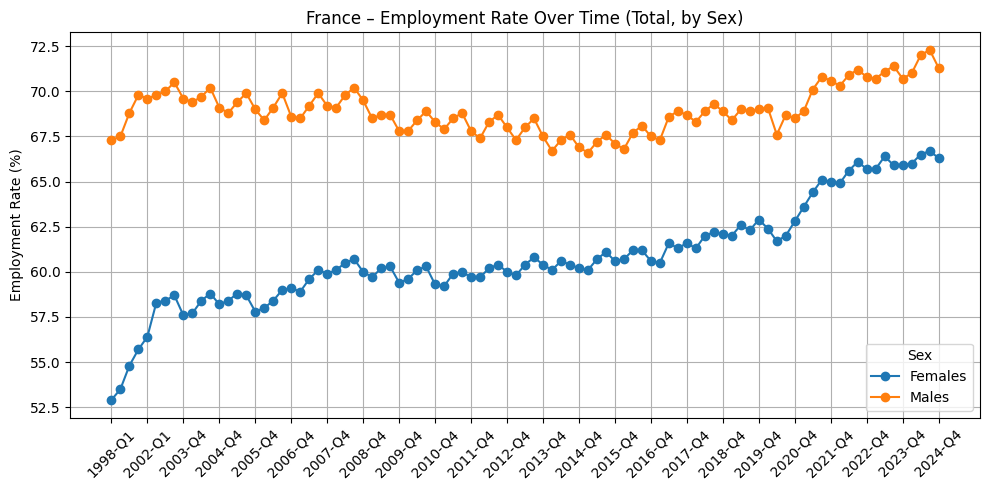

...

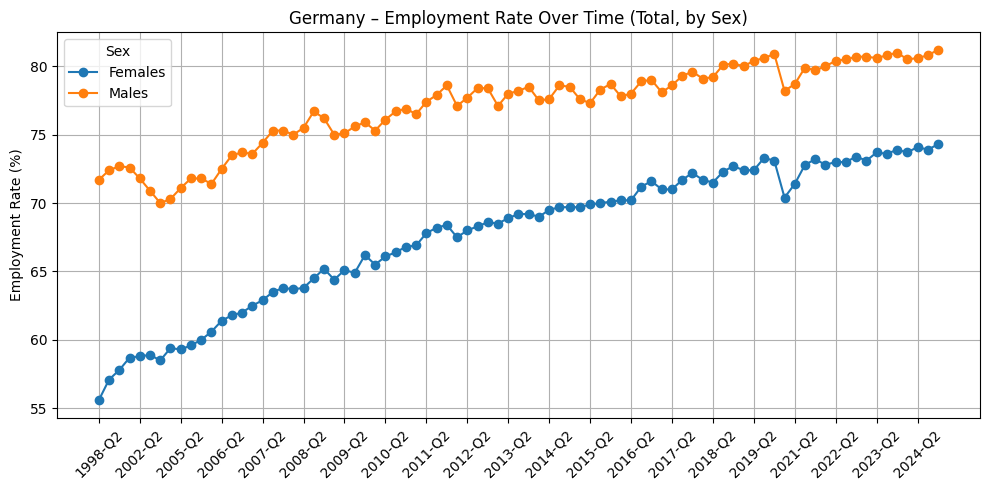

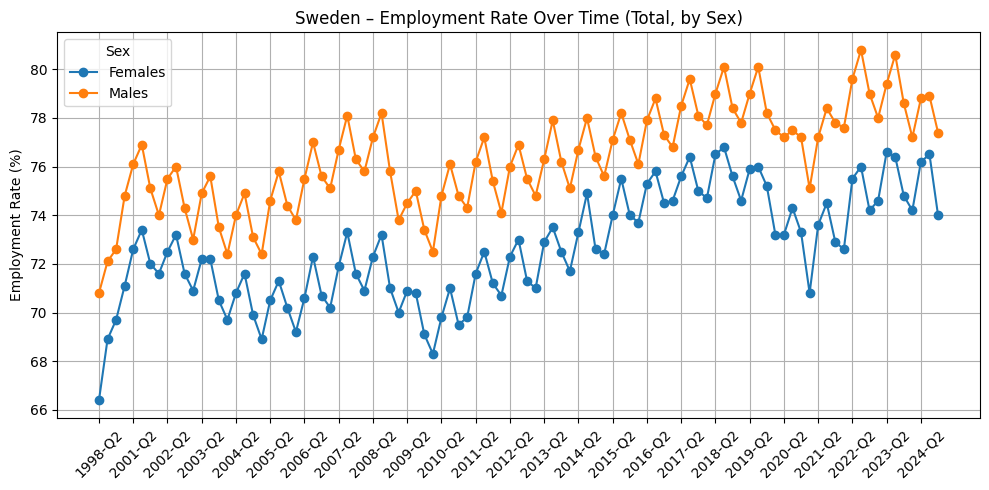

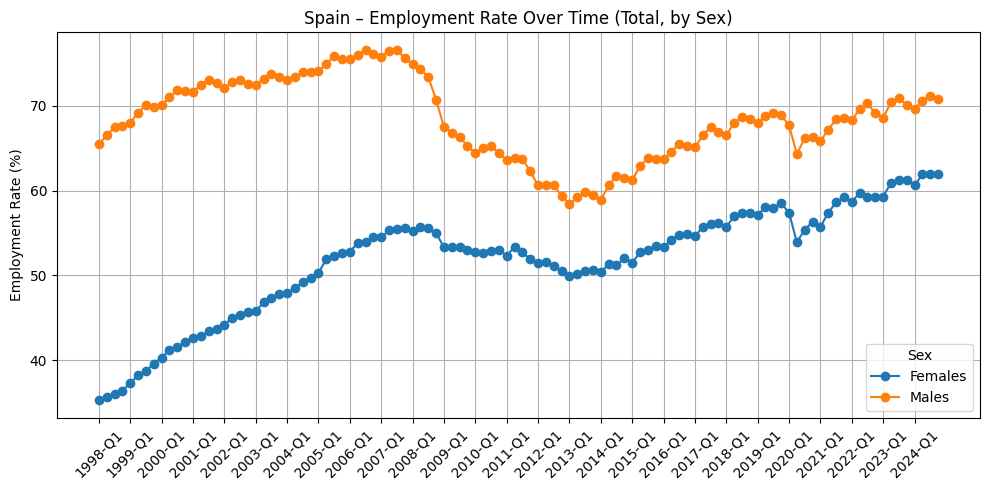

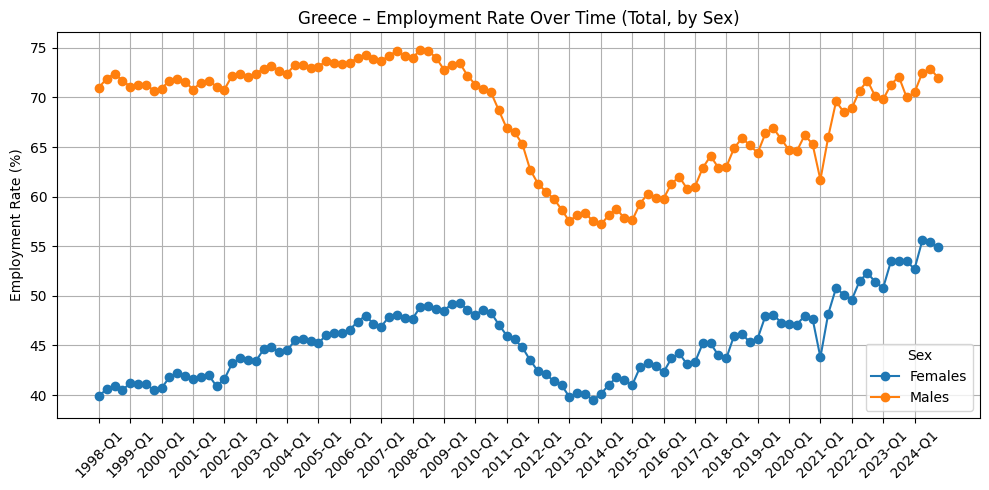

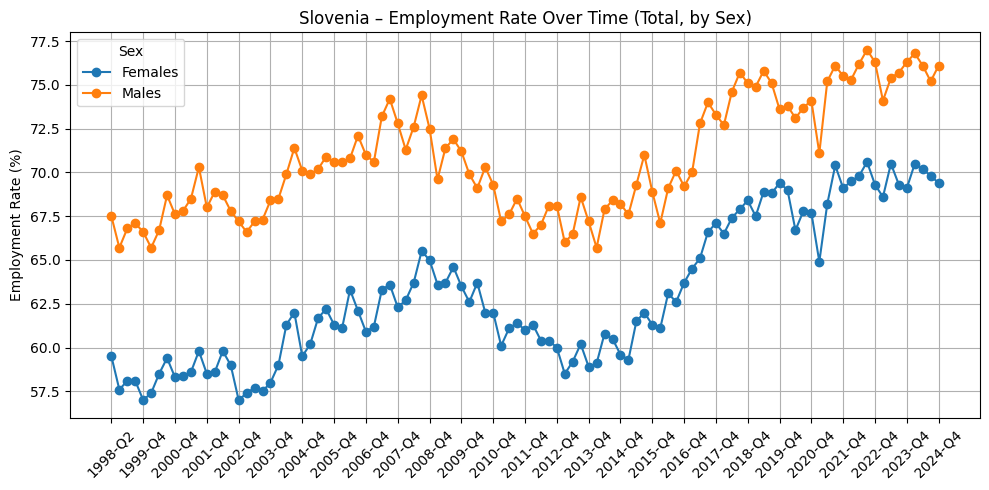

In [62]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]

df = e_rate_df[
    (e_rate_df['geo'].isin(selected_countries)) &
    (e_rate_df['Sex'].isin(['Females', 'Males'])) &
    (e_rate_df['citizenship'] == 'Total')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='quarter')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['quarter'], sex_data['employment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Employment Rate Over Time (Total, by Sex)")
    plt.ylabel("Employment Rate (%)")


    xticks = subset['quarter'].sort_values().unique()
    plt.xticks(xticks[::4], rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()


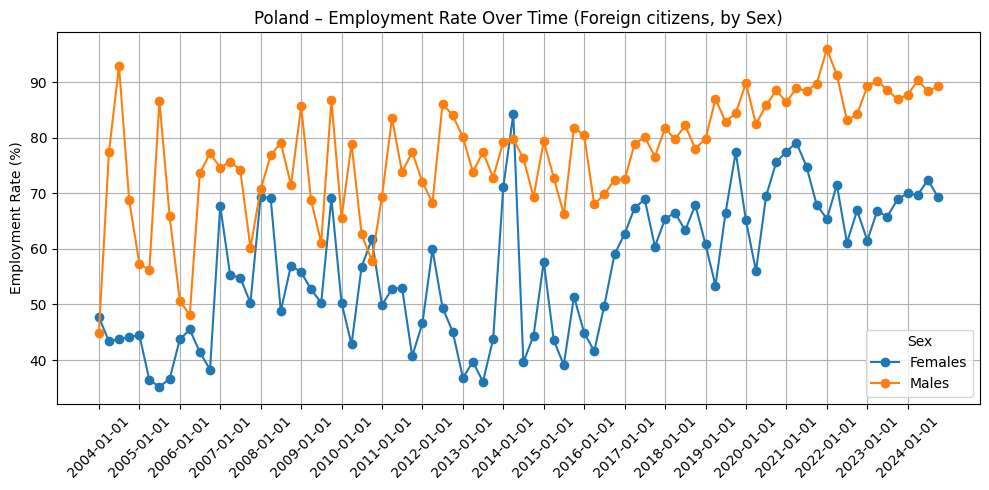

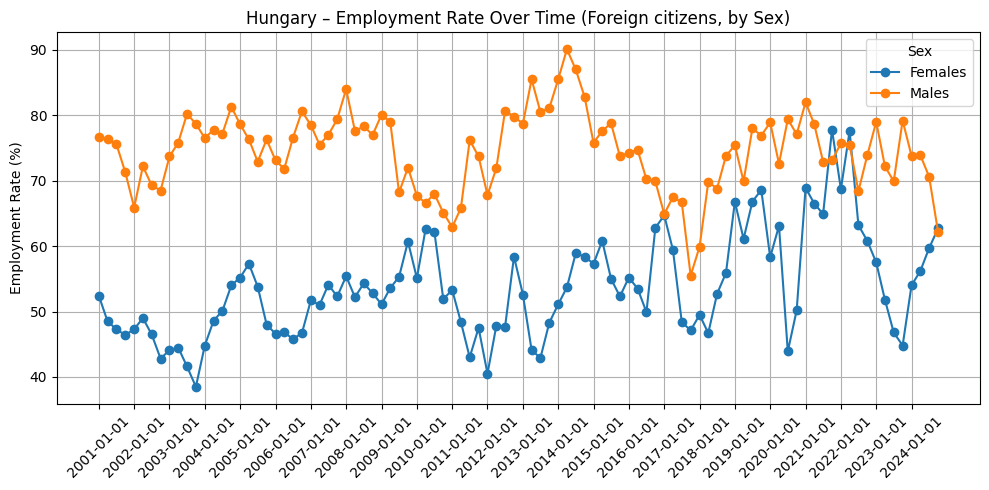

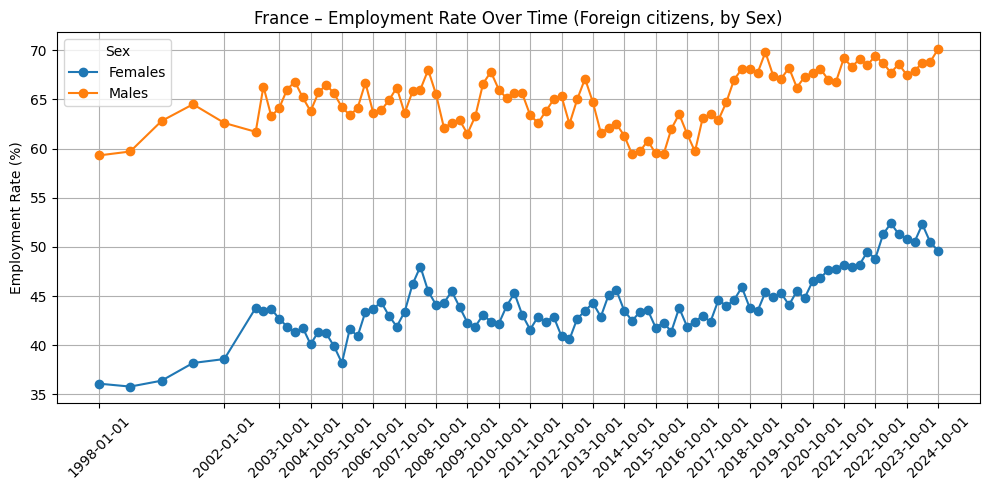

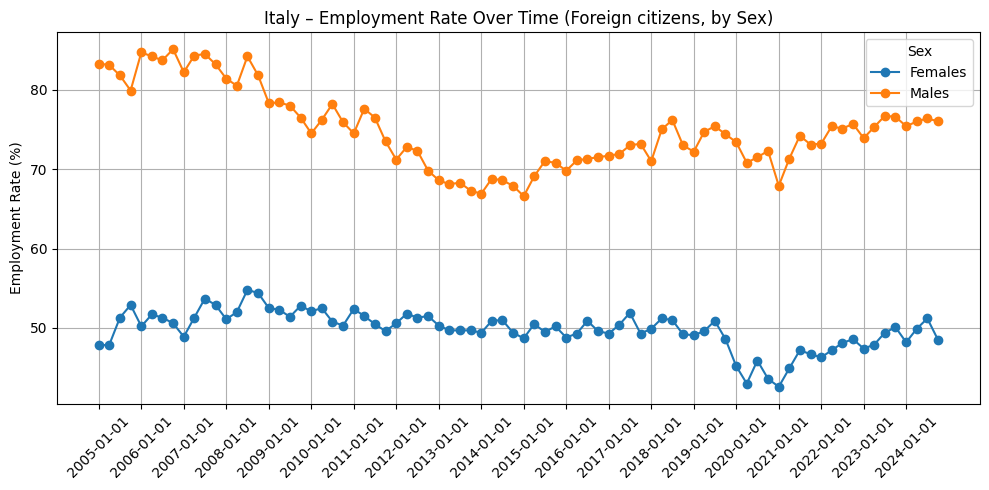

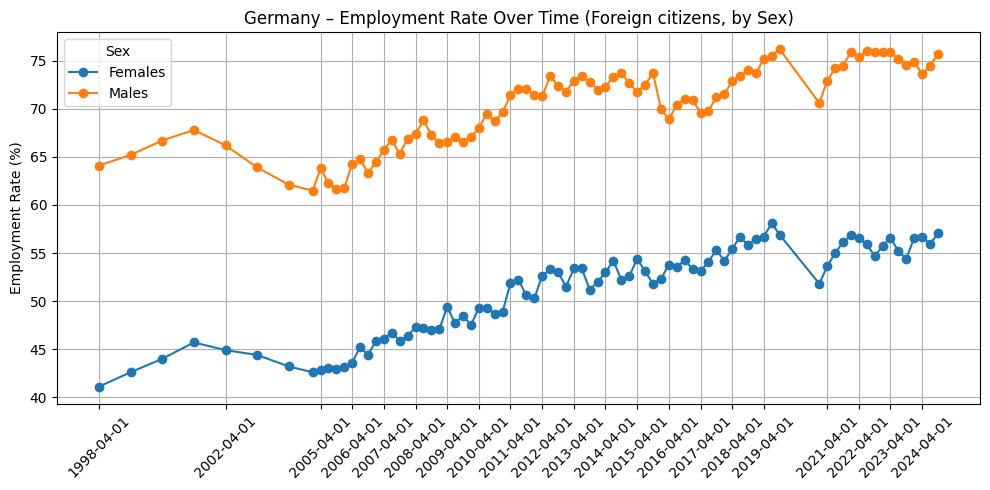

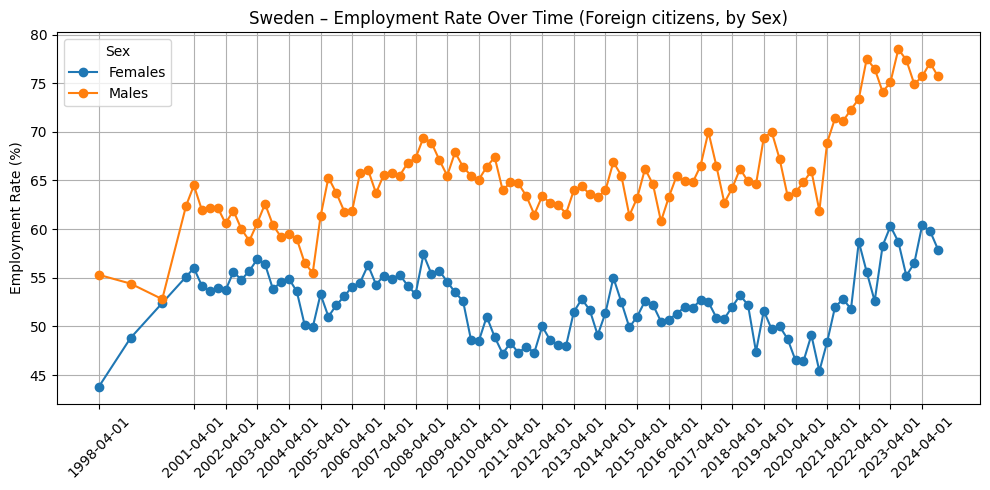

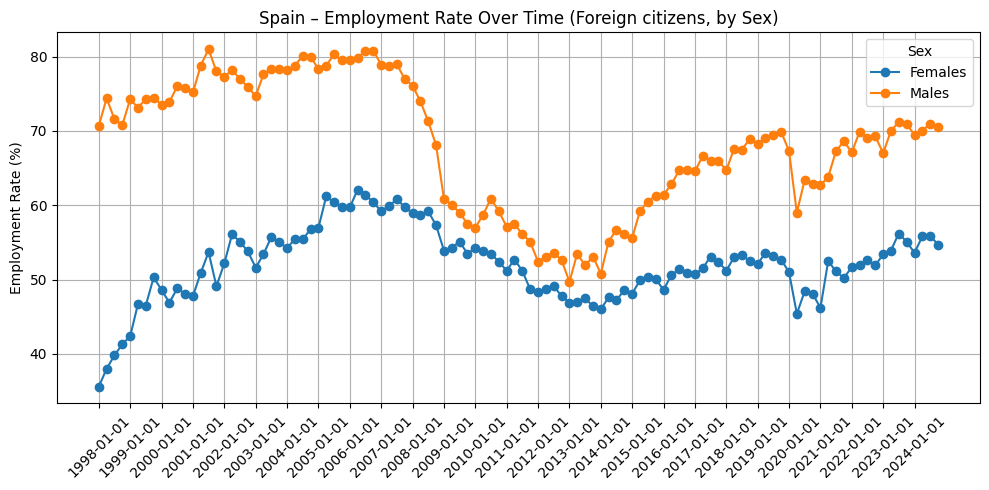

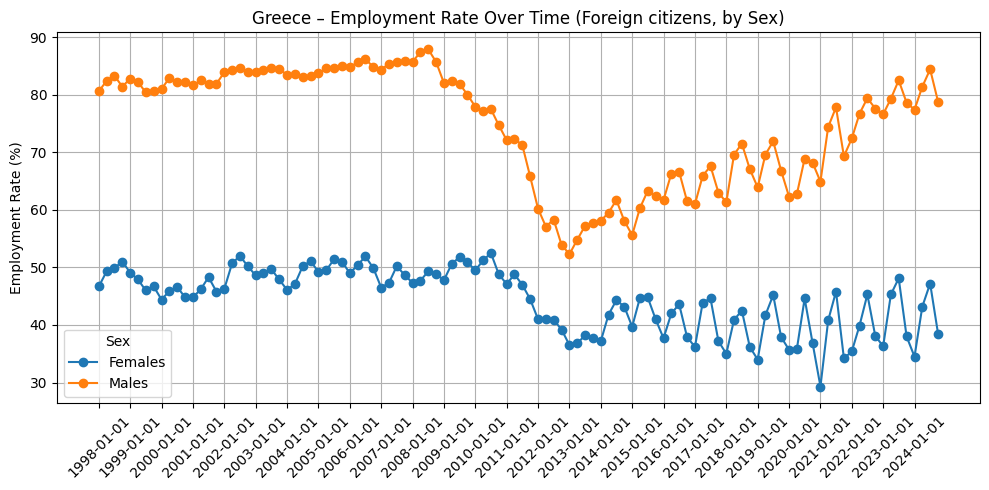

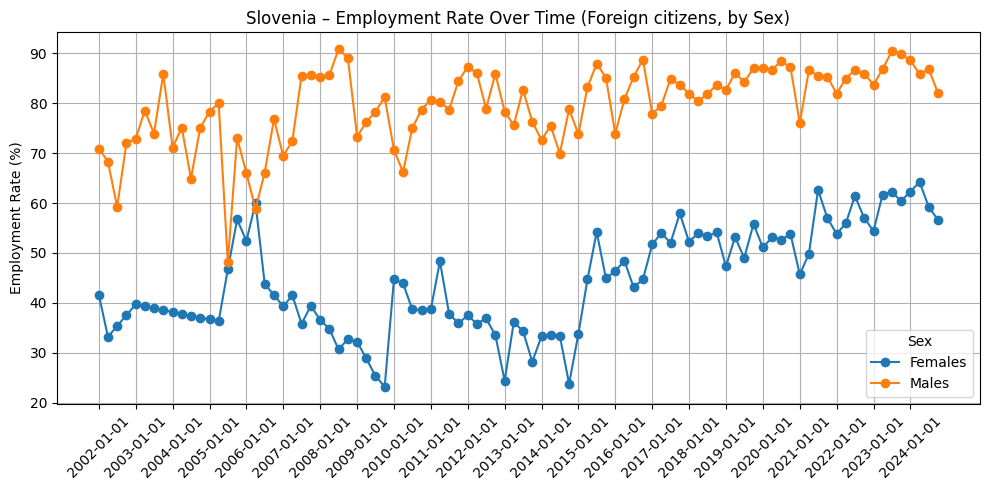

In [63]:
import matplotlib.pyplot as plt
import pandas as pd

selected_countries = ["Poland", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]


df = e_rate_df[
    (e_rate_df['geo'].isin(selected_countries)) &
    (e_rate_df['Sex'].isin(['Females', 'Males'])) &
    (e_rate_df['citizenship'] == 'Foreign country')
].copy()

def quarter_to_datetime(q):
    year, qtr = q[:4], q[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(qtr, '01')
    return pd.to_datetime(f"{year}-{month}-01")

df['quarter_dt'] = df['quarter'].apply(quarter_to_datetime)

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values('quarter_dt')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['quarter_dt'], sex_data['employment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Employment Rate Over Time (Foreign citizens, by Sex)")
    plt.ylabel("Employment Rate (%)")

    xticks = subset['quarter_dt'].unique()
    plt.xticks(xticks[::4], rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()


# Unemployment rates by sex, age and citizenship quarterly

# 

In [64]:
ue_rate_df = pd.read_csv('../processed_data/unemploymnet_rates.csv')

In [65]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain"]
df = ue_rate_df[ue_rate_df['geo'].isin(selected_countries)]

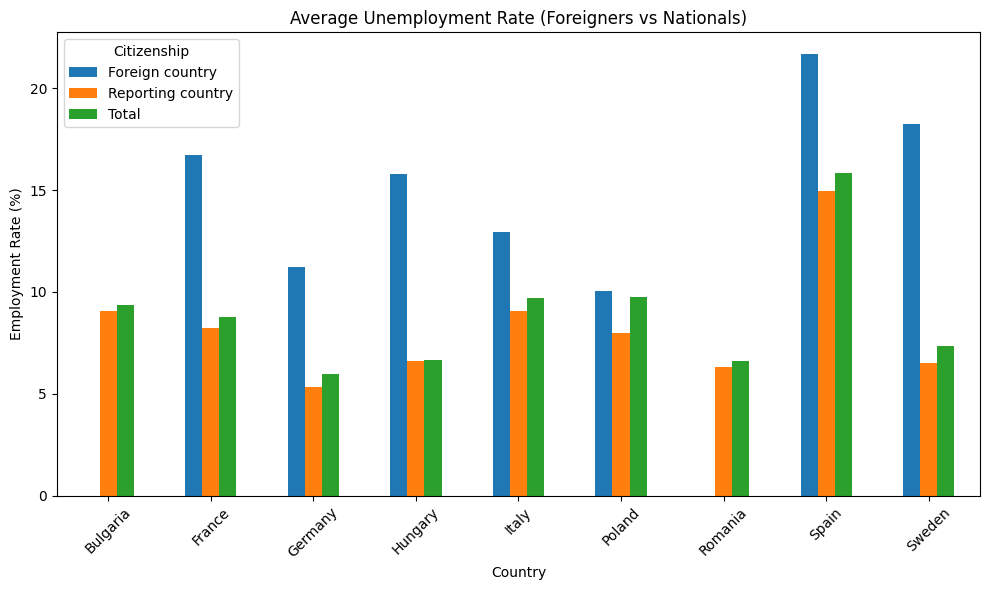

<Figure size 1200x600 with 0 Axes>

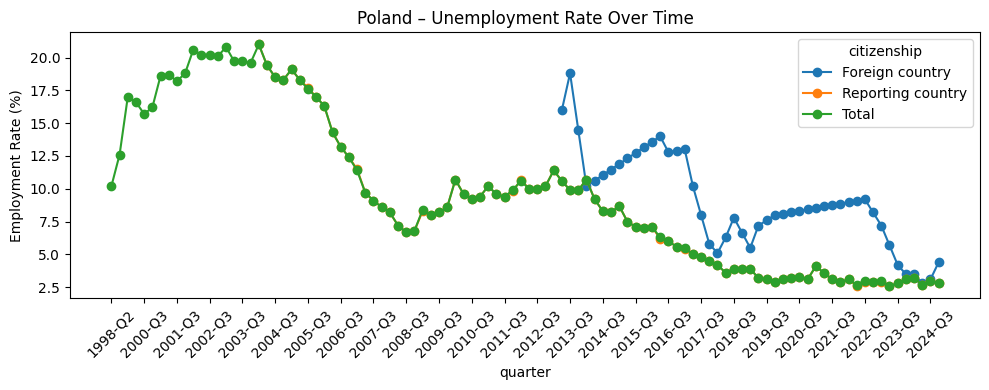

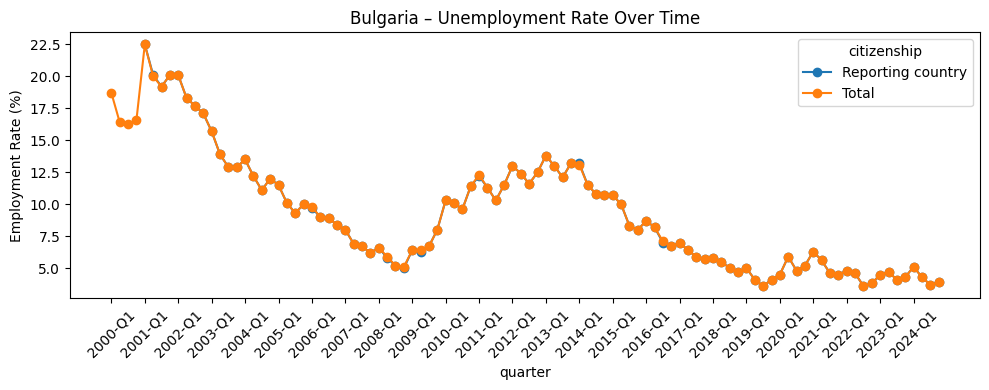

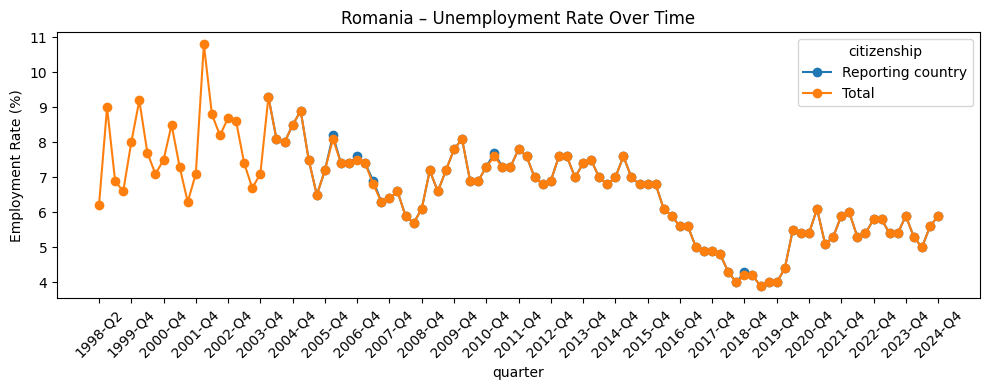

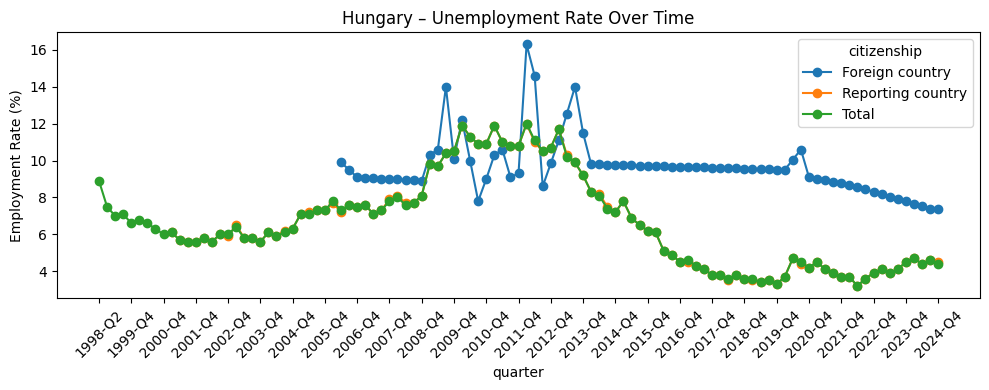

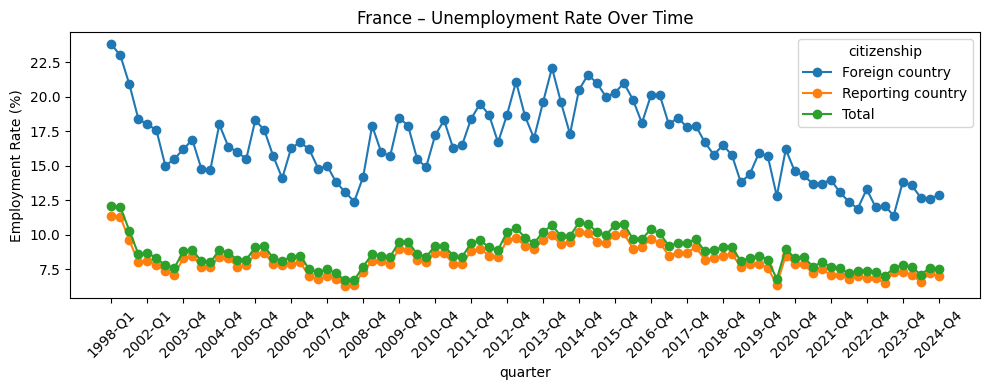

...

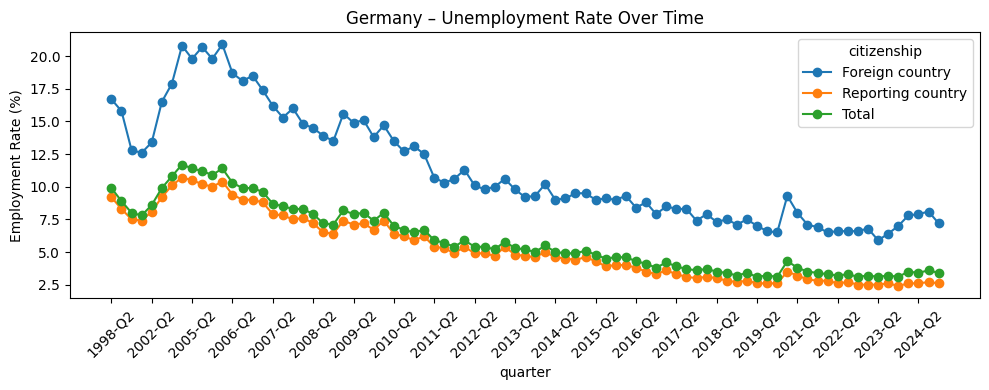

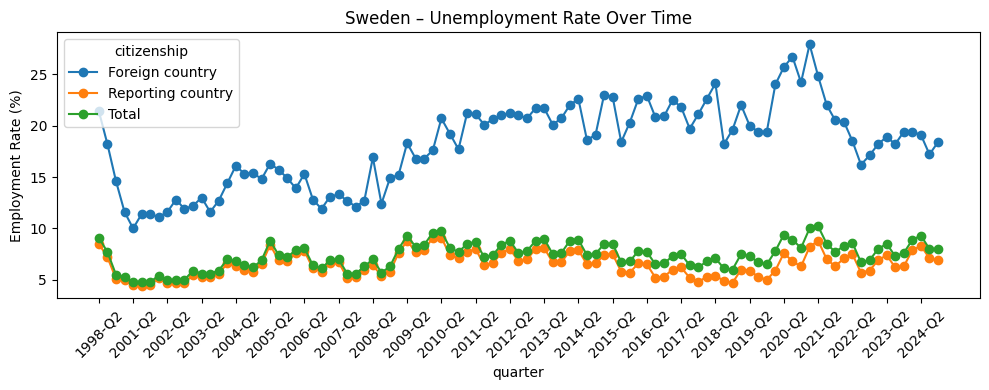

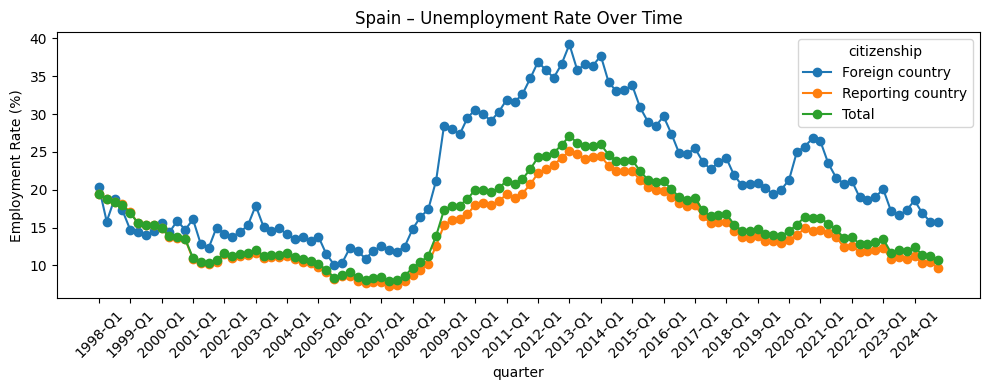

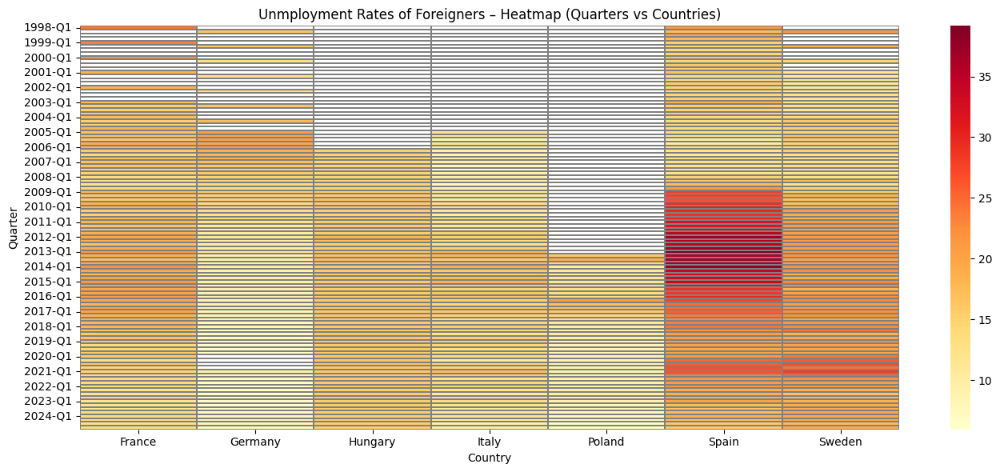

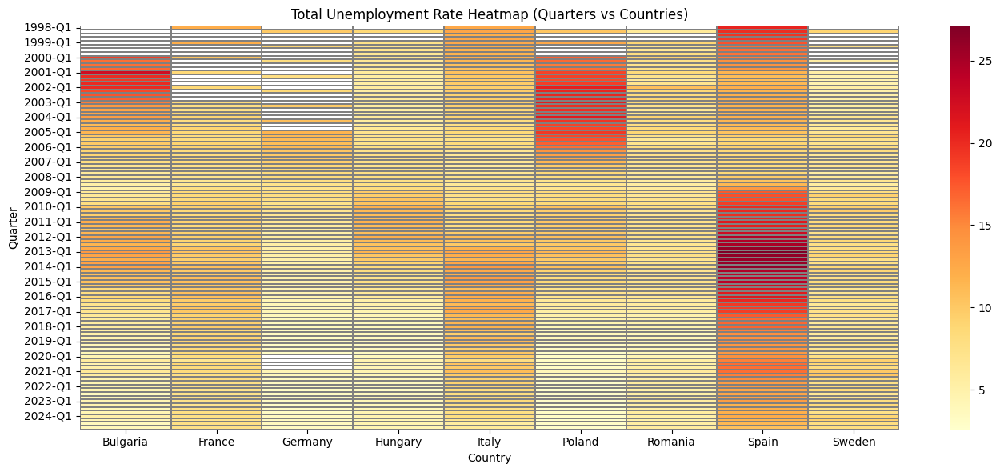

In [66]:
# Average unemployment rate by citizenship and country
pivot_mean = df.groupby(['geo', 'citizenship'])['unemployment_rate'].mean().unstack()

pivot_mean.plot(kind='bar', figsize=(10,6))
plt.title("Average Unemployment Rate (Foreigners vs Nationals)")
plt.ylabel("Employment Rate (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend(title="Citizenship")
plt.tight_layout()
plt.show()

# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in selected_countries:
    subset = df[(df['geo'] == country) & (df['citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='quarter', columns='citizenship', values='unemployment_rate')
    subset.plot(title=f"{country} – Unemployment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks), 4), labels=xticks[::4], rotation=45)
    plt.tight_layout()
    plt.show()
import seaborn as sns
# Heatmap of foreigner unemployment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Foreign country'].pivot_table(index='quarter', columns='geo', values='unemployment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Unmployment Rates of Foreigners – Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


# Heatmap of total employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Total'].pivot_table(index='quarter', columns='geo', values='unemployment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Total Unemployment Rate Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


### Próba analizy dla krajów z dużymi brakami - Polska, Węgry, Bułgaria, Rumunia

0.8611111111111112


<Figure size 1200x600 with 0 Axes>

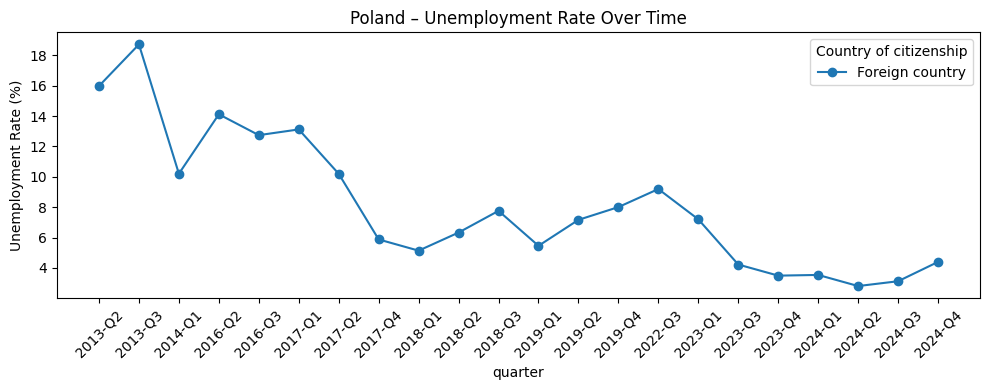

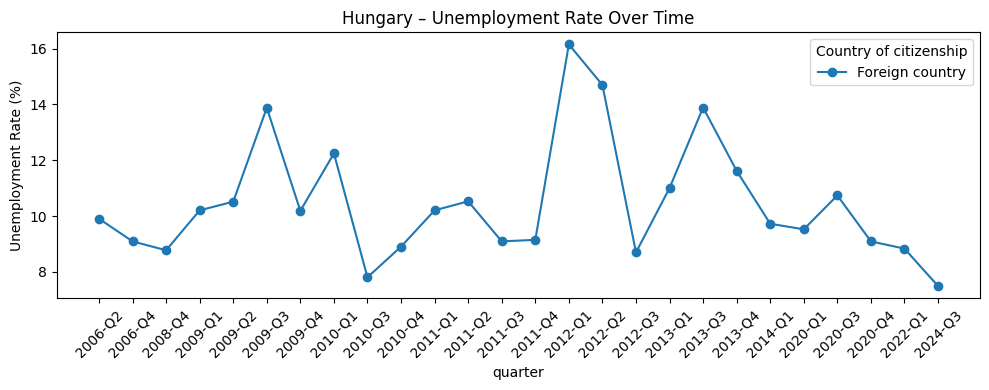

In [67]:
extra_df = pd.read_csv('../processed_data/employment_and_unemployment_rates_quarter.csv')

countries = ['Poland', 'Hungary']
extra_df = extra_df[
    (extra_df['geo'].isin(countries)) & 
    (extra_df['Country of citizenship'] == 'Foreign country')
]

print(len(extra_df[extra_df['unemployment_rate'] == 0])/len(extra_df)) 

filtered_df = extra_df[extra_df['unemployment_rate'] > 0]
filtered_df = filtered_df.dropna(subset=['unemployment_rate'])


# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in countries:
    subset = filtered_df[(filtered_df['geo'] == country) & (filtered_df['Country of citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (filtered_df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='quarter', columns='Country of citizenship', values='unemployment_rate')
    subset.plot(title=f"{country} – Unemployment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Unemployment Rate (%)")
    xticks = subset.index
    plt.xticks(ticks=range(0, len(xticks)), labels=xticks, rotation=45)
    plt.tight_layout()
    plt.show()

Dla Bułgarii i Rumunii - brak tego typu danych kwartalnych

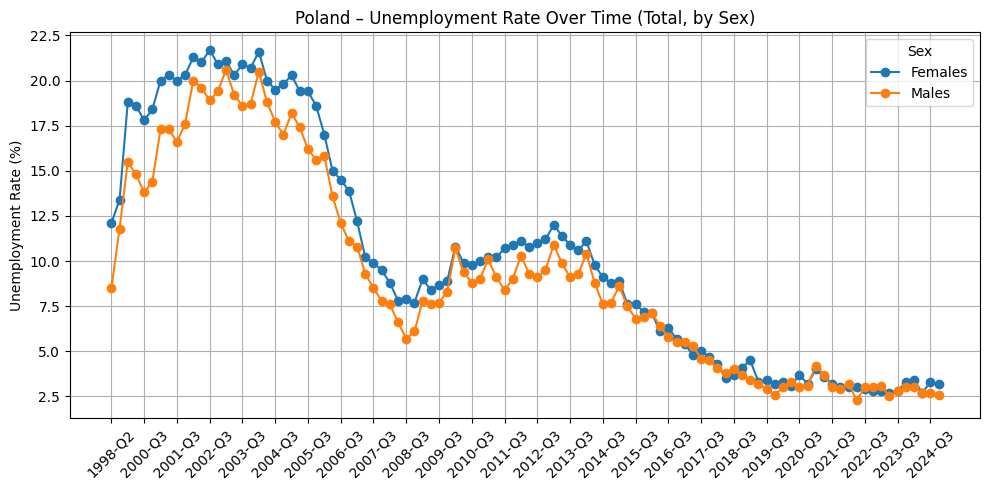

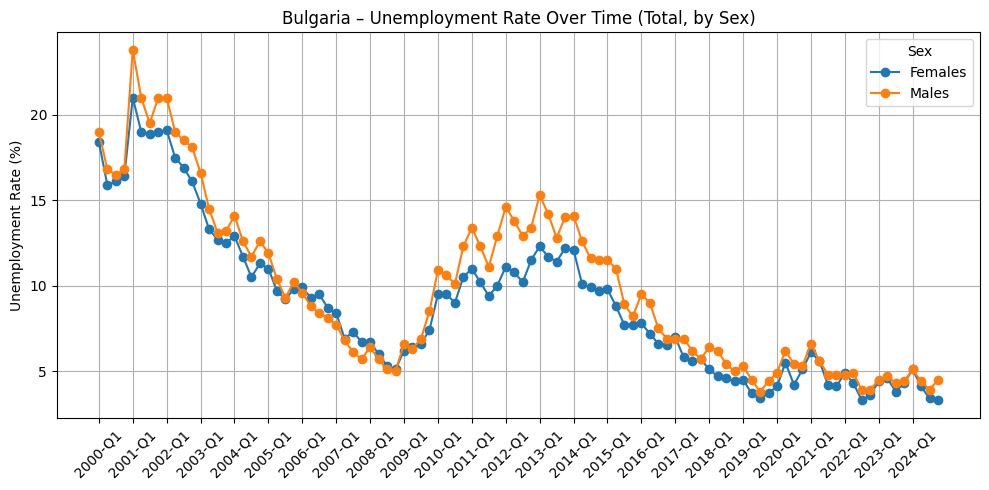

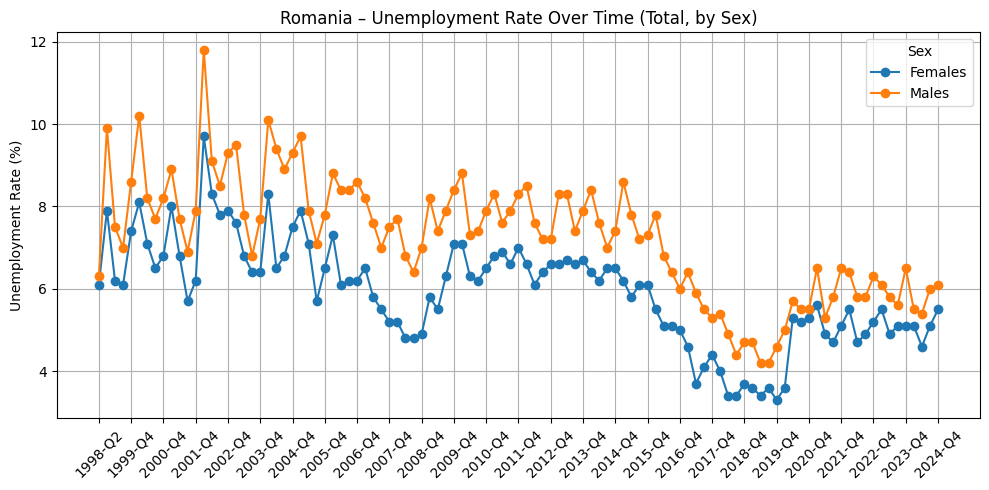

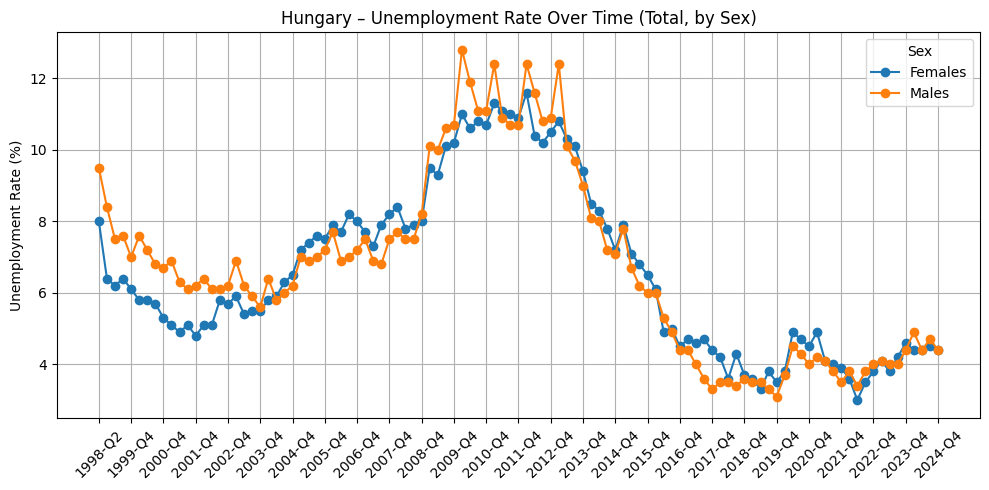

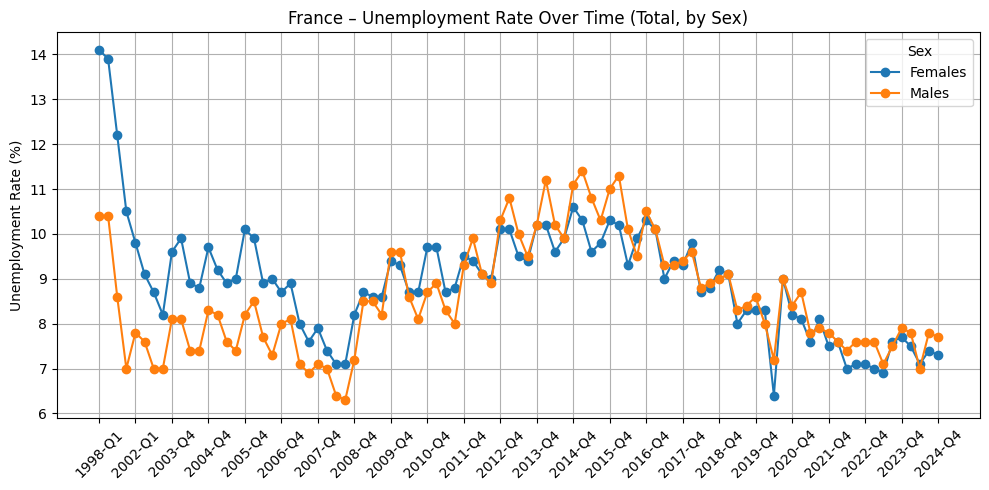

...

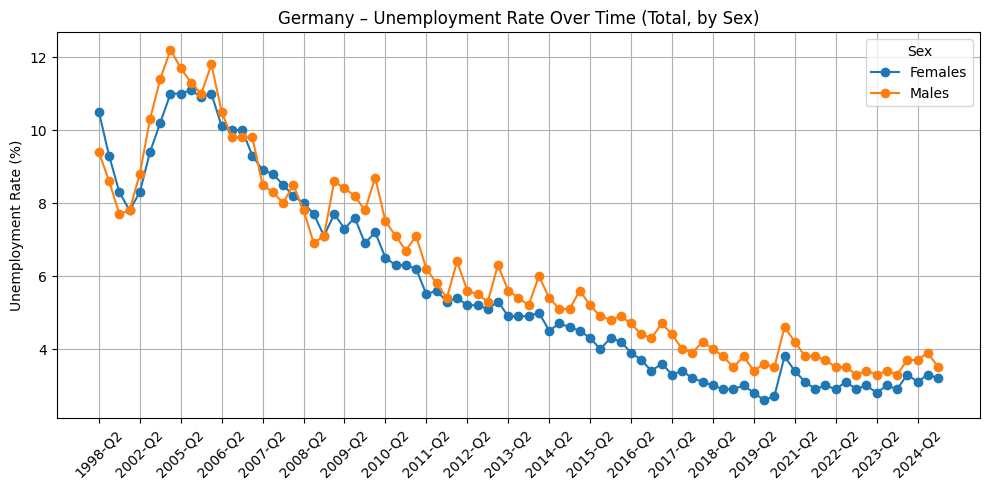

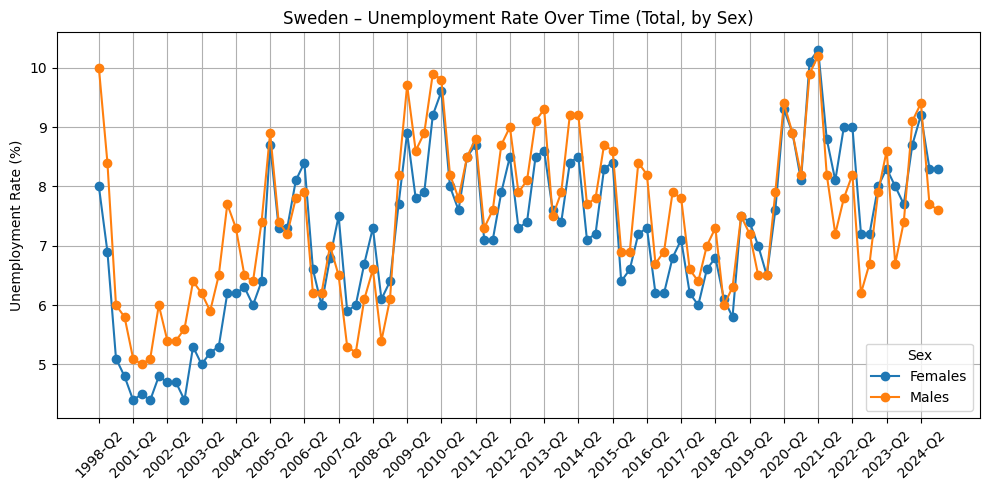

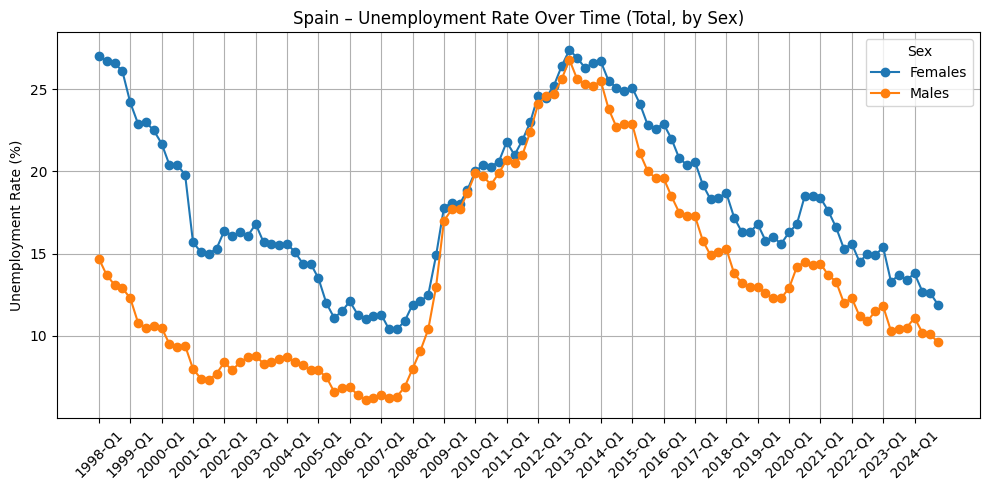

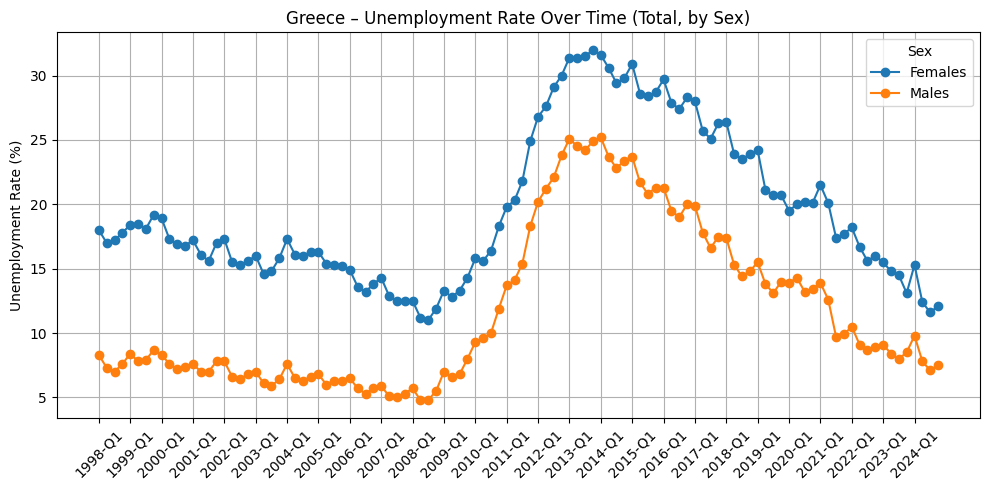

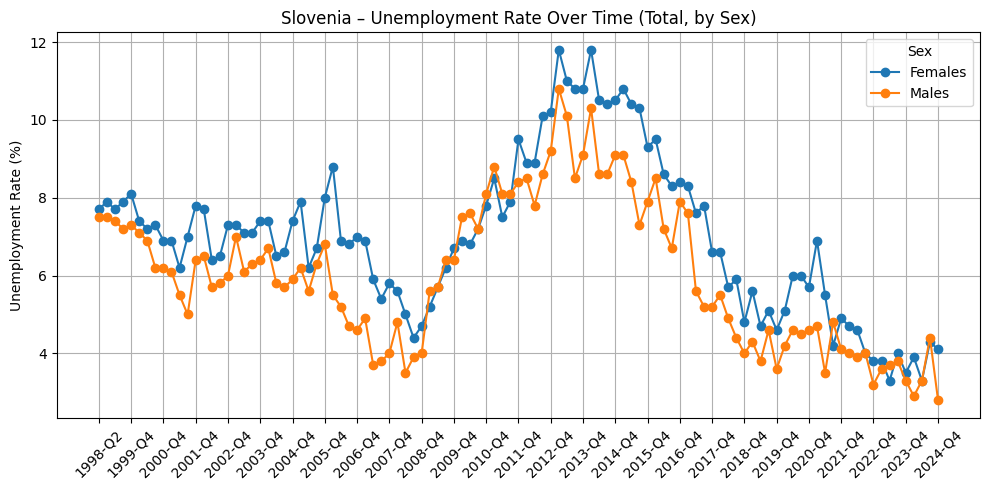

In [68]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]

df = ue_rate_df[
    (ue_rate_df['geo'].isin(selected_countries)) &
    (ue_rate_df['Sex'].isin(['Females', 'Males'])) &
    (ue_rate_df['citizenship'] == 'Total')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='quarter')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['quarter'], sex_data['unemployment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Unemployment Rate Over Time (Total, by Sex)")
    plt.ylabel("Unemployment Rate (%)")


    xticks = subset['quarter'].sort_values().unique()
    plt.xticks(xticks[::4], rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()


W przypadku stopy bez robocia nie ma znaczących różnic pomiędzy kobietami, a mężczyznami

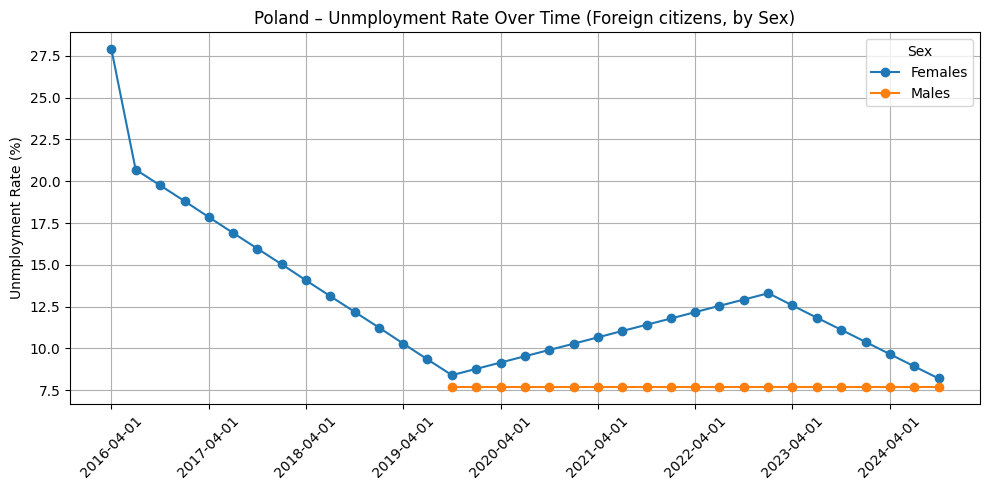

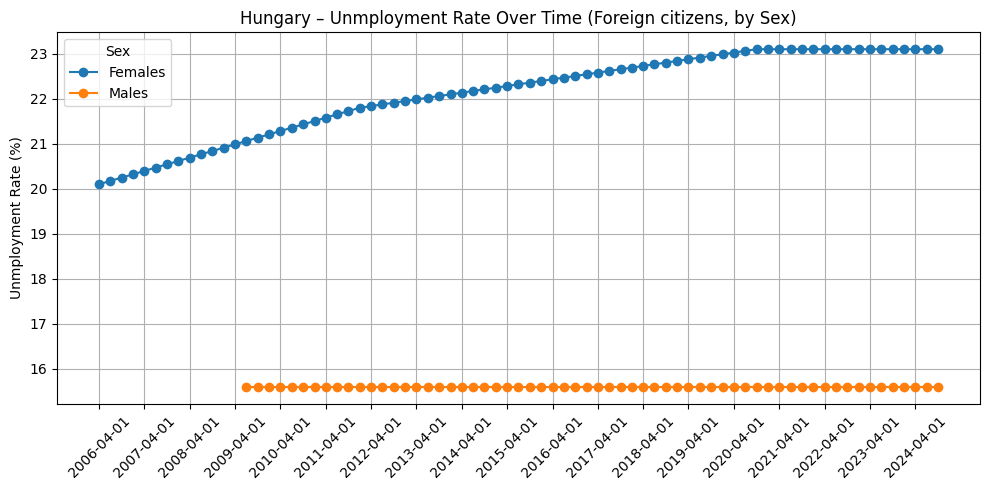

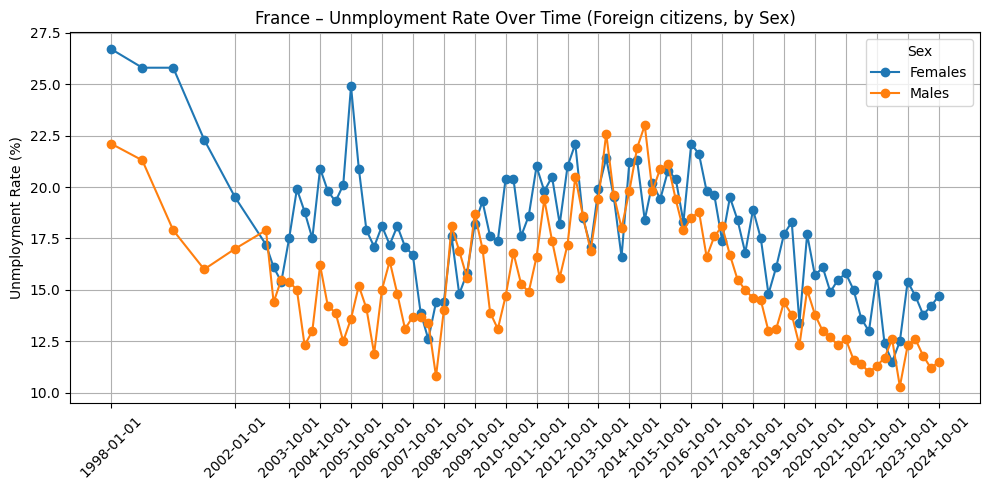

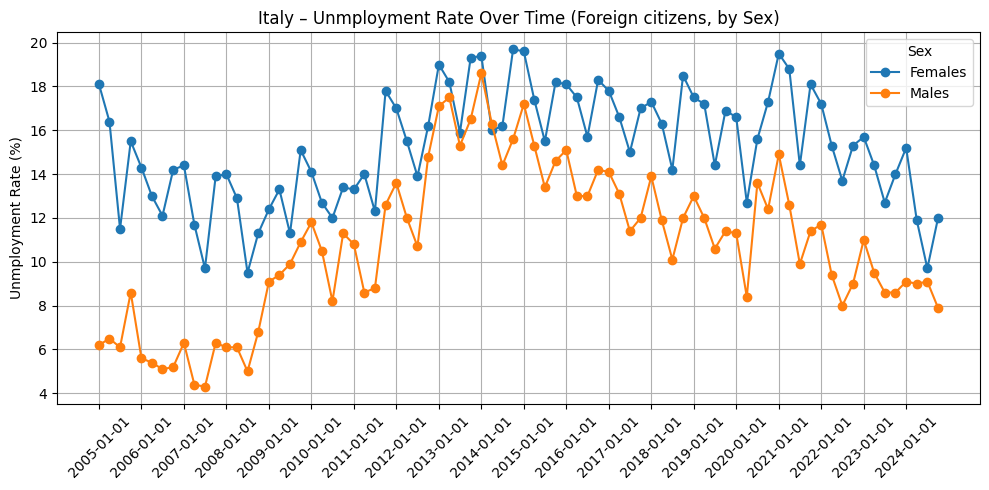

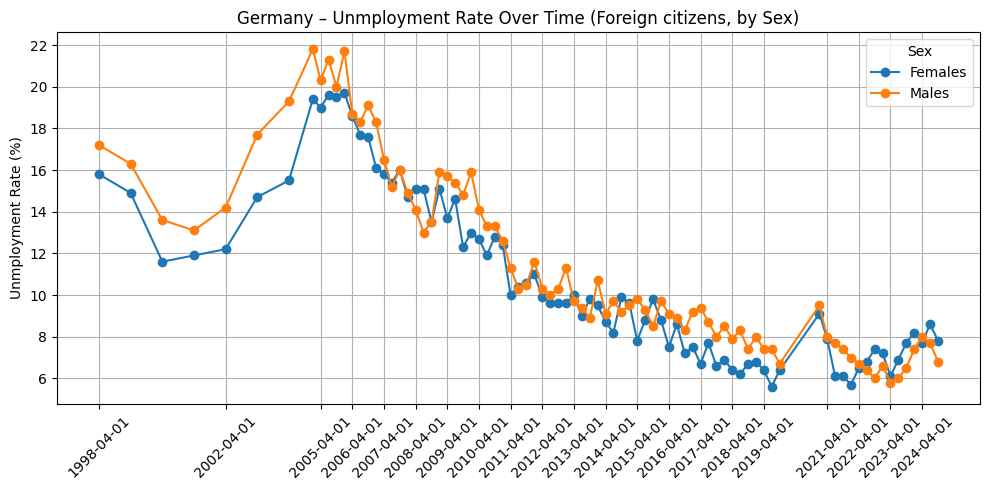

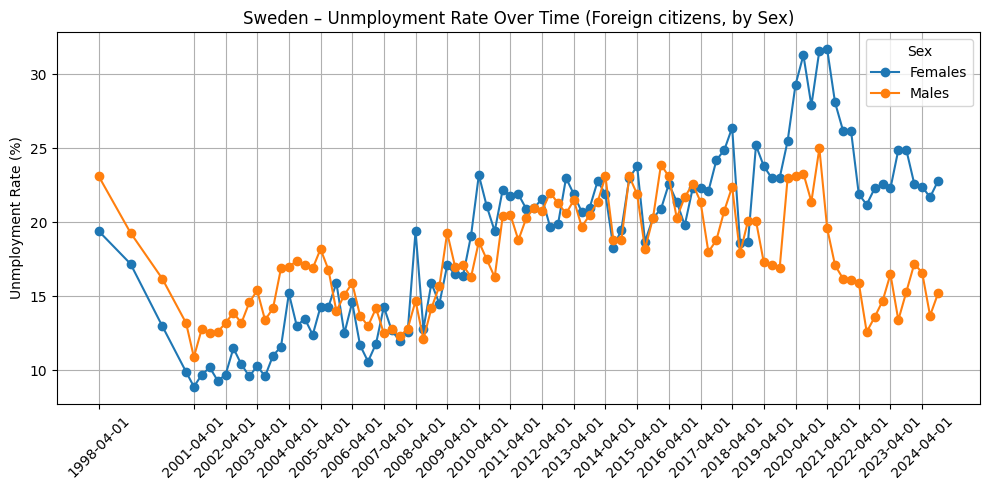

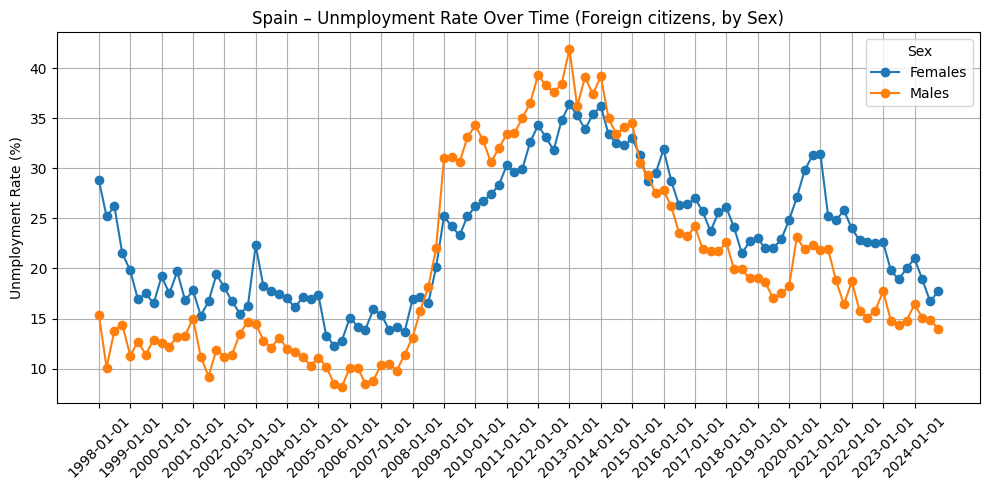

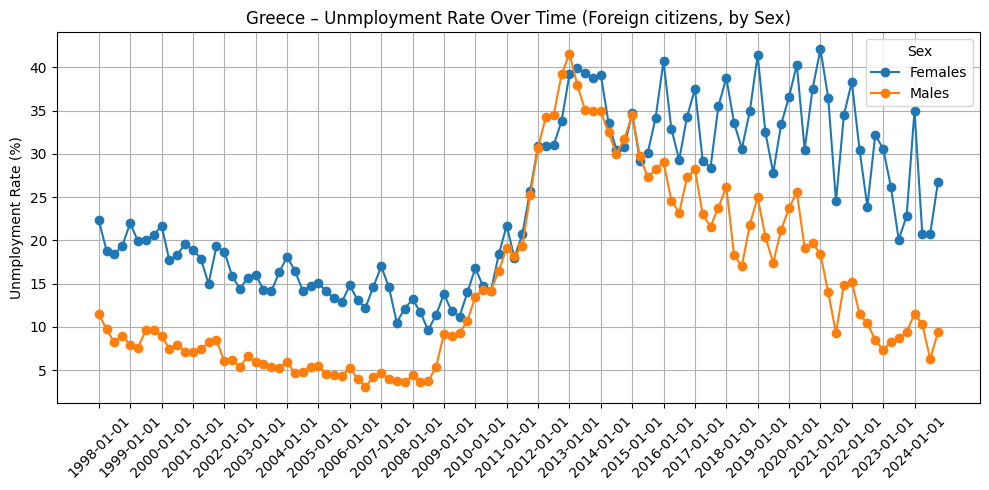

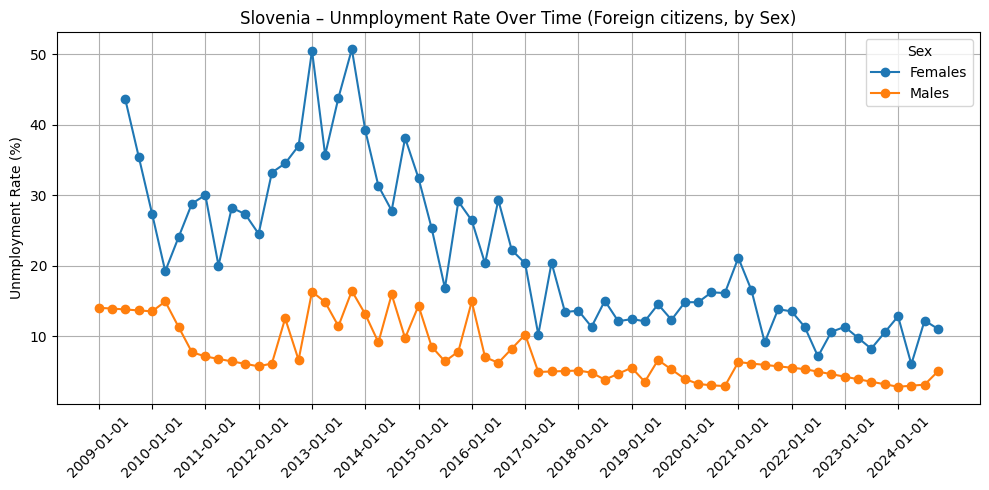

In [69]:
selected_countries = ["Poland", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]


df = ue_rate_df[
    (ue_rate_df['geo'].isin(selected_countries)) &
    (ue_rate_df['Sex'].isin(['Females', 'Males'])) &
    (ue_rate_df['citizenship'] == 'Foreign country')
].copy()

def quarter_to_datetime(q):
    year, qtr = q[:4], q[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(qtr, '01')
    return pd.to_datetime(f"{year}-{month}-01")

df['quarter_dt'] = df['quarter'].apply(quarter_to_datetime)

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values('quarter_dt')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['quarter_dt'], sex_data['unemployment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Unmployment Rate Over Time (Foreign citizens, by Sex)")
    plt.ylabel("Unmployment Rate (%)")

    xticks = subset['quarter_dt'].unique()
    plt.xticks(xticks[::4], rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()


# Employment by citizenship

Employment by citizenship per thousand people

In [70]:
emp_cit_df = pd.read_csv('../processed_data/employment_by_citizenship_lfsa_egan.csv')

In [71]:
emp_cit_df.head()

,sex,citizen,geo,year,Number per 1000 people
0,Females,EU27 countries (from 2020) except reporting co...,Austria,2014,149.5
1,Females,EU27 countries (from 2020) except reporting co...,Austria,2015,154.5
2,Females,EU27 countries (from 2020) except reporting co...,Austria,2016,170.6
3,Females,EU27 countries (from 2020) except reporting co...,Austria,2017,179.3
4,Females,EU27 countries (from 2020) except reporting co...,Austria,2018,189.1


### Analiza dla cudzoziemców w wybranych krajach

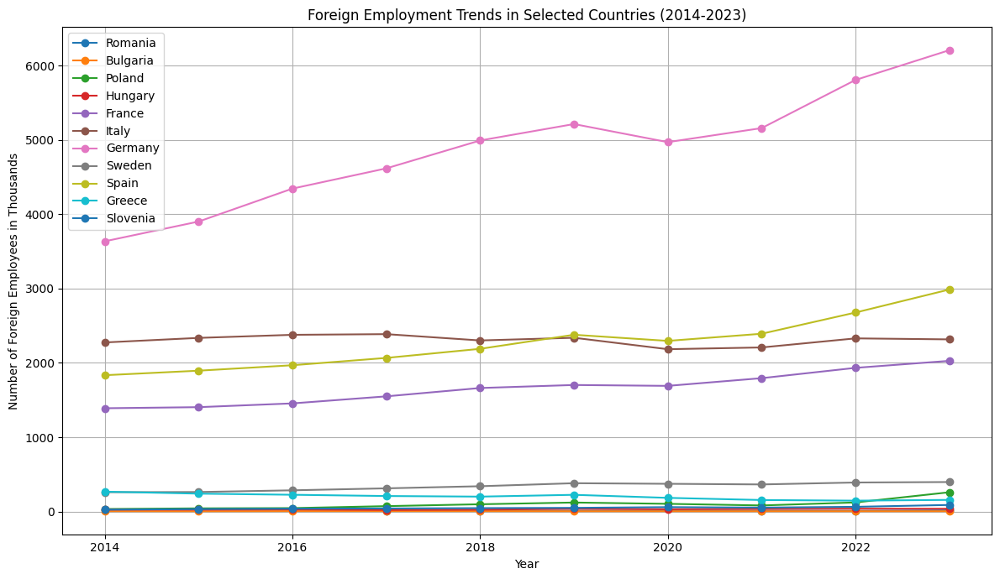

In [72]:
selected_countries = ["Romania", "Bulgaria", "Poland", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain", "Greece", "Slovenia"]

foreign_employment = emp_cit_df[
    (emp_cit_df['citizen'] == 'Foreign country') & 
    (emp_cit_df['geo'].isin(selected_countries))
]

plt.figure(figsize=(12, 7))
for country in selected_countries:
    data = foreign_employment[(foreign_employment['geo'] == country) & (foreign_employment['sex'] == "Total")]
    plt.plot(data['year'], data['Number per 1000 people'], marker='o', label=country)

plt.title('Foreign Employment Trends in Selected Countries (2014-2023)')
plt.xlabel('Year')
plt.ylabel('Number of Foreign Employees in Thousands')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

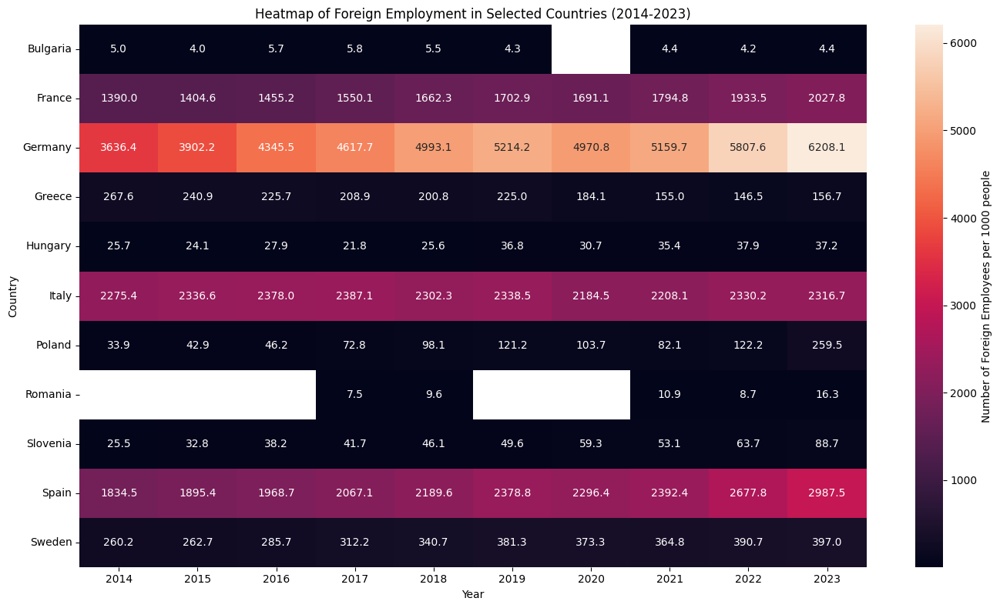

In [74]:
foreign_employment = emp_cit_df[
    (emp_cit_df['citizen'] == 'Foreign country') & 
    (emp_cit_df['geo'].isin(selected_countries)) &
    (emp_cit_df['sex'] == "Total")
]

heatmap_data = foreign_employment.pivot(index='geo', columns='year', values='Number per 1000 people')


plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".1f",  cbar_kws={'label': 'Number of Foreign Employees per 1000 people'})

plt.title('Heatmap of Foreign Employment in Selected Countries (2014-2023)')
plt.xlabel('Year')
plt.ylabel('Country')

plt.tight_layout()
plt.show()


### Trendy czasowe

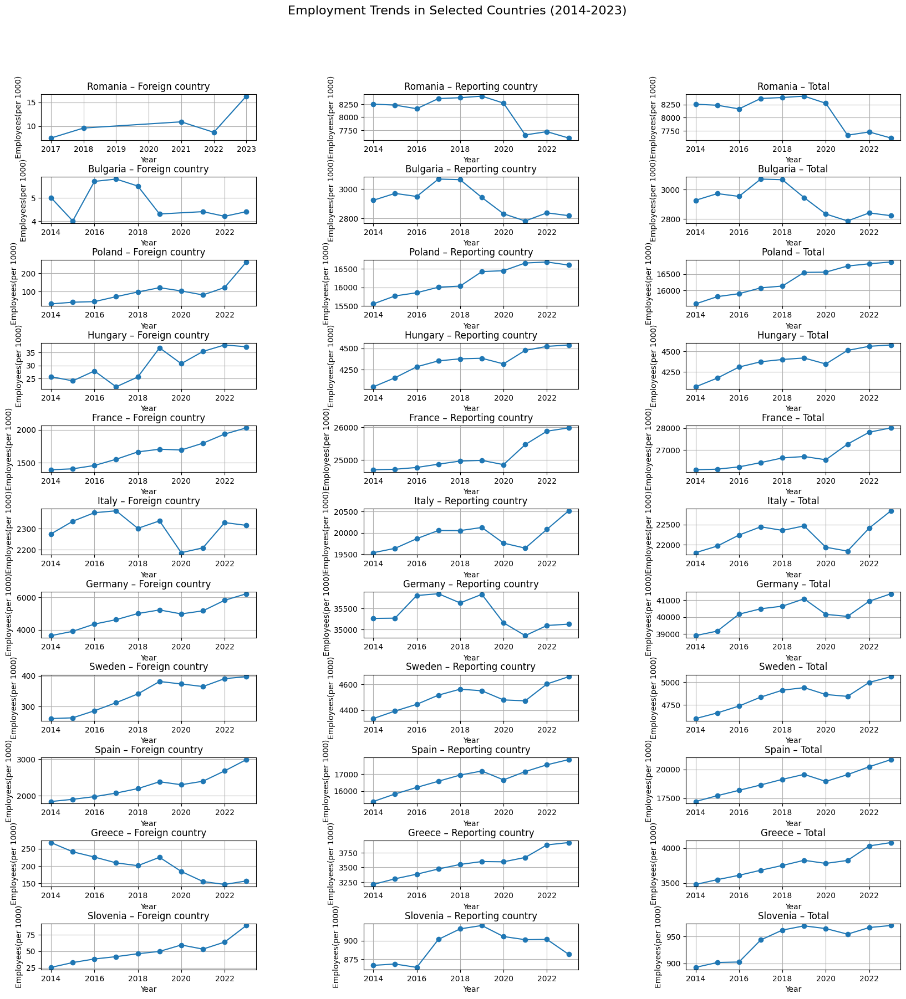

In [76]:
# subplots for each contry - Foreign vs Nationals vs Total trends
fig, axs = plt.subplots(len(selected_countries), 3)

fig.suptitle('Employment Trends in Selected Countries (2014-2023)', fontsize=16)
fig.subplots_adjust(top=0.9)
fig.subplots_adjust(hspace=0.8)
fig.subplots_adjust(wspace=0.5)
fig.set_size_inches(20, 20)

for country in selected_countries:
    data = emp_cit_df[(emp_cit_df['geo'] == country) & (emp_cit_df['sex'] == 'Total')]
    
    for i, citizenship in enumerate(['Foreign country', 'Reporting country', 'Total']):
        subset = data[data['citizen'] == citizenship]
        axs[selected_countries.index(country), i].plot(subset['year'], subset['Number per 1000 people'], marker='o')
        axs[selected_countries.index(country), i].set_title(f'{country} – {citizenship}')
        axs[selected_countries.index(country), i].set_xlabel('Year')
        axs[selected_countries.index(country), i].set_ylabel('Employees(per 1000)')
        axs[selected_countries.index(country), i].grid(True)

# Employment rates by sex and citizenship yearly

In [5]:
emp_an = pd.read_csv('../processed_data/employmnet_rates_yearly.csv')

In [7]:
emp_an.tail()

,citizenship,geo,employment_rate,year,Sex
7978,Total,United Kingdom,72.7,2015,Total
7979,Total,United Kingdom,73.5,2016,Total
7980,Total,United Kingdom,74.1,2017,Total
7981,Total,United Kingdom,74.7,2018,Total
7982,Total,United Kingdom,75.2,2019,Total


In [9]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain"]
df = emp_an[emp_an['geo'].isin(selected_countries)]

### Taka sama analiza jak dla danych kwartalnych

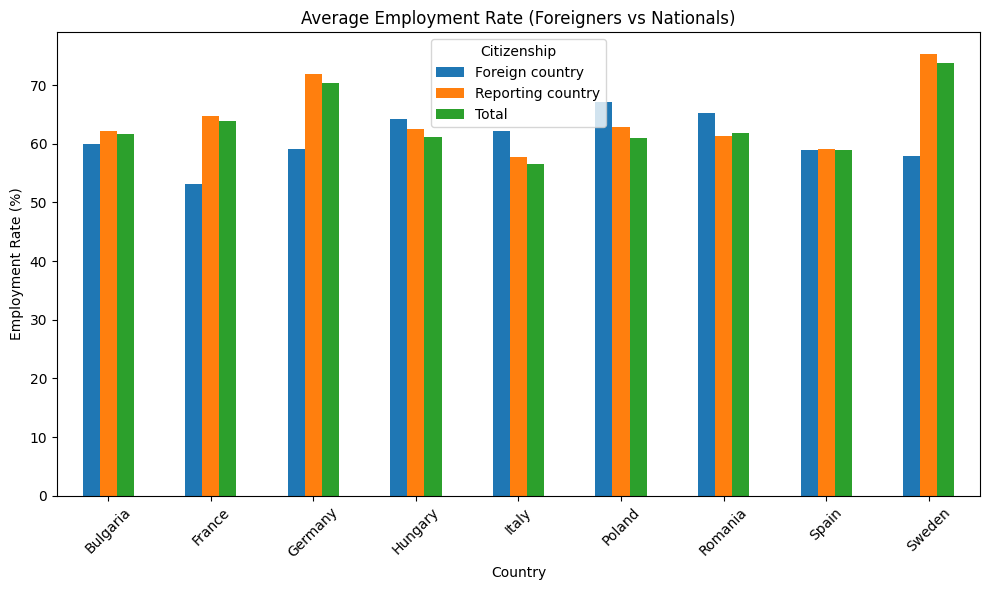

<Figure size 1200x600 with 0 Axes>

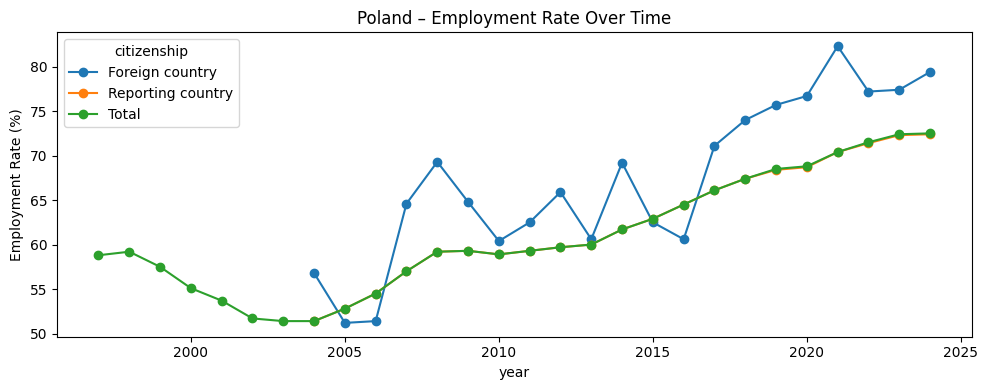

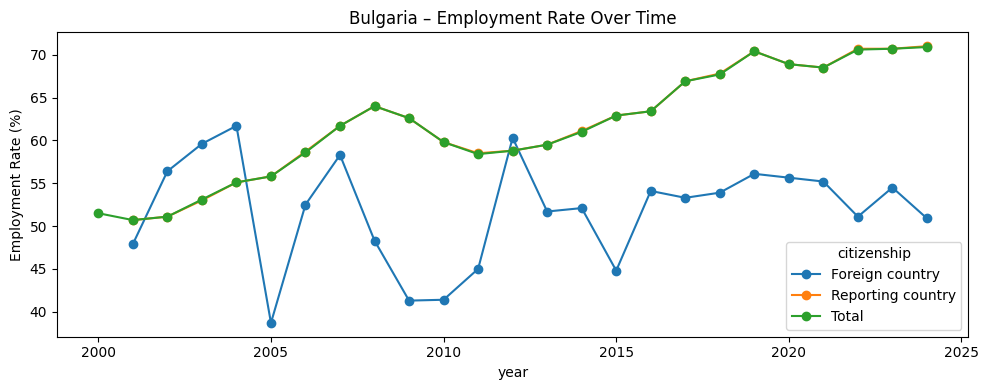

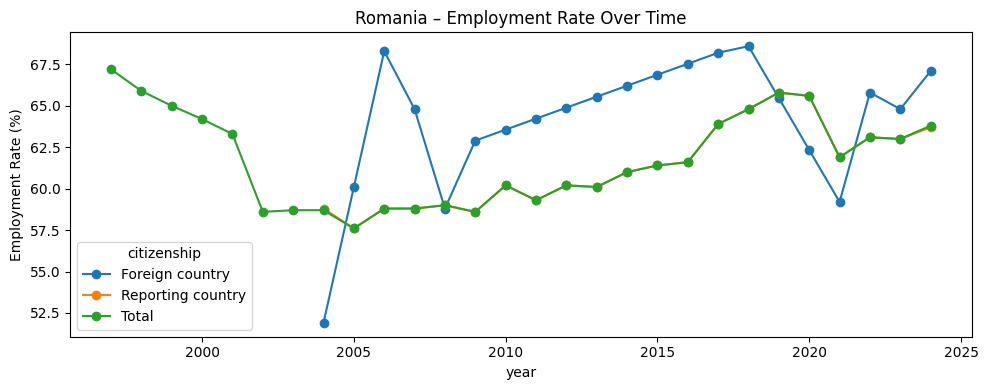

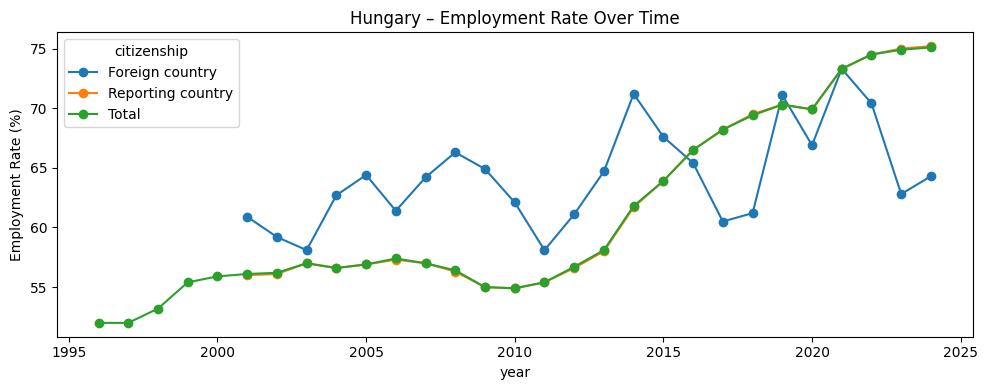

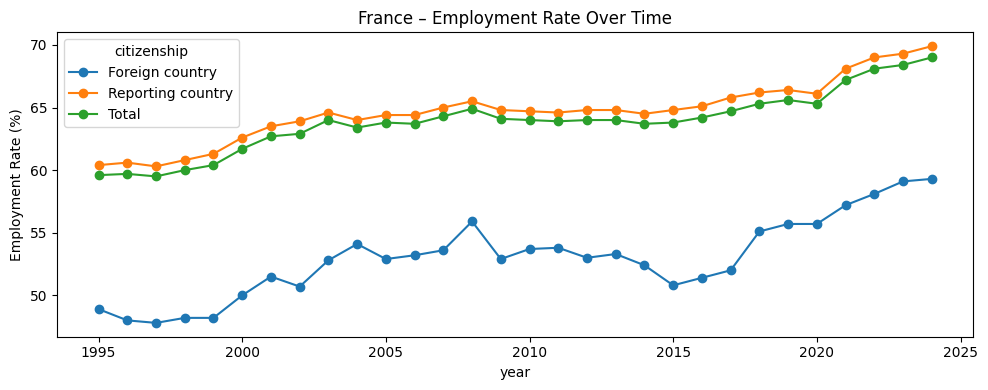

...

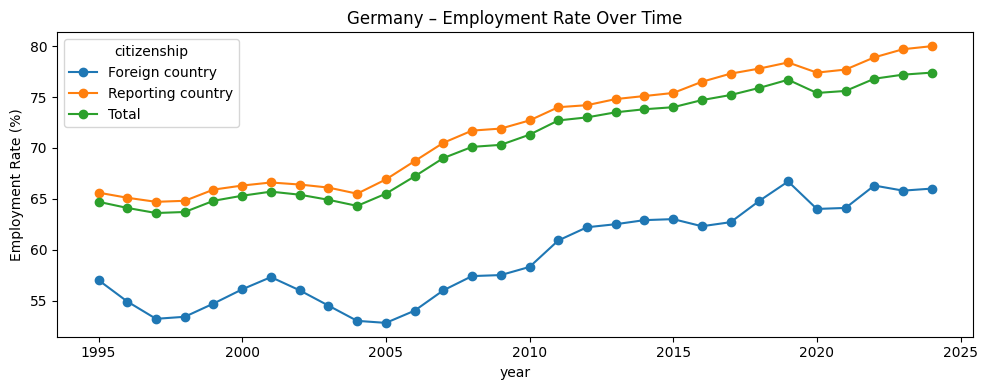

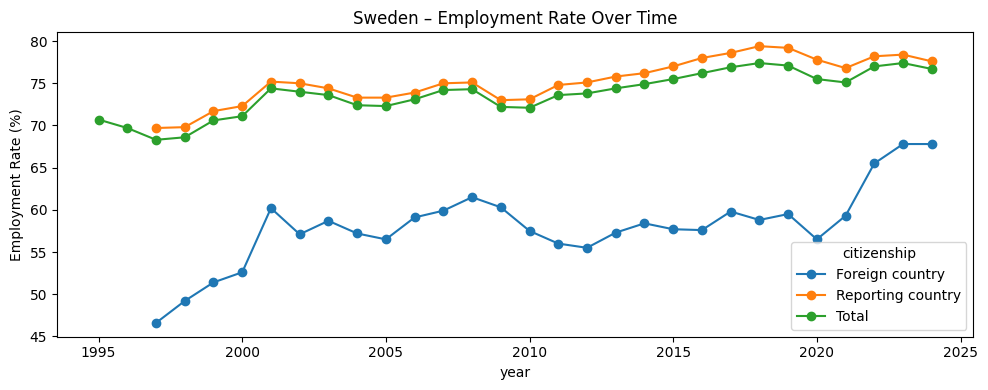

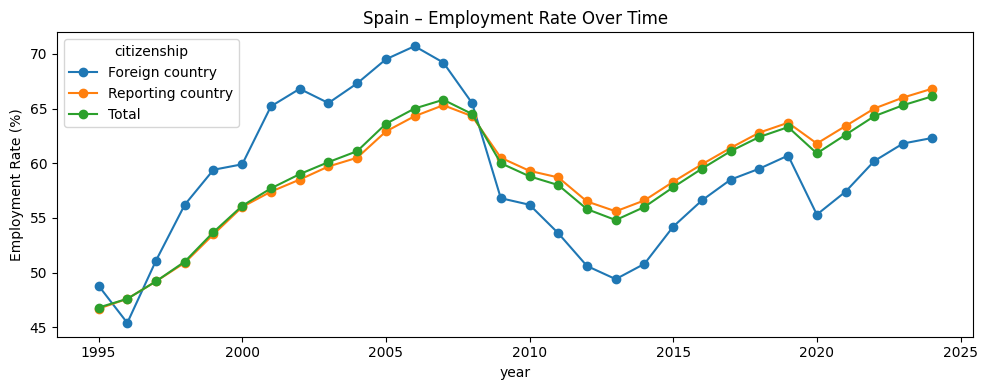

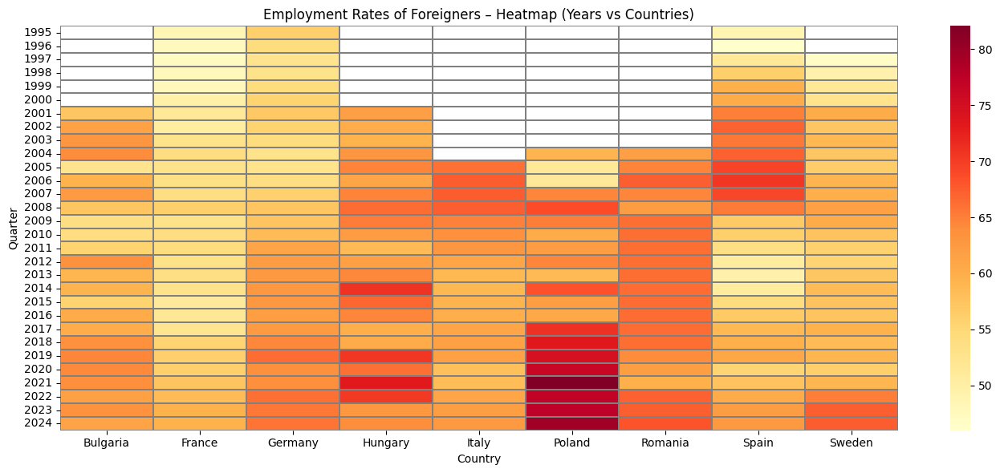

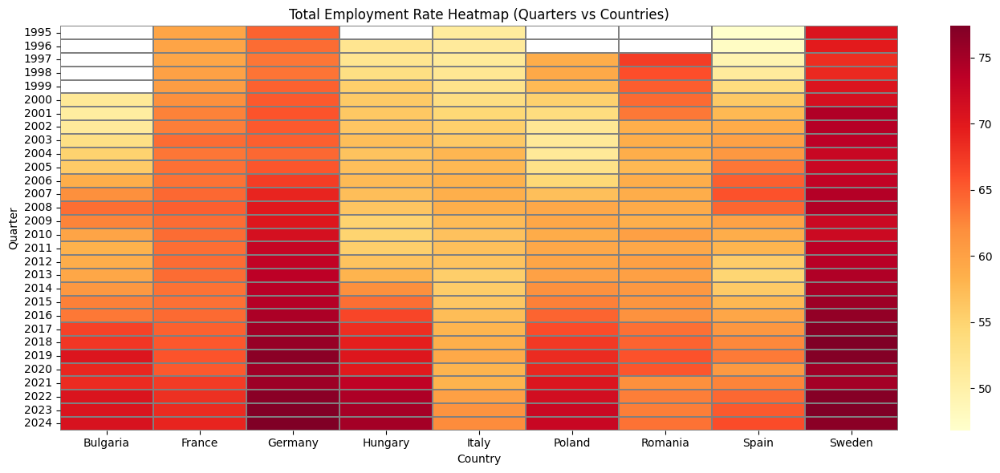

In [14]:
# Average employment rate by citizenship and country
pivot_mean = df.groupby(['geo', 'citizenship'])['employment_rate'].mean().unstack()

pivot_mean.plot(kind='bar', figsize=(10,6))
plt.title("Average Employment Rate (Foreigners vs Nationals)")
plt.ylabel("Employment Rate (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend(title="Citizenship")
plt.tight_layout()
plt.show()

# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in selected_countries:
    subset = df[(df['geo'] == country) & (df['citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='year', columns='citizenship', values='employment_rate')
    subset.plot(title=f"{country} – Employment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    plt.tight_layout()
    plt.show()

# Heatmap of foreigner employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Foreign country'].pivot_table(index='year', columns='geo', values='employment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Employment Rates of Foreigners – Heatmap (Years vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


# Heatmap of total employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Total'].pivot_table(index='year', columns='geo', values='employment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Total Employment Rate Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


### Analizy związane z płcią - Total

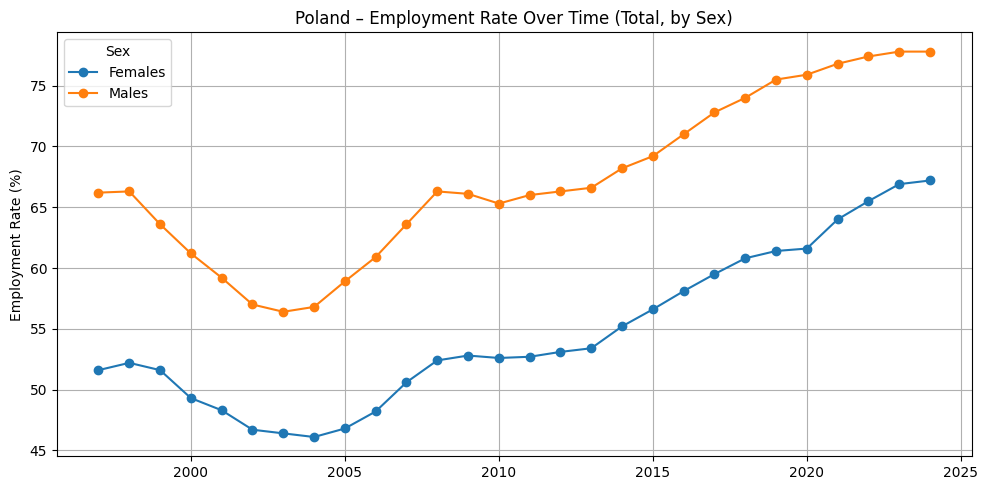

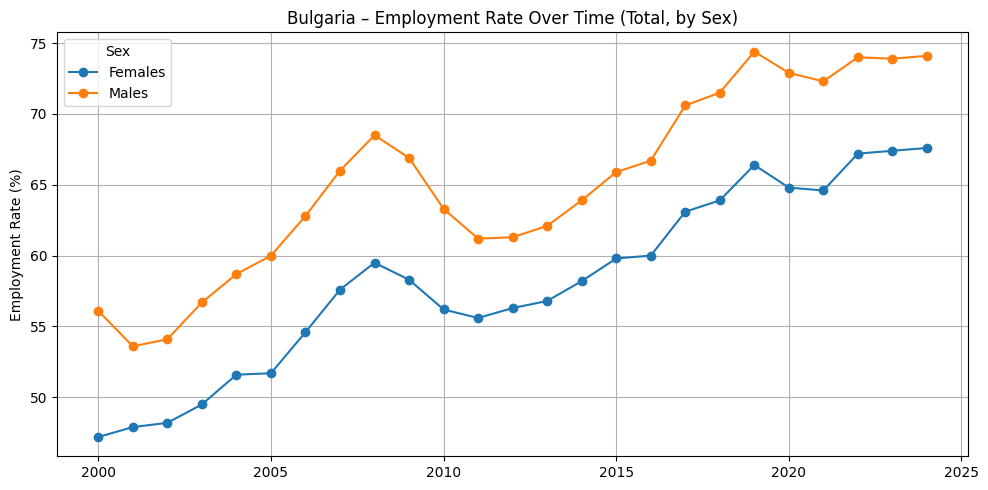

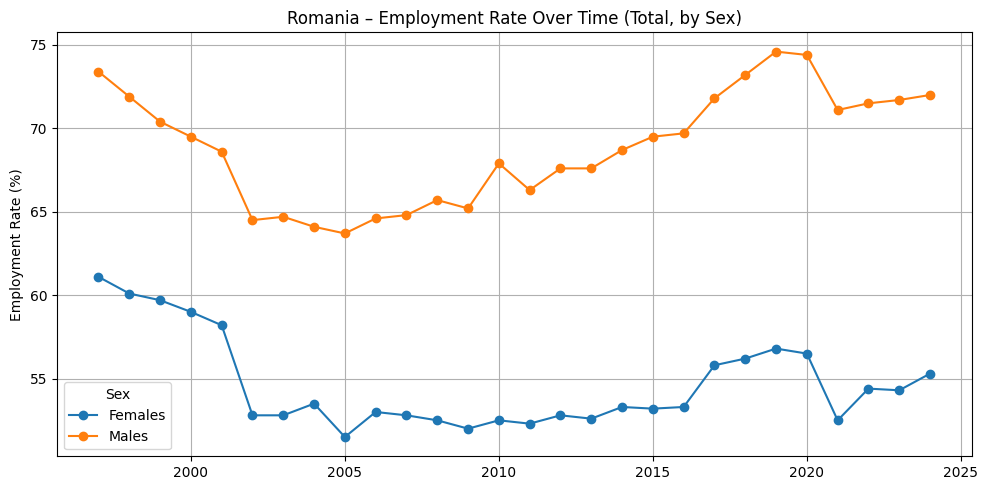

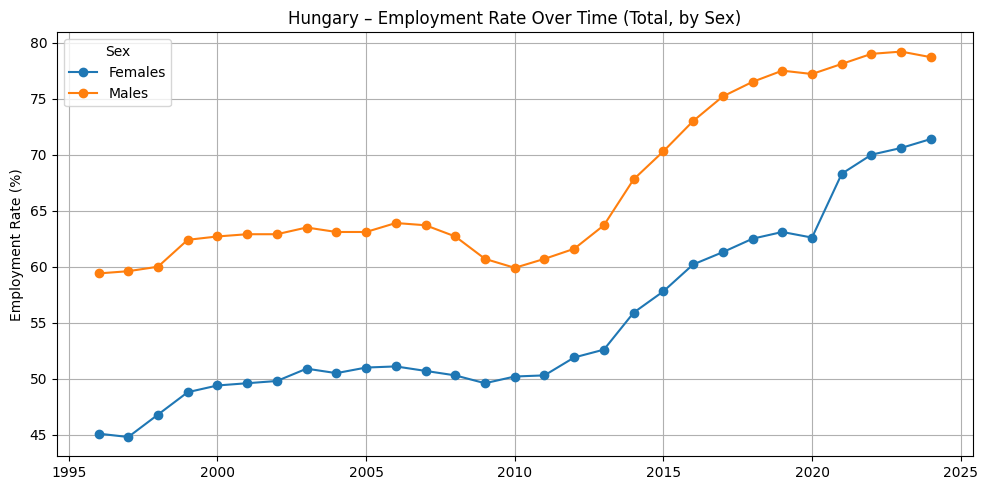

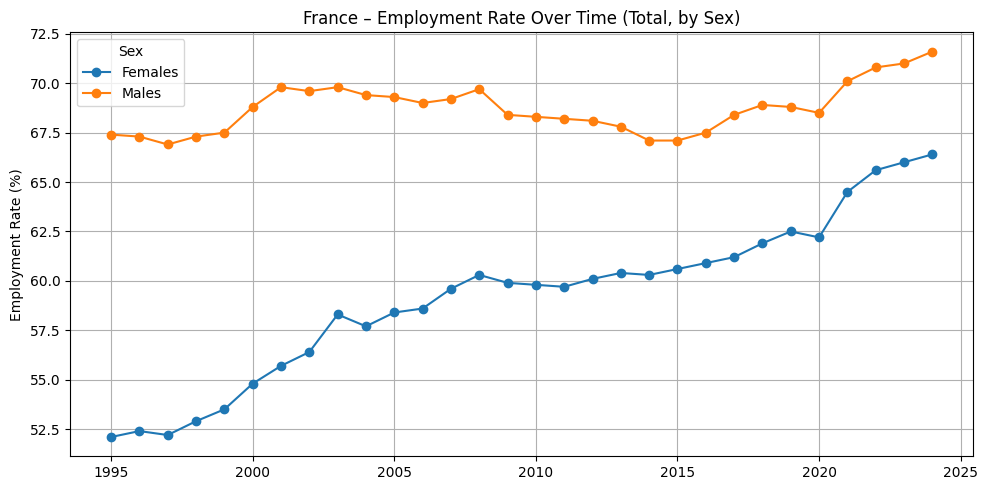

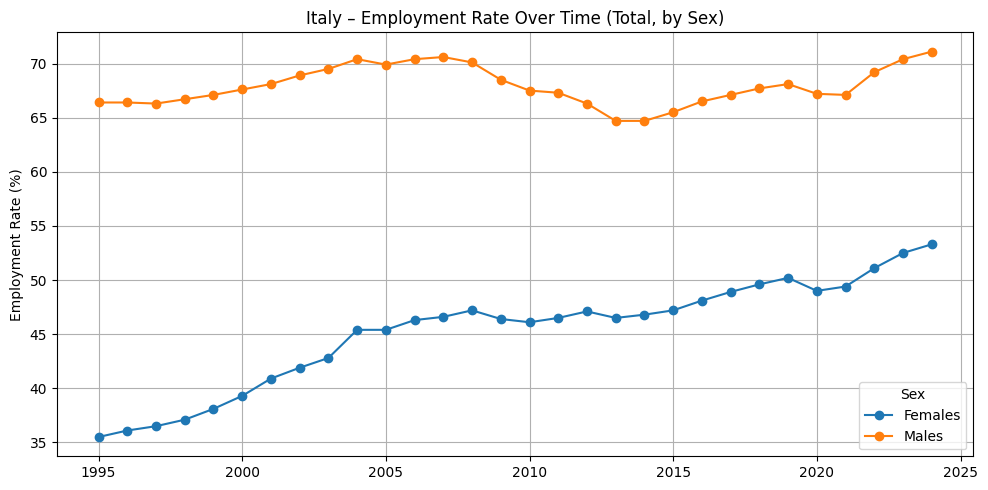

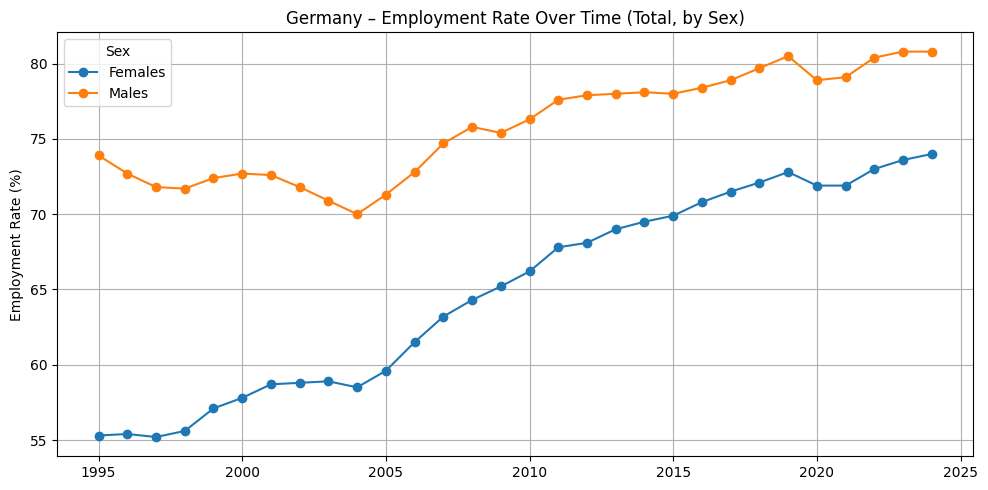

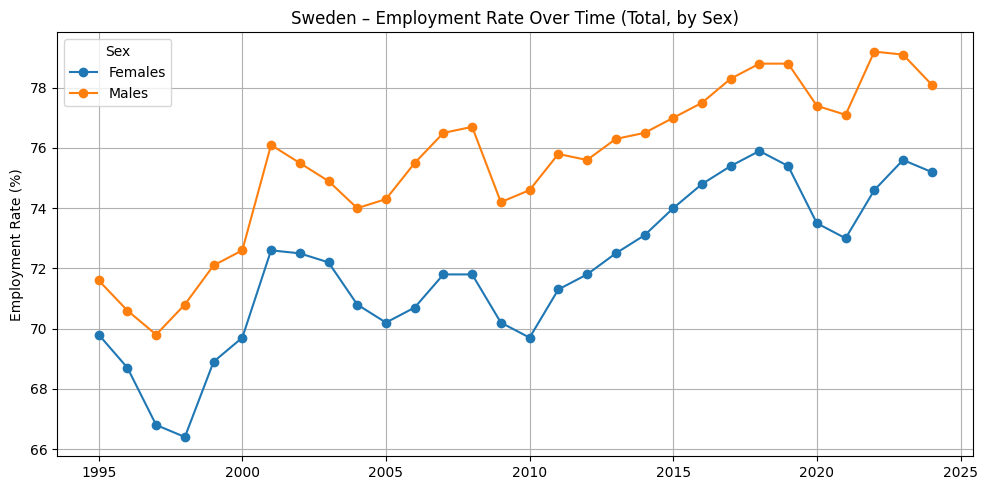

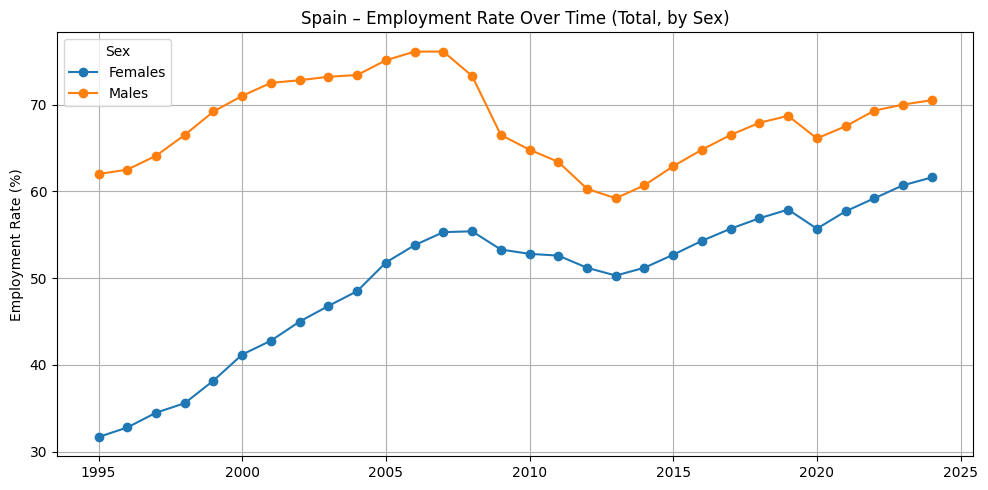

In [20]:
df = emp_an[
    (emp_an ['geo'].isin(selected_countries)) &
    (emp_an ['Sex'].isin(['Females', 'Males'])) &
    (emp_an ['citizenship'] == 'Total')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='year')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['year'], sex_data['employment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Employment Rate Over Time (Total, by Sex)")
    plt.ylabel("Employment Rate (%)")

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()

### Analizy związane z płcią - Foreign country

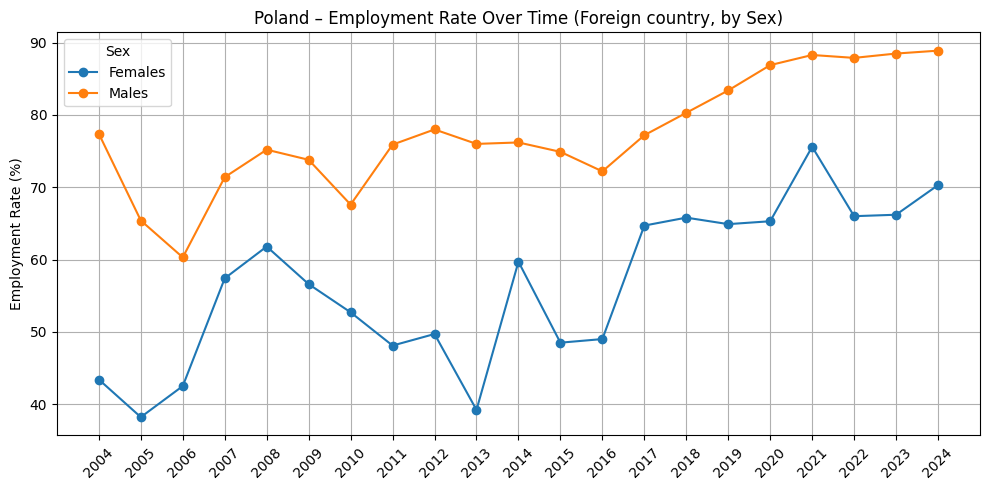

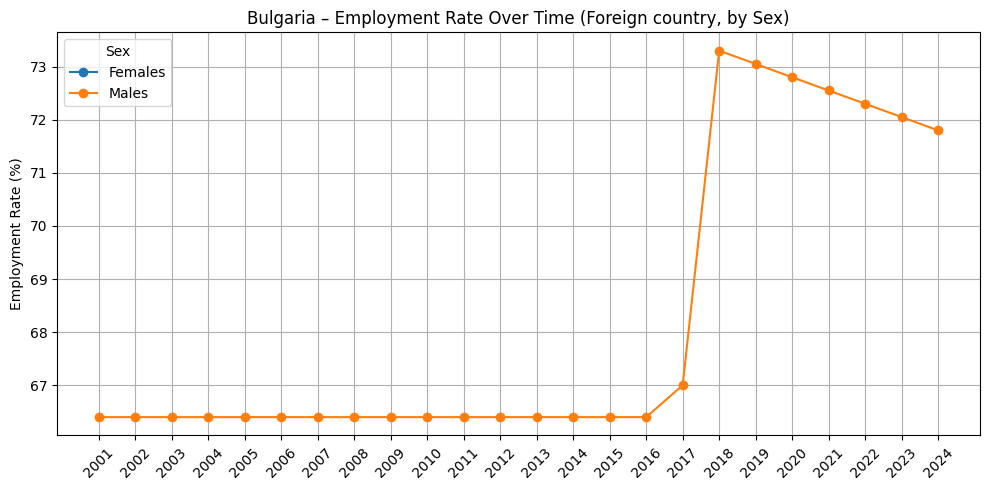

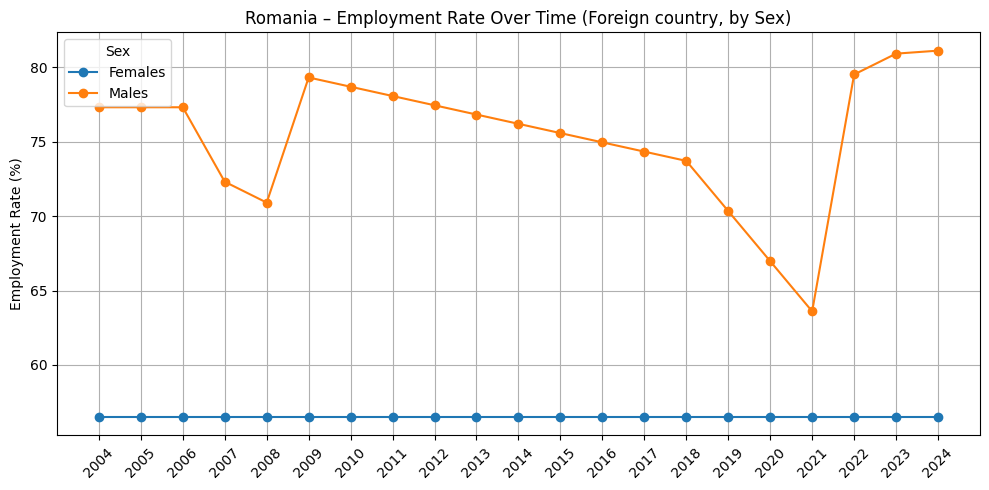

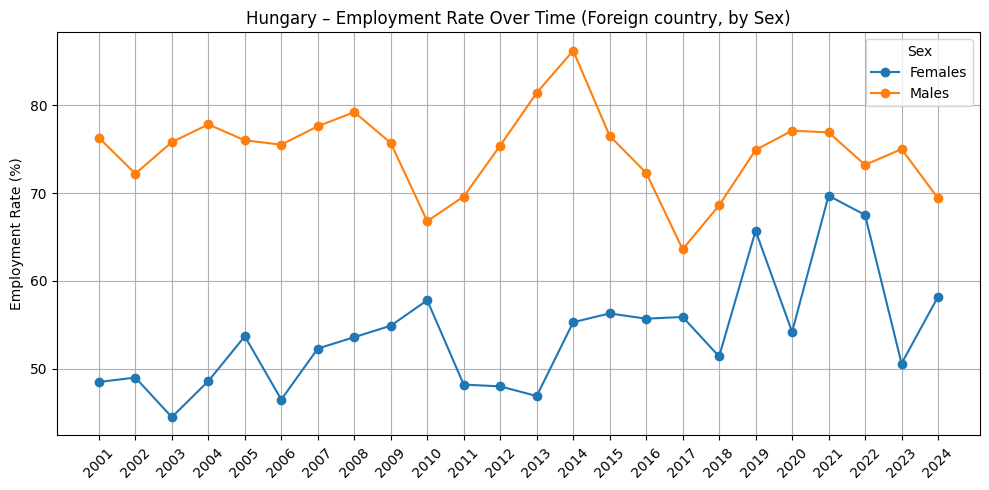

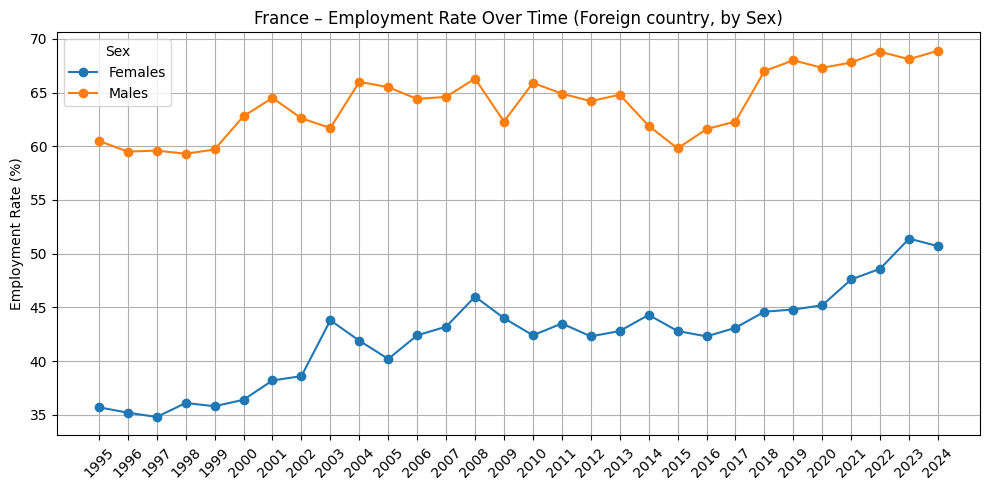

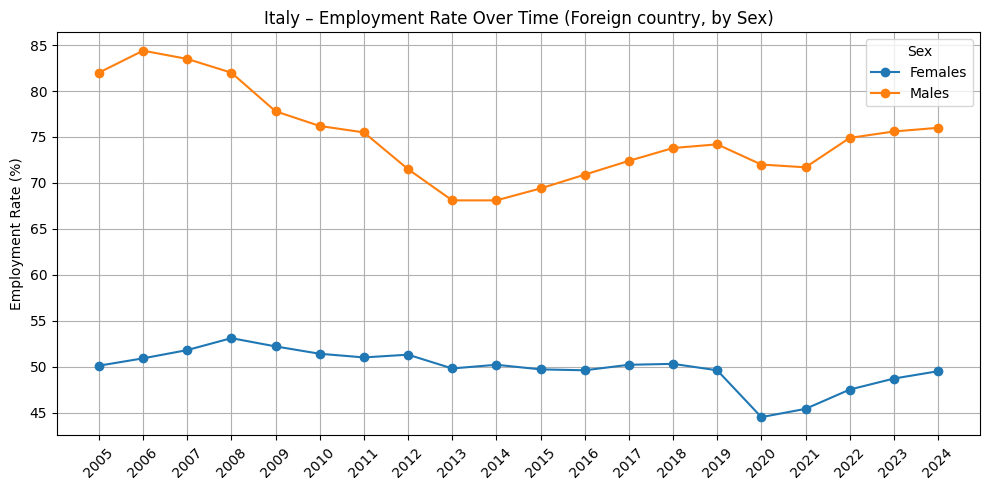

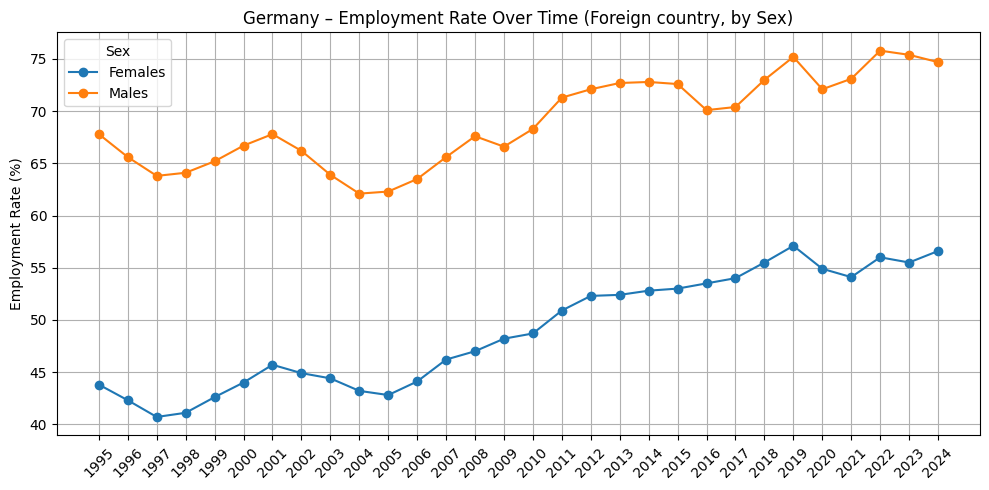

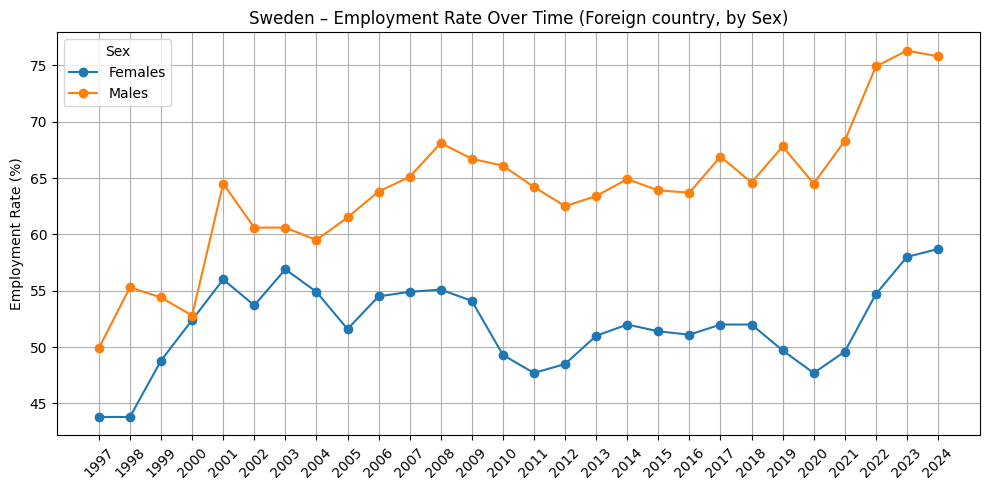

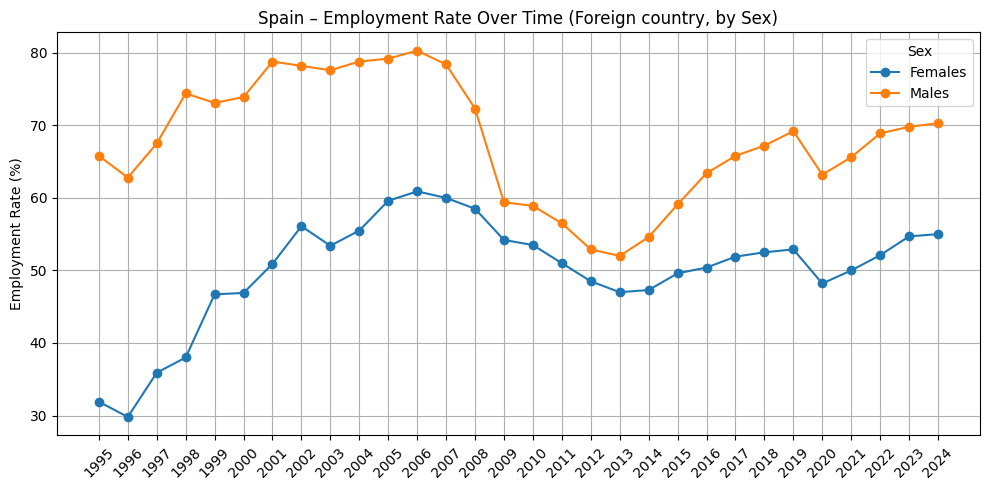

In [40]:
df = emp_an[
    (emp_an ['geo'].isin(selected_countries)) &
    (emp_an ['Sex'].isin(['Females', 'Males'])) &
    (emp_an ['citizenship'] == 'Foreign country')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='year')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['year'], sex_data['employment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Employment Rate Over Time (Foreign country, by Sex)")
    plt.ylabel("Employment Rate (%)")
    xticks = subset['year'].sort_values().unique()
    plt.xticks(xticks, rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()

# Unemployment rates by sex, citizenship yearly

In [30]:
uemp_an = pd.read_csv('../processed_data/unemploymnet_rates_yearly.csv')


In [31]:
uemp_an.head()

,citizenship,geo,unemployment_rate,year,Sex
0,Foreign country,Austria,7.8,1995,Females
1,Foreign country,Austria,9.4,1996,Females
2,Foreign country,Austria,9.4,1997,Females
3,Foreign country,Austria,8.9,1998,Females
4,Foreign country,Austria,9.2,1999,Females


In [32]:
selected_countries = ["Poland", "Bulgaria", "Romania", "Hungary", "France", "Italy", "Germany", "Sweden", "Spain"]
df = uemp_an[uemp_an['geo'].isin(selected_countries)]

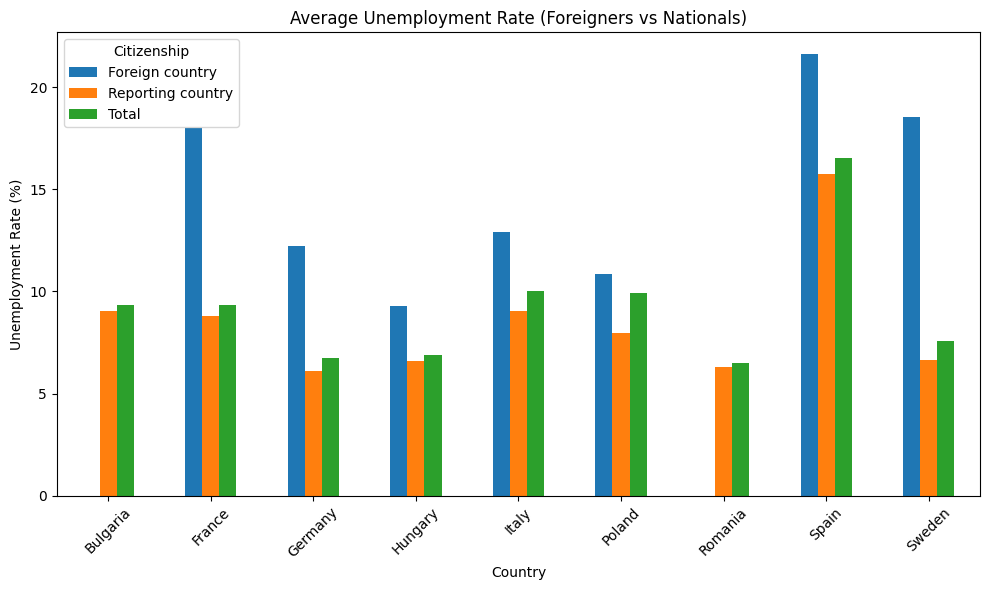

<Figure size 1200x600 with 0 Axes>

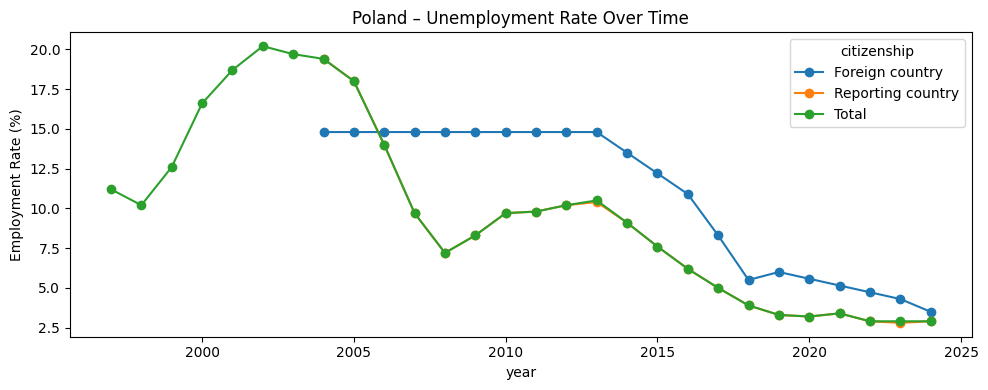

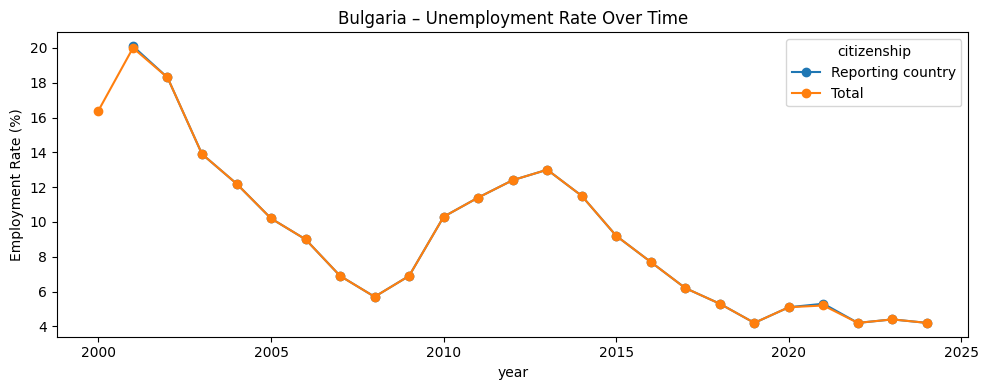

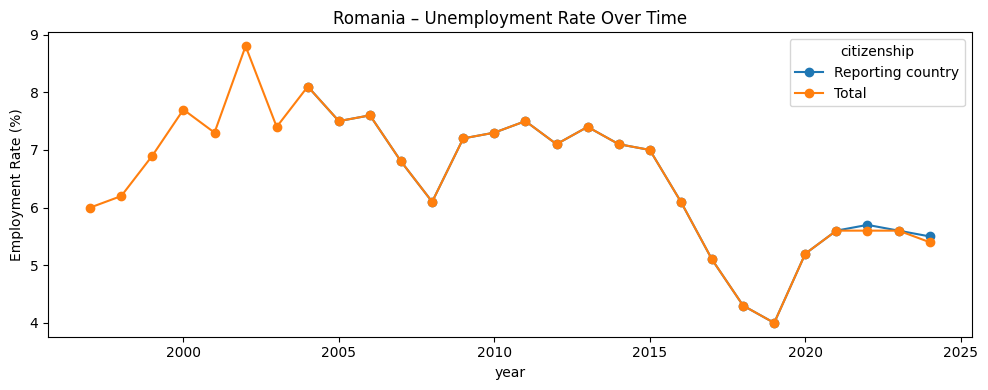

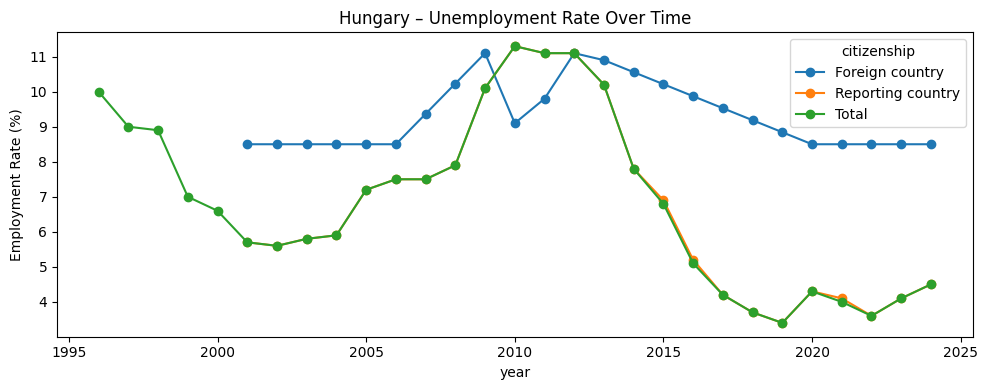

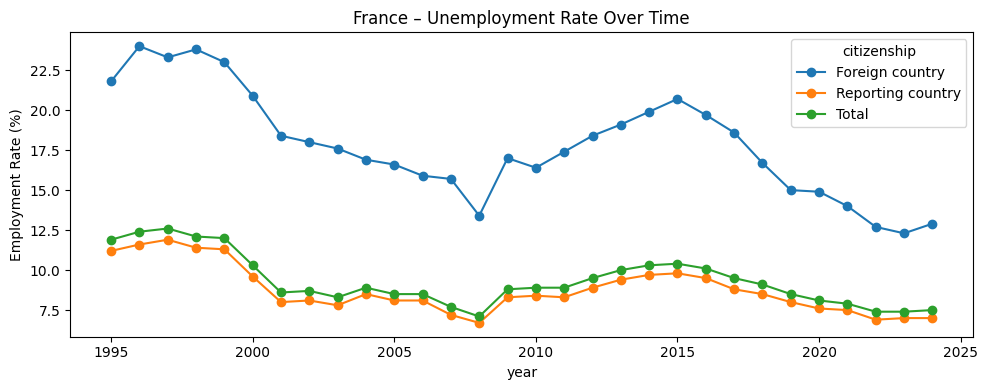

...

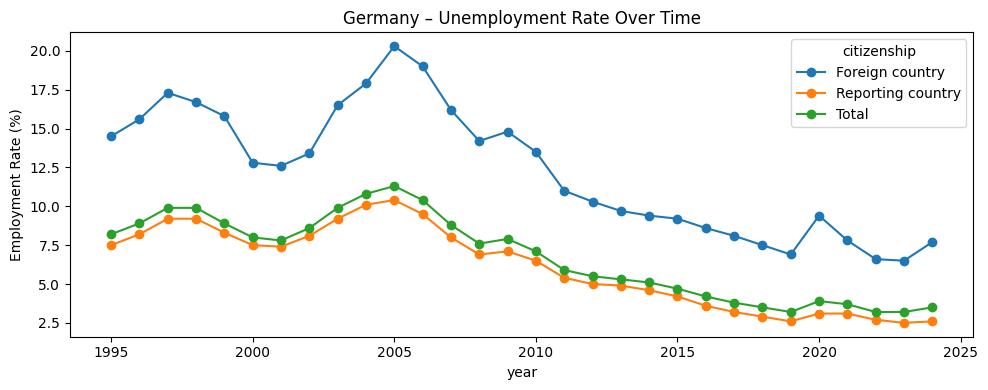

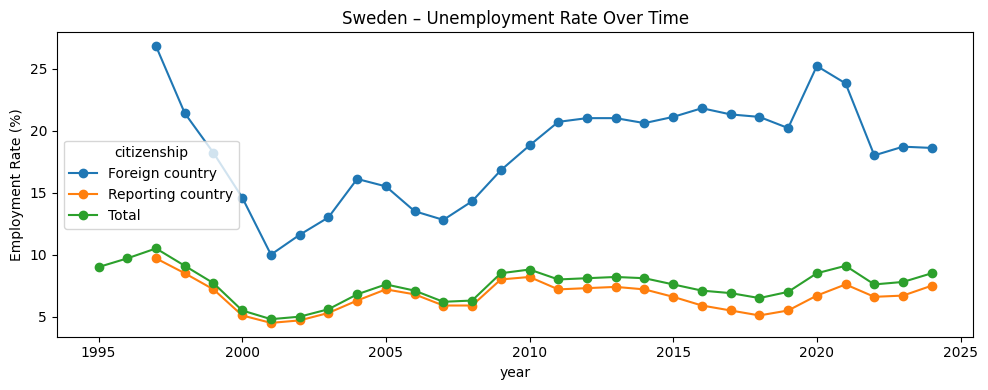

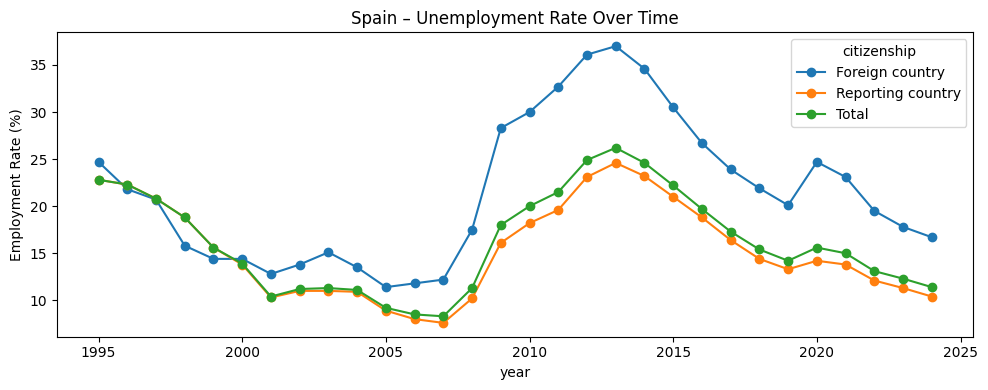

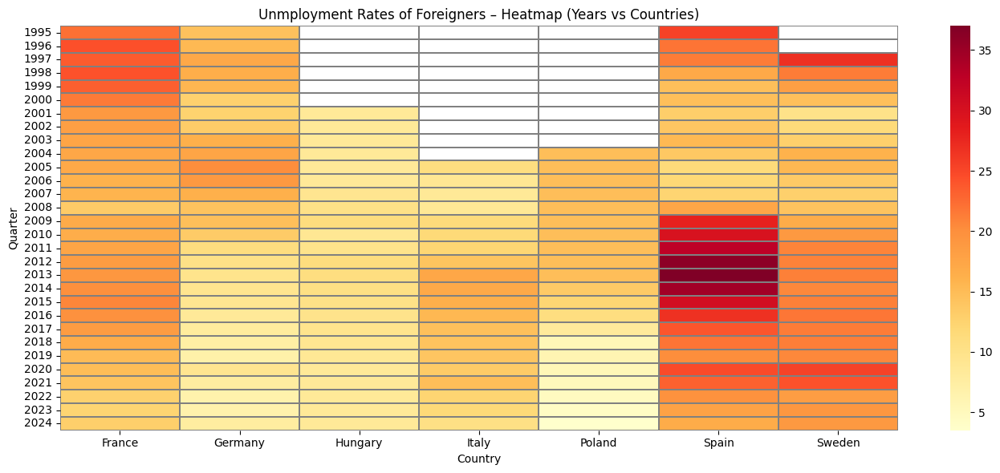

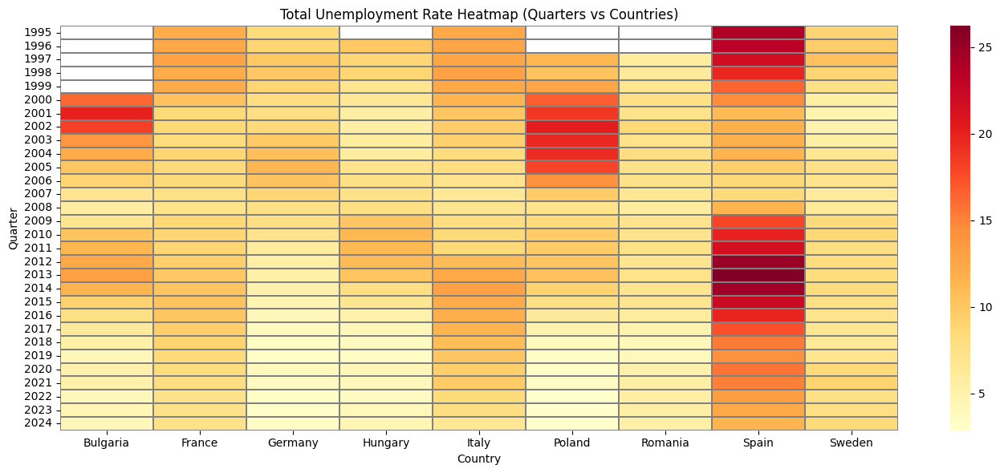

In [33]:
# Average employment rate by citizenship and country
pivot_mean = df.groupby(['geo', 'citizenship'])['unemployment_rate'].mean().unstack()

pivot_mean.plot(kind='bar', figsize=(10,6))
plt.title("Average Unemployment Rate (Foreigners vs Nationals)")
plt.ylabel("Unemployment Rate (%)")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.legend(title="Citizenship")
plt.tight_layout()
plt.show()

# Trends over time – for each selected country
plt.figure(figsize=(12,6))
for country in selected_countries:
    subset = df[(df['geo'] == country) & (df['citizenship'].isin(['Reporting country', 'Foreign country', 'Total']) & (df['Sex'] == 'Total'))]
    subset = subset.pivot_table(index='year', columns='citizenship', values='unemployment_rate')
    subset.plot(title=f"{country} – Unemployment Rate Over Time", figsize=(10,4), marker='o')
    plt.ylabel("Employment Rate (%)")
    plt.tight_layout()
    plt.show()

# Heatmap of foreigner employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Foreign country'].pivot_table(index='year', columns='geo', values='unemployment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Unmployment Rates of Foreigners – Heatmap (Years vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()


# Heatmap of total employment rates by country and quarter
heatmap_data = df[df['citizenship'] == 'Total'].pivot_table(index='year', columns='geo', values='unemployment_rate')

plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data.astype(float), cmap="YlOrRd", linewidths=0.2, linecolor='gray')
plt.title("Total Unemployment Rate Heatmap (Quarters vs Countries)")
plt.ylabel("Quarter")
plt.xlabel("Country")
plt.tight_layout()
plt.show()



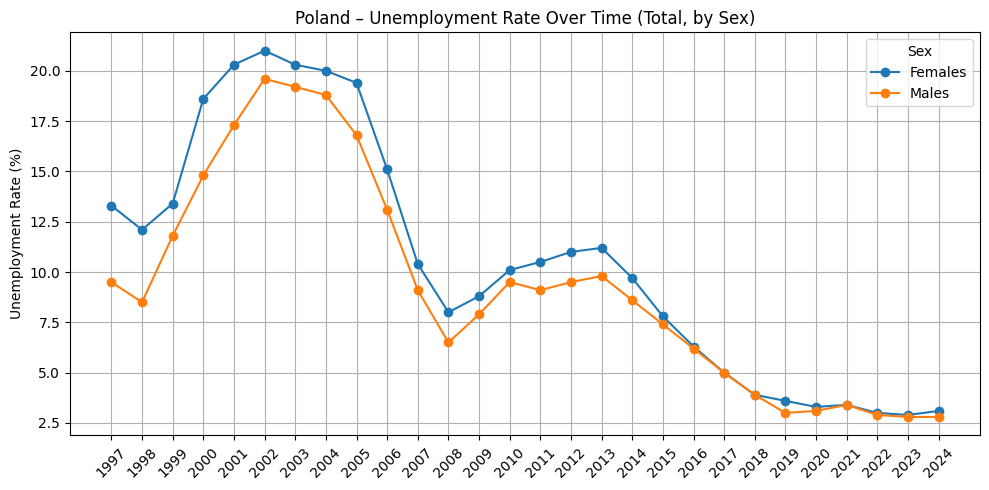

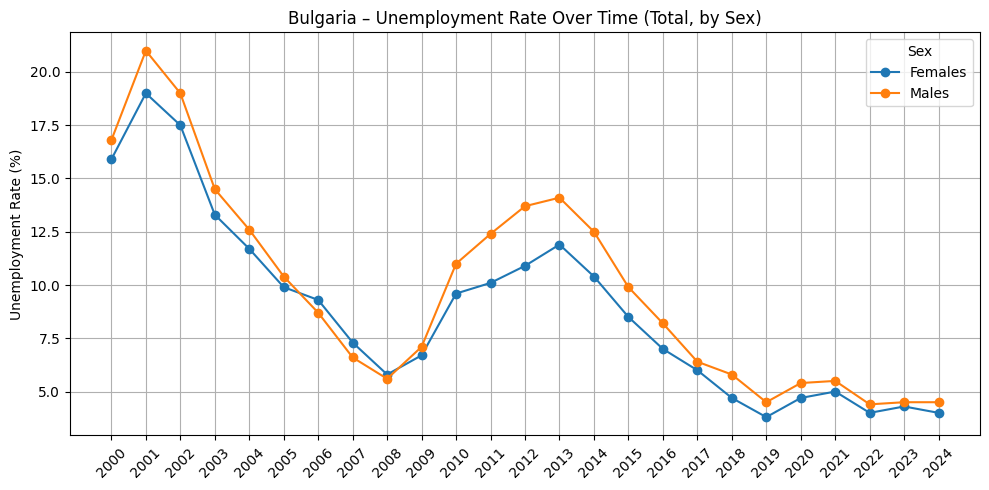

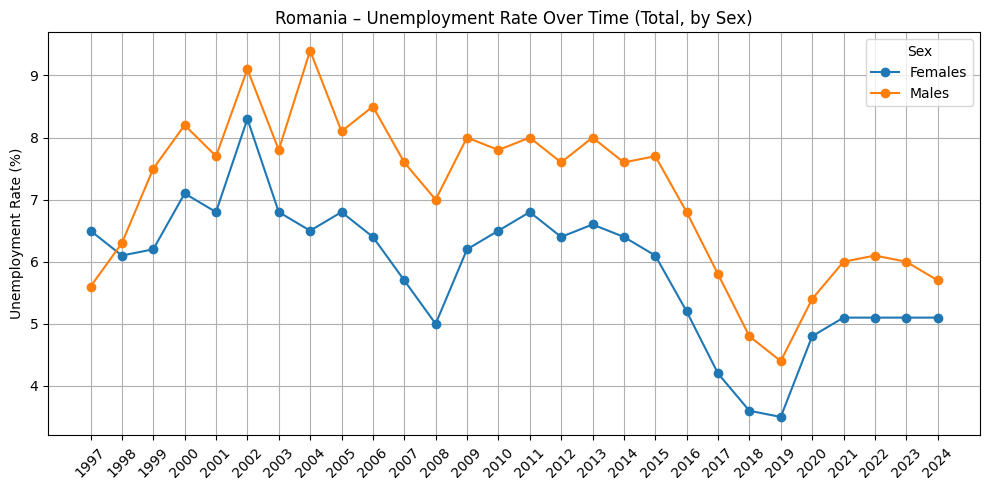

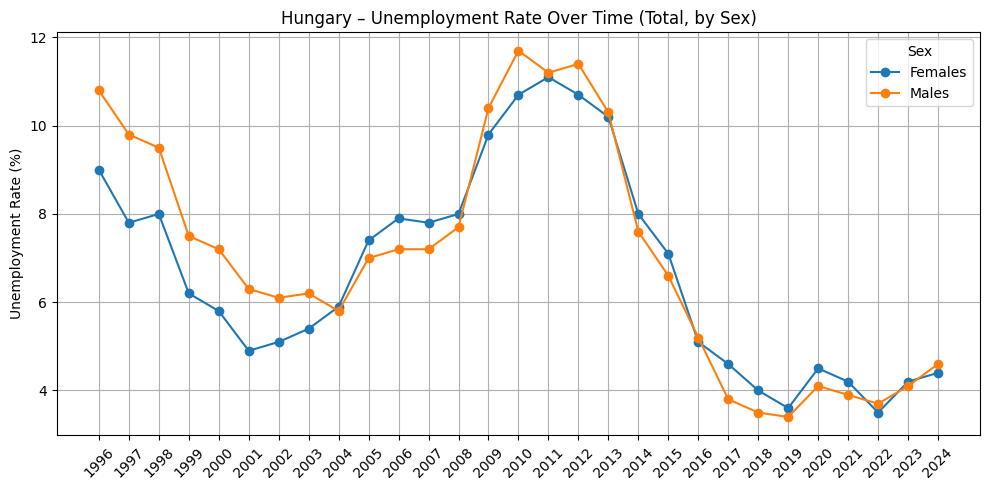

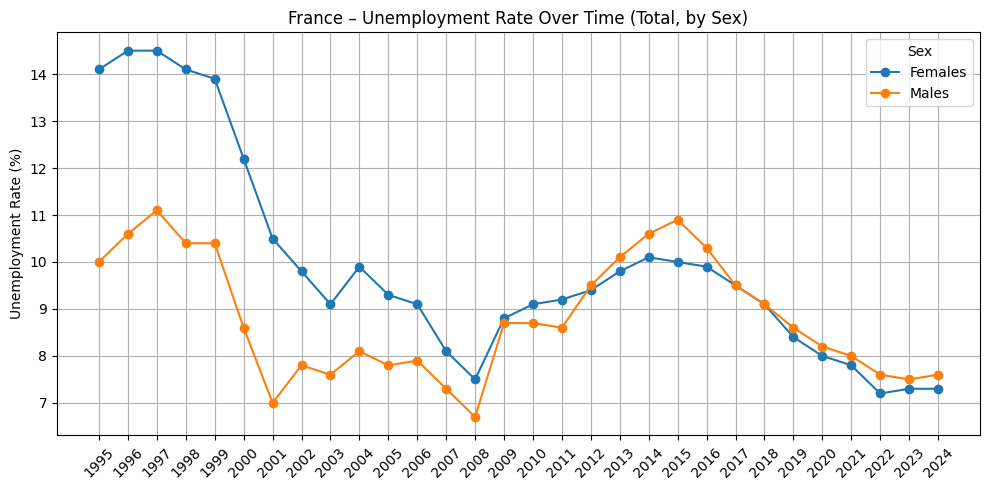

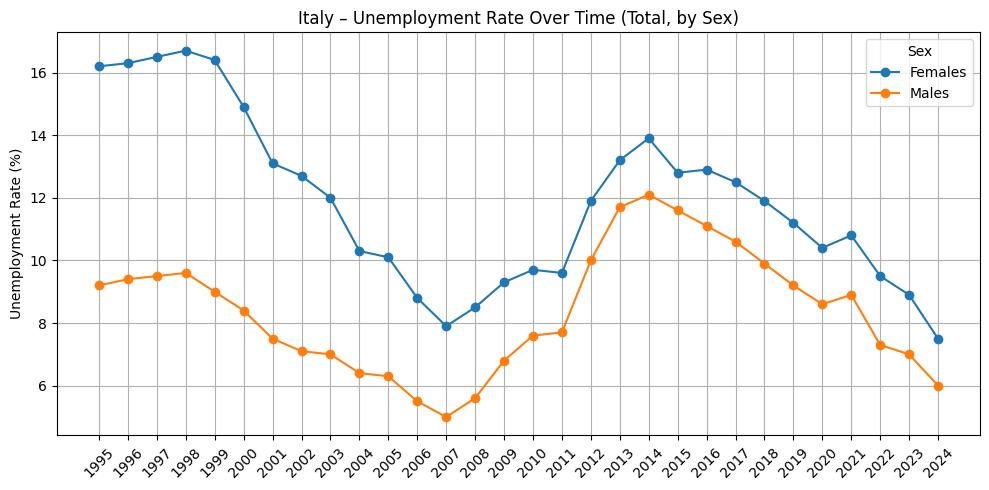

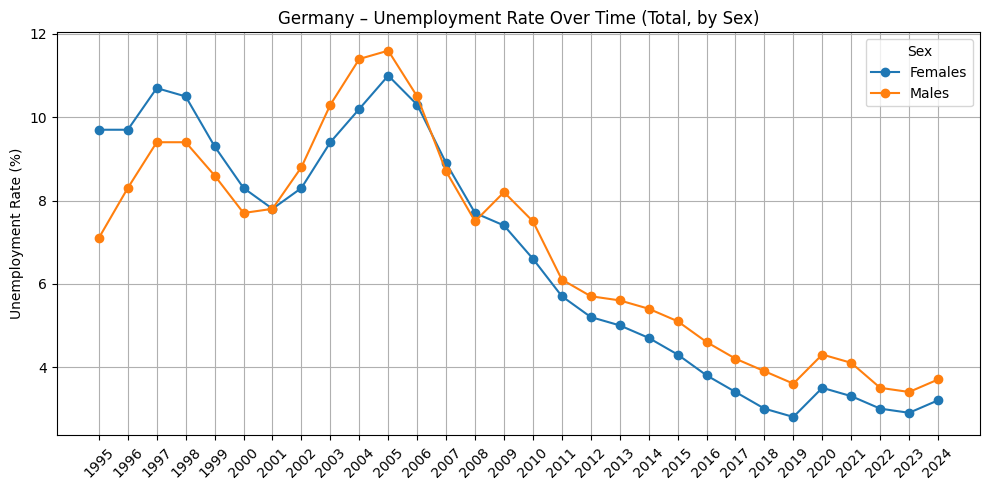

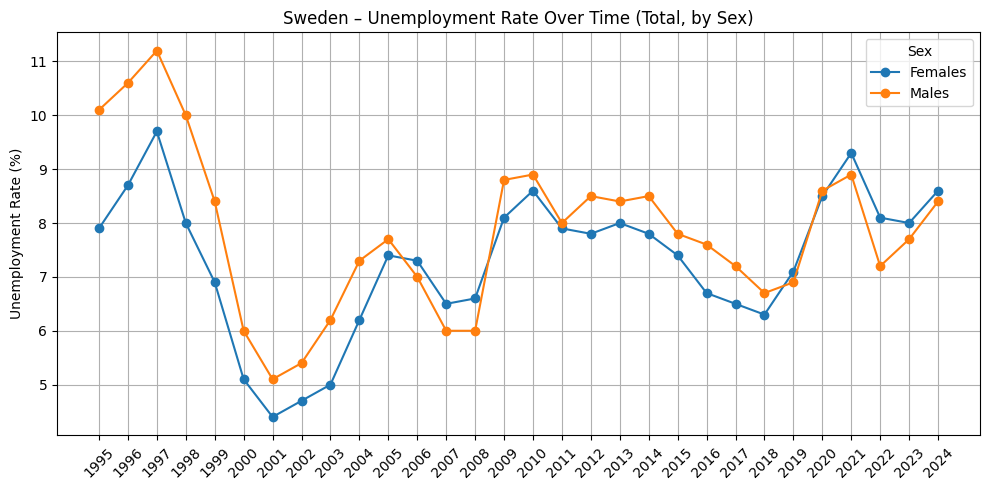

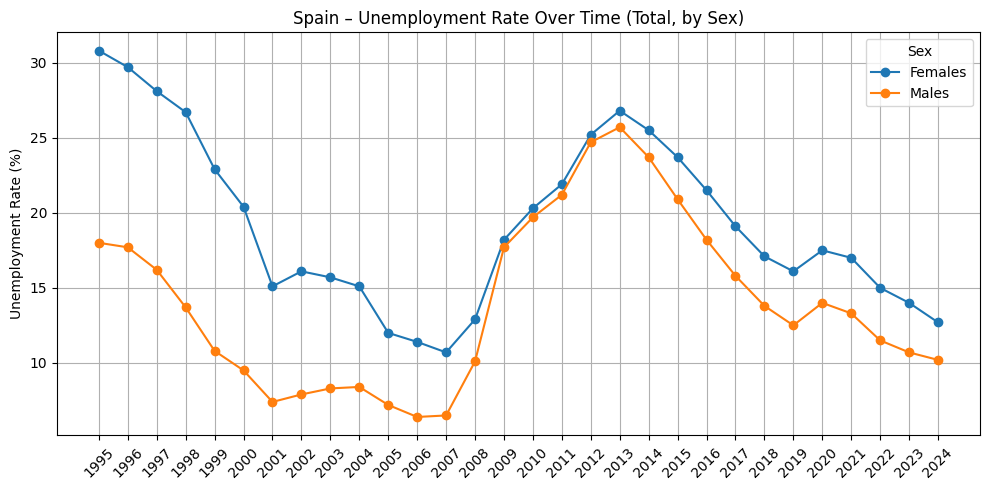

In [39]:
df = uemp_an[
    (uemp_an ['geo'].isin(selected_countries)) &
    (uemp_an ['Sex'].isin(['Females', 'Males'])) &
    (uemp_an ['citizenship'] == 'Total')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='year')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['year'], sex_data['unemployment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Unemployment Rate Over Time (Total, by Sex)")
    plt.ylabel("Unemployment Rate (%)")
    xticks = subset['year'].sort_values().unique()
    plt.xticks(xticks, rotation=45)

    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()



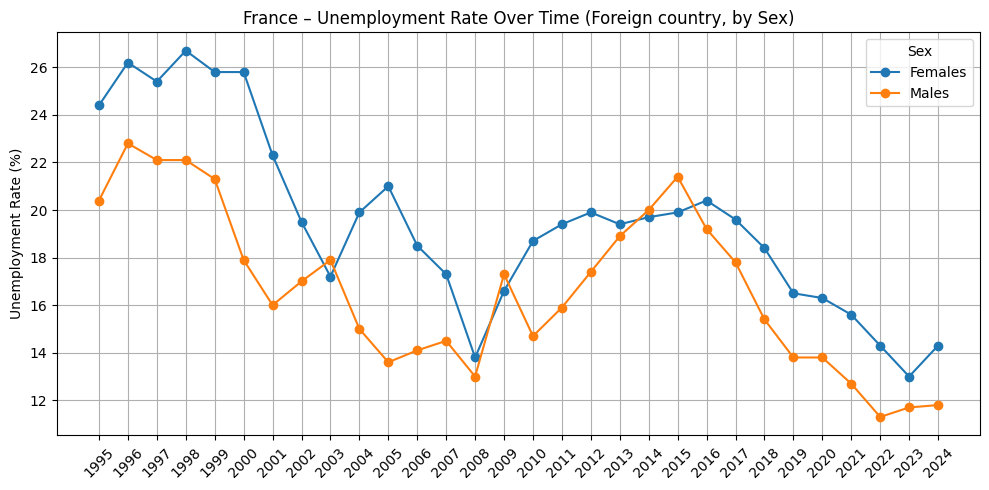

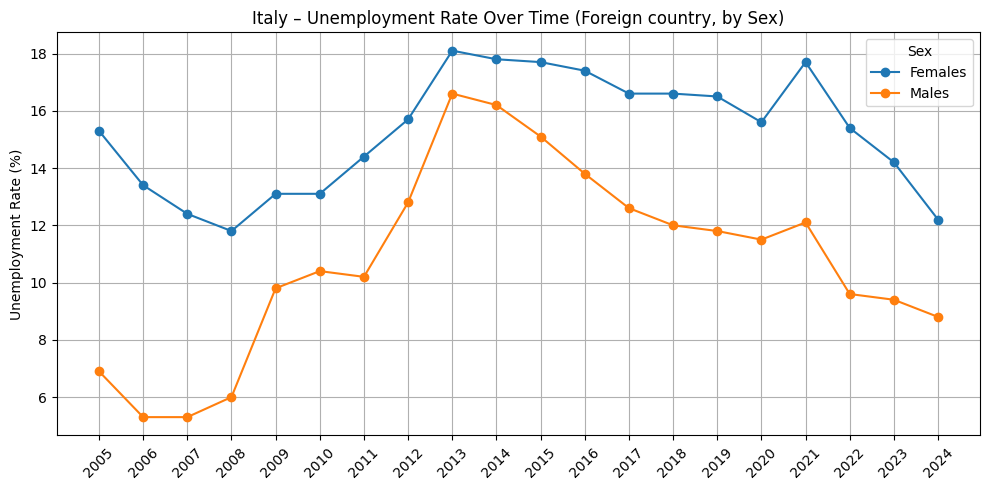

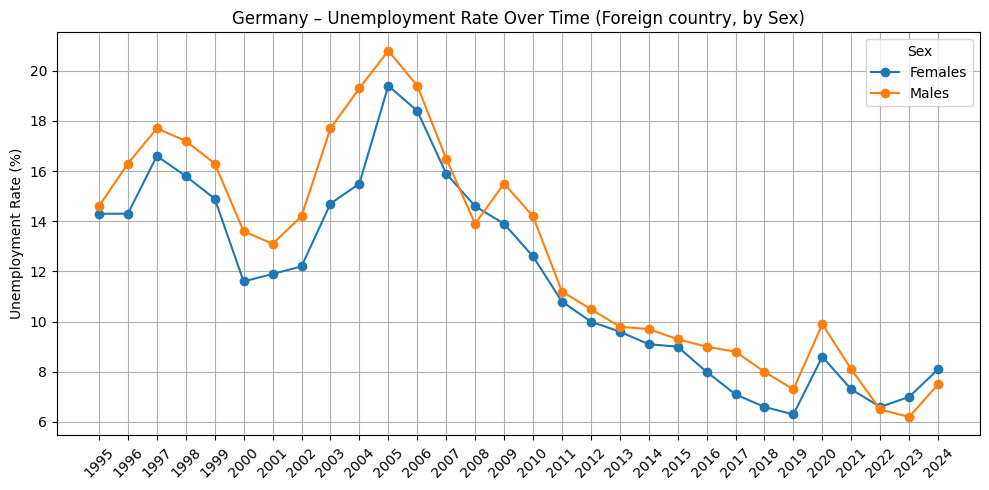

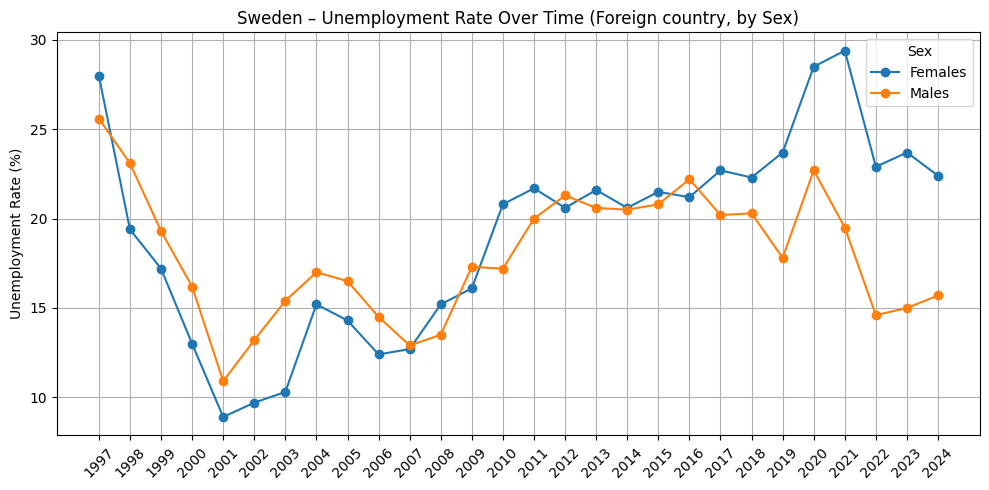

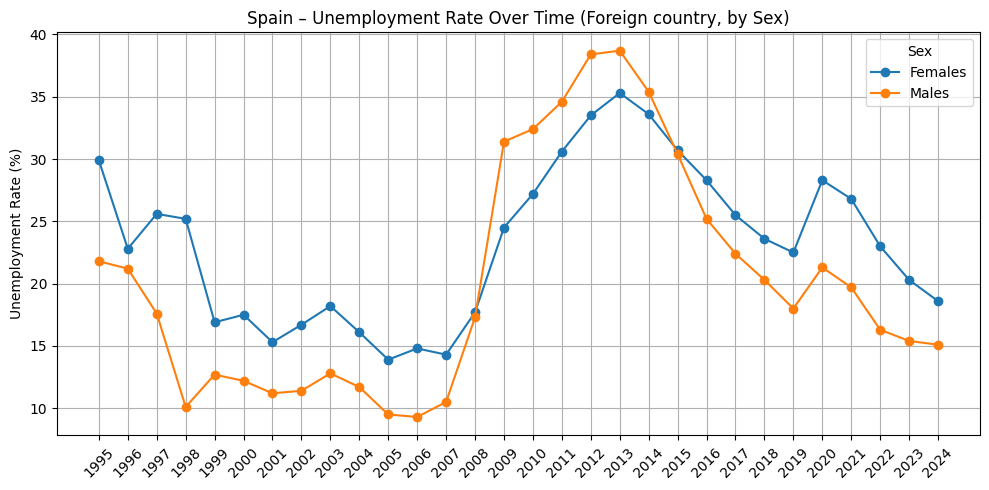

In [38]:
df = uemp_an[
    (uemp_an ['geo'].isin(selected_countries)) &
    (uemp_an ['Sex'].isin(['Females', 'Males'])) &
    (uemp_an ['citizenship'] == 'Foreign country')
]

for country in selected_countries:
    subset = df[df['geo'] == country].sort_values(by='year')

    if subset.empty:
        continue

    plt.figure(figsize=(10, 5))

    for sex in ['Females', 'Males']:
        sex_data = subset[subset['Sex'] == sex]
        if not sex_data.empty:
            plt.plot(sex_data['year'], sex_data['unemployment_rate'], marker='o', label=sex)

    plt.title(f"{country} – Unemployment Rate Over Time (Foreign country, by Sex)")
    plt.ylabel("Unemployment Rate (%)")
    xticks = subset['year'].sort_values().unique()
    plt.xticks(xticks, rotation=45)
    plt.grid(True)
    plt.legend(title='Sex')
    plt.tight_layout()
    plt.show()

# Właściwa analiza - badanie wpływu migracji na rynek pracy

In [2]:
migr_data = pd.read_csv('../processed_data/immigration_by_citizenship_combined_data.csv')

In [3]:
migr_data.head()

,geo,year,EU,Ukraine,national,non_EU,foreigners,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share
0,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707
1,Austria,1999,30266.0,582.0,14331.0,128227.0,158493.0,NaN,NaN,NaN,0.367209,80.903888
2,Austria,2001,36068.0,777.0,15142.0,134108.0,170176.0,NaN,NaN,NaN,0.456586,78.805472
3,Austria,2002,34008.0,1103.0,21981.0,137932.0,171940.0,NaN,NaN,NaN,0.641503,80.221007
4,Austria,2003,37727.0,1332.0,18528.0,148679.0,186406.0,NaN,NaN,NaN,0.714569,79.760845


### Połączenie danych migracyjnych i danych o zatrudnieniu (employment rate & unemployment rate)

In [4]:
emplo_data = pd.read_csv('../processed_data/employmnet_rates_yearly.csv')
unemplo_data = pd.read_csv('../processed_data/unemploymnet_rates_yearly.csv')

In [5]:
merged = pd.merge(migr_data, emplo_data, on=['geo', 'year'], how='inner')

In [6]:
merged.head()

,geo,year,EU,Ukraine,national,non_EU,foreigners,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,citizenship,employment_rate,Sex
0,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Foreign country,57.6,Females
1,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Foreign country,75.9,Males
2,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Foreign country,66.9,Total
3,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Reporting country,59.1,Females
4,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Reporting country,75.9,Males


In [7]:
merged2 = pd.merge(merged, unemplo_data, on=['geo', 'year', 'Sex', 'citizenship'], how='left')

In [8]:
merged2.head()

,geo,year,EU,Ukraine,national,non_EU,foreigners,foreigners_pop_share,non_EU_pop_share,ukraine_pop_share,ukraine_for_share,non_EU_for_share,citizenship,employment_rate,Sex,unemployment_rate
0,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Foreign country,57.6,Females,8.9
1,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Foreign country,75.9,Males,10.3
2,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Foreign country,66.9,Total,9.7
3,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Reporting country,59.1,Females,5.3
4,Austria,1998,27468.0,410.0,13494.0,101367.0,128835.0,NaN,NaN,NaN,0.318237,78.679707,Reporting country,75.9,Males,4.8


In [9]:
# analiza dla obydwu płci 
merged2 = merged2[merged['citizenship'] == 'Total']
merged2 = merged2.drop(columns=['citizenship'])
merged2 = merged2[merged2['Sex'] == 'Total']

Dla Bułgarii i Rumuni - kiepskie dane dotyczące wskaźników zatrudnienia. 
Należy pamiętać o tym podczas analizy wyników

### Korelacje

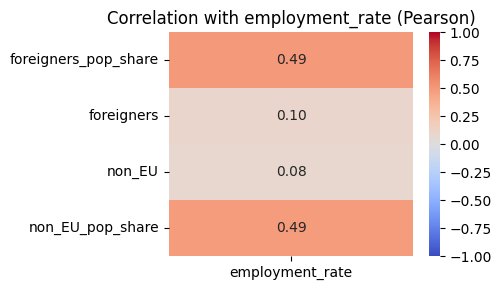

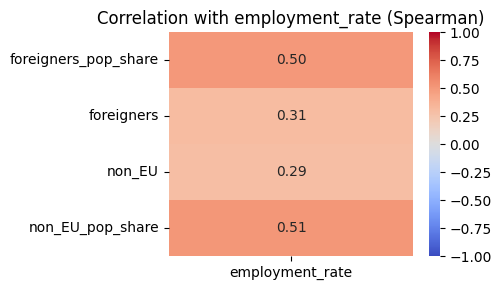

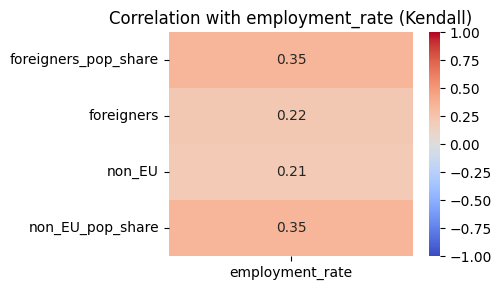

In [10]:
methods = ['pearson', 'spearman', 'kendall']
cols = ['foreigners_pop_share', 'foreigners', 'non_EU', 'non_EU_pop_share', 'employment_rate']

for method in methods:
    corr = merged2[cols].corr(method=method)
    
    corr_subset = corr[['employment_rate']].drop('employment_rate')

    plt.figure(figsize=(5, 3))
    sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, cbar=True)
    plt.title(f"Correlation with employment_rate ({method.capitalize()})")
    plt.tight_layout()
    plt.show()


Wyniki są podobne, zdecydowano używać korelacji Spearmana

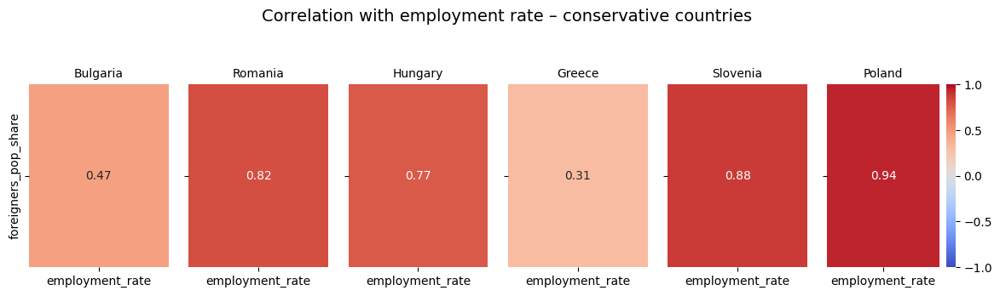

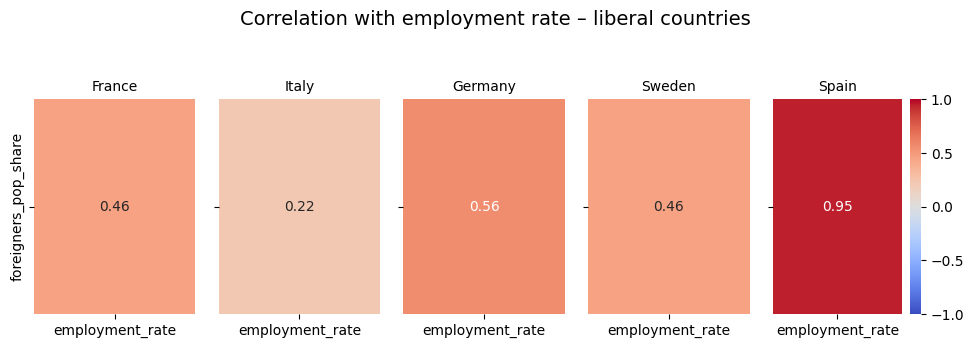

In [11]:
cols = ['foreigners_pop_share', 'employment_rate']
less_migrants = ["Bulgaria", "Romania", "Hungary", "Greece", "Slovenia", "Poland"]
more_migrants = ["France", "Italy", "Germany", "Sweden", "Spain"]

def plot_country_group(group, title):
    n = len(group)
    fig, axes = plt.subplots(1, n, figsize=(2 * n, 3.5), sharey=True)  
    
    if n == 1:
        axes = [axes]  
    
    for i, country in enumerate(group):
        country_data = merged2[merged2['geo'] == country]
        corr = country_data[cols].corr(method='spearman')
        corr_subset = corr[['employment_rate']].drop('employment_rate')

        sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1,
                    cbar=(i == n - 1), ax=axes[i])
        axes[i].set_title(country, fontsize=10) 

    fig.suptitle(title, fontsize=14) 
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

plot_country_group(less_migrants, "Correlation with employment rate – conservative countries")

plot_country_group(more_migrants, "Correlation with employment rate – liberal countries")



Wyraźne związki występują dla Polski, Węgier, Słoweni oraz Hiszpani. 

Zauważalny związek dla Rumuni.

### Sprawdzenie korelacji z przesunięciami

In [12]:
# shift = 1

for country in merged2['geo'].unique():
    country_data = merged2[merged2['geo'] == country].copy()
    country_data['foreigners_lag'] = country_data['foreigners'].shift(1)
    country_data = country_data.dropna(subset=['foreigners_lag', 'employment_rate'])
    
    if len(country_data) > 1:
        corr = country_data[['foreigners_lag', 'employment_rate']].corr(method='spearman').iloc[0,1]
        if corr > 0.5:
            print(f"{country}: {corr:.2f}")
  

Belgium: 0.61
Croatia: 0.63
Cyprus: 0.83
Estonia: 0.71
Finland: 0.63
Hungary: 0.70
Ireland: 0.53
Latvia: 0.84
Lithuania: 0.80
Luxembourg: 0.93
Malta: 0.82
Netherlands: 0.86
North Macedonia: 0.95
Poland: 0.94
Portugal: 0.93
Romania: 0.83
Slovenia: 0.84
Spain: 0.91
Sweden: 0.69


In [13]:
# shift = 2

for country in merged2['geo'].unique():
    country_data = merged2[merged2['geo'] == country].copy()
    country_data['foreigners_lag'] = country_data['foreigners'].shift(2)
    country_data = country_data.dropna(subset=['foreigners_lag', 'employment_rate'])
    
    if len(country_data) > 1:
        corr = country_data[['foreigners_lag', 'employment_rate']].corr(method='spearman').iloc[0,1]
        if corr > 0.5:
            print(f"{country}: {corr:.2f}")
  

Belgium: 0.58
Croatia: 0.56
Cyprus: 0.57
Estonia: 0.57
Finland: 0.54
Hungary: 0.68
Latvia: 0.57
Lithuania: 0.71
Luxembourg: 0.94
Malta: 0.78
Netherlands: 0.73
North Macedonia: 0.97
Poland: 0.96
Portugal: 0.82
Romania: 0.85
Slovenia: 0.65
Spain: 0.72
Sweden: 0.61


Shift w tym wypadku wydaje się nie mieć znaczenia

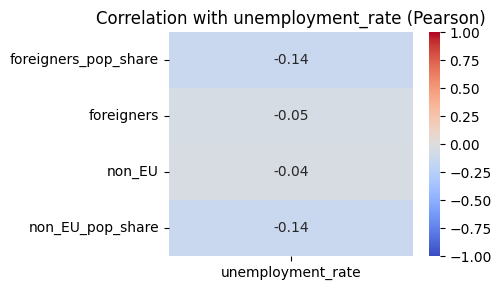

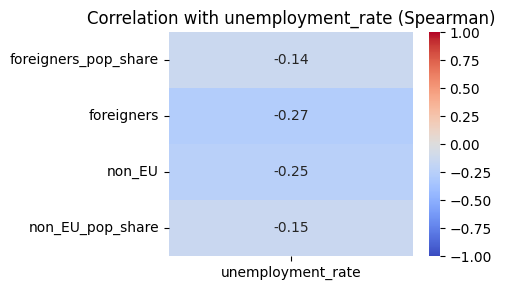

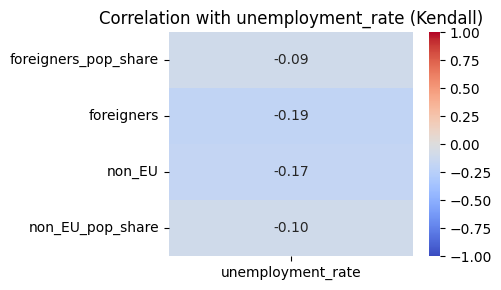

In [14]:
methods = ['pearson', 'spearman', 'kendall']
cols = ['foreigners_pop_share', 'foreigners', 'non_EU', 'non_EU_pop_share', 'unemployment_rate']

for method in methods:
    corr = merged2[cols].corr(method=method)
    
    corr_subset = corr[['unemployment_rate']].drop('unemployment_rate')

    plt.figure(figsize=(5, 3))
    sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, cbar=True)
    plt.title(f"Correlation with unemployment_rate ({method.capitalize()})")
    plt.tight_layout()
    plt.show()

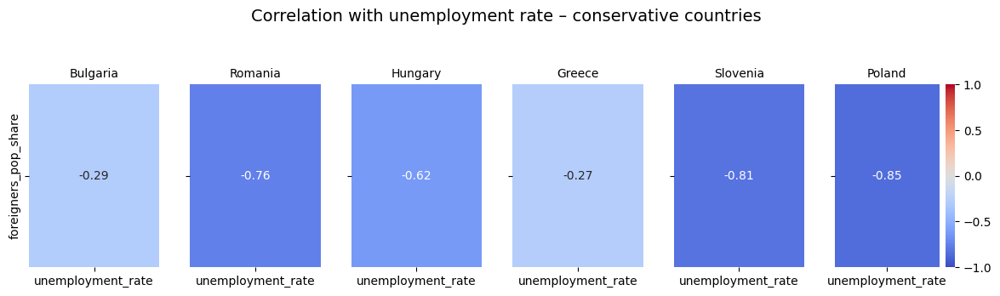

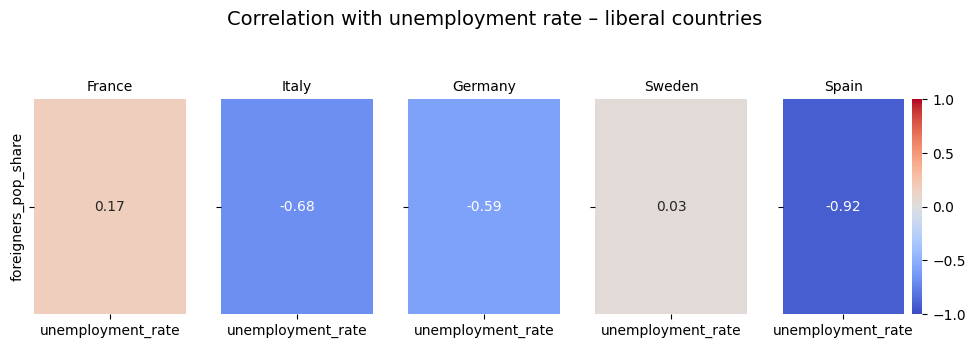

In [15]:
cols = ['foreigners_pop_share', 'unemployment_rate']
less_migrants = ["Bulgaria", "Romania", "Hungary", "Greece", "Slovenia", "Poland"]
more_migrants = ["France", "Italy", "Germany", "Sweden", "Spain"]

def plot_country_group(group, title):
    n = len(group)
    fig, axes = plt.subplots(1, n, figsize=(2 * n, 3.5), sharey=True)  
    
    if n == 1:
        axes = [axes]  
    
    for i, country in enumerate(group):
        country_data = merged2[merged2['geo'] == country]
        corr = country_data[cols].corr(method='spearman')
        corr_subset = corr[['unemployment_rate']].drop('unemployment_rate')

        sns.heatmap(corr_subset, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1,
                    cbar=(i == n - 1), ax=axes[i])
        axes[i].set_title(country, fontsize=10) 

    fig.suptitle(title, fontsize=14) 
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

plot_country_group(less_migrants, "Correlation with unemployment rate – conservative countries")

plot_country_group(more_migrants, "Correlation with unemployment rate – liberal countries")

Niskie poziomy korelacji dla Szwecji i Francji zaburzają wyniki dla całości. 

Wysoki ujemny współczynnik korelacji dla Polski, Hiszpani, Słoweni, Rumunii -> im więcej przyjmowanych uchodźców, tym mniejsze bezrobocie. 

Dla krajów, dla których współczynnik zatrudnienia i ilość przyjmowanych migrantów były silnie skorelowane to również stopa bezrobocia jest silnie skorelowana.

Sprawdzenie z przesunięciem:

In [16]:
# shift = 1

for country in merged2['geo'].unique():
    country_data = merged2[merged2['geo'] == country].copy()
    country_data['foreigners_lag'] = country_data['foreigners_pop_share'].shift(1)
    country_data = country_data.dropna(subset=['foreigners_lag', 'unemployment_rate'])
    
    if len(country_data) > 1:
        corr = country_data[['foreigners_lag', 'unemployment_rate']].corr(method='spearman').iloc[0,1]
        if corr < -0.5:
            print(f"{country}: {corr:.2f}")

Germany: -0.50
Hungary: -0.64
Poland: -0.84
Romania: -0.78
Slovenia: -0.70
Spain: -0.89


In [17]:
# shift = 2

for country in merged2['geo'].unique():
    country_data = merged2[merged2['geo'] == country].copy()
    country_data['foreigners_lag'] = country_data['foreigners_pop_share'].shift(2)
    country_data = country_data.dropna(subset=['foreigners_lag', 'unemployment_rate'])
    
    if len(country_data) > 1:
        corr = country_data[['foreigners_lag', 'unemployment_rate']].corr(method='spearman').iloc[0,1]
        if corr < -0.5:
            print(f"{country}: {corr:.2f}")

Hungary: -0.62
Poland: -0.82
Romania: -0.82
Spain: -0.69


Shift również wydaje się nie mieć znaczenia w przypadku stopy bezrobocia. Co więcej, działa negatywnie.

# Wizualizacje

In [18]:
less_migrants = ["Bulgaria", "Romania", "Hungary", "Greece", "Slovenia", "Poland"]
more_migrants = ["France", "Italy", "Germany", "Sweden", "Spain"]

selected_countries = less_migrants + more_migrants

### Employment rates - analiza

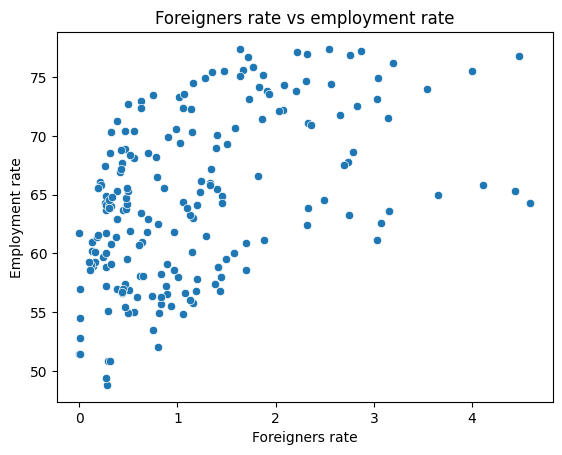

In [19]:
sns.scatterplot(data=merged2, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreigners rate vs employment rate')
plt.xlabel("Foreigners rate")
plt.ylabel("Employment rate")
plt.show()

W całościowych danych nie widać jednoznacznego trendu.

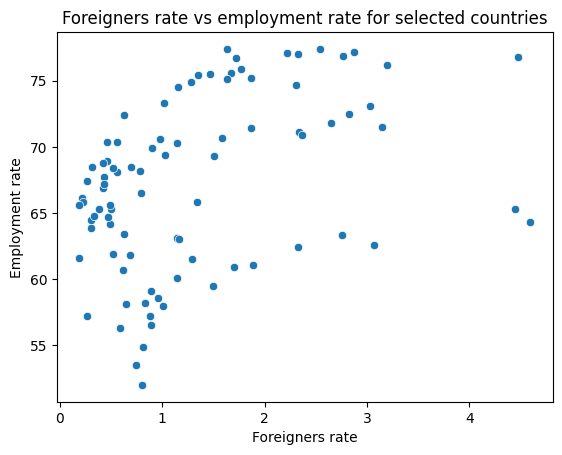

In [20]:
sns.scatterplot(data=merged2[(merged2['geo'].isin(selected_countries)) & (merged2['year'] > 2015)], x='foreigners_pop_share', y='employment_rate')
plt.title('Foreigners rate vs employment rate for selected countries')
plt.xlabel("Foreigners rate")
plt.ylabel("Employment rate")
plt.show()


Sprawdzenie trendu dla liczby migrantów powyżej 0.5

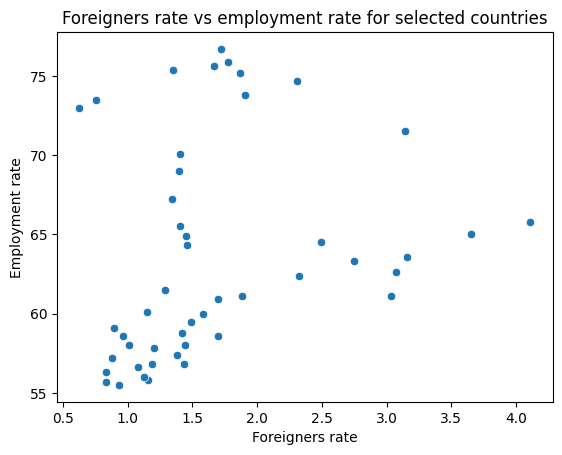

In [21]:
sns.scatterplot(data=merged2[(merged2['geo'].isin(selected_countries))
                                & (merged2['foreigners'] > 0.5 * 1e6)
                                & (merged2['foreigners'] < 2 * 1e6)
                              ], x='foreigners_pop_share', y='employment_rate')
plt.title('Foreigners rate vs employment rate for selected countries')
plt.xlabel("Foreigners rate")
plt.ylabel("Employment rate")
plt.show()

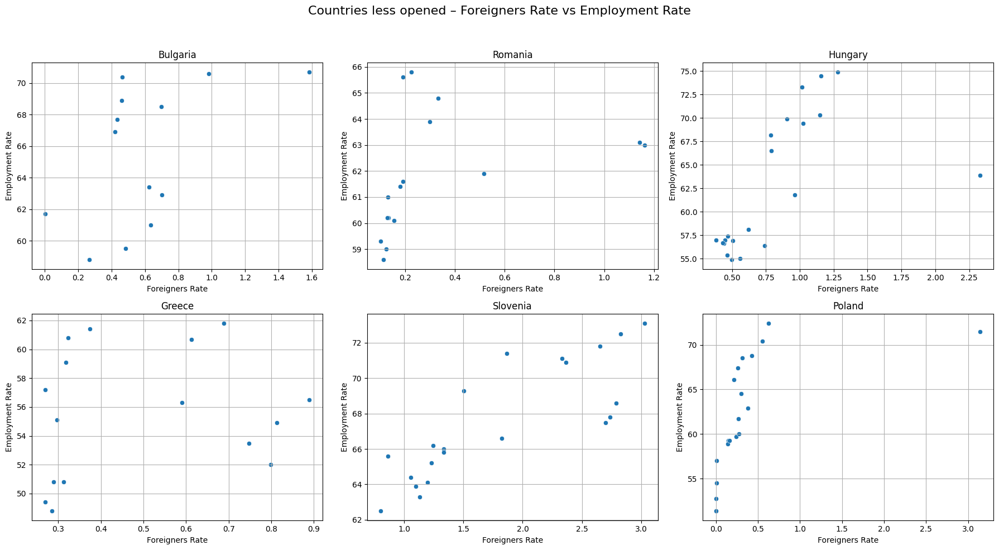

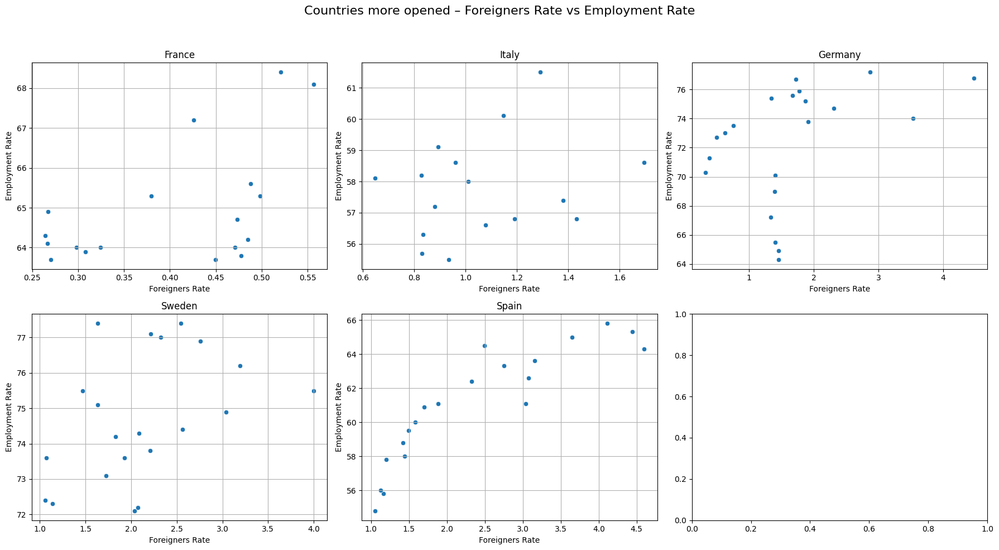

In [22]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10)) 
fig.suptitle('Countries less opened – Foreigners Rate vs Employment Rate', fontsize=16)

for ax, country in zip(axs.flat, less_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners_pop_share', y='employment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Foreigners Rate')
        ax.set_ylabel('Employment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()



fig, axs = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle('Countries more opened – Foreigners Rate vs Employment Rate', fontsize=16)

for ax, country in zip(axs.flat, more_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners_pop_share', y='employment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Foreigners Rate')
        ax.set_ylabel('Employment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


Węgry, Polska, Słowenia - kraje, w których korelacja jest bardzo widoczna. Występują ewidentne trendy wzrostowe. 

Dla Grecji - dane mogą nie być specjalnie trafne z uwagi na potężny kryzys gospodarczy.

W krajach otwartych na migrantów (oprócz Hiszpani - tu bardzo silna korelacja) zależność wskaźnika zatrudnienia do ilości obcokrajowców wydaje się praktycznie nie istnieć (przynajmniej dla danych ogólnych - z wszystkich lat). Natomiast w krajach bardziej koserwatywnych w tej kwestii wydaje się istnieć duża zależność.


#### Kraje literalne vs konserwatywne w kwestiach migracji

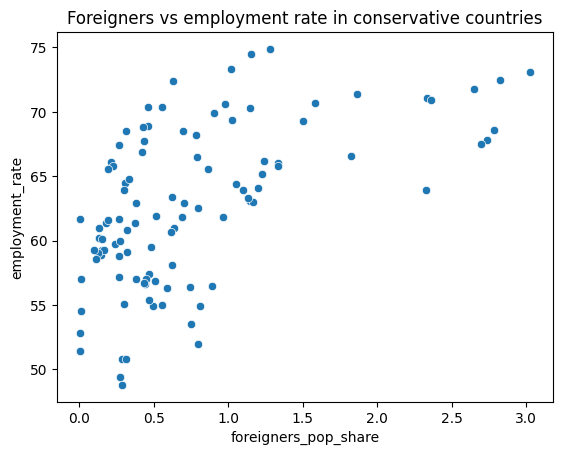

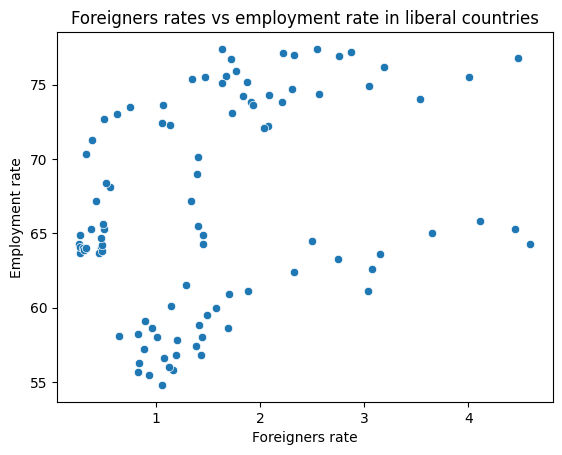

In [23]:
sns.scatterplot(data=merged2[(merged2['geo'].isin(less_migrants))
                              & (merged2['foreigners'] < 1e6)], # delete outliers
                                x='foreigners_pop_share', y='employment_rate')
plt.title('Foreigners vs employment rate in conservative countries')
plt.show()

sns.scatterplot(data=merged2[(merged2['geo'].isin(more_migrants)) ], x='foreigners_pop_share', y='employment_rate')
plt.title('Foreigners rates vs employment rate in liberal countries')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

Dla całych grup nie widać zbyt wyraźnych trendów

#### Polska - analiza

In [24]:
poland_data = merged2[(merged2['geo'] == "Poland") 
                      & (merged2['foreigners_pop_share'] < 3) # deleted outliers (> 3% - 2022 for example - because of war in Ukraine)
                  ]


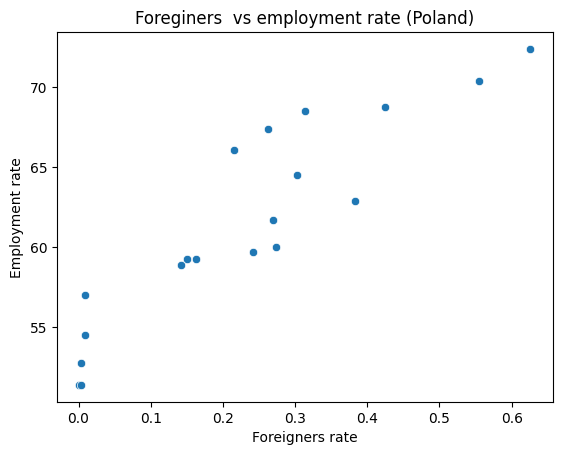

In [25]:
sns.scatterplot(data=poland_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreginers  vs employment rate (Poland)')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

Dla Polski widać ewidentny trend rosnący

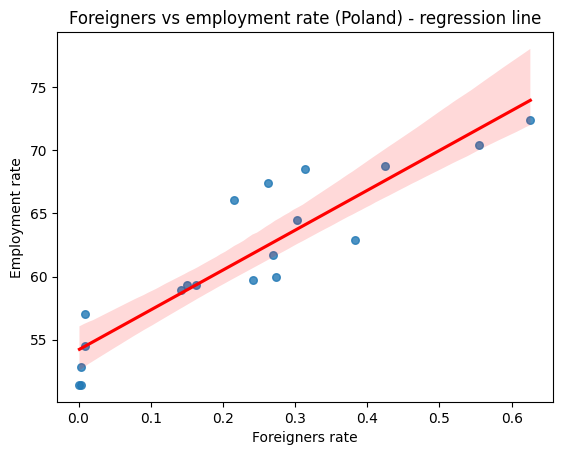

In [26]:
sns.regplot(data=poland_data, x='foreigners_pop_share', y='employment_rate', scatter_kws={'s': 30}, line_kws={'color': 'red'})
plt.title('Foreigners vs employment rate (Poland) - regression line')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

Widoczny mocny trend rosnący dla Polski

#### Hiszpania

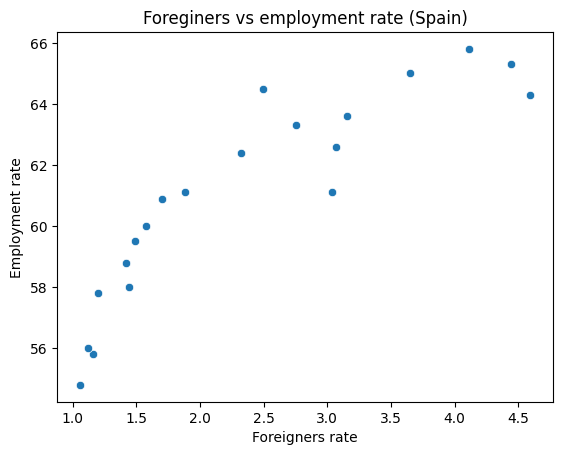

In [27]:
spain_data = merged2[(merged2['geo'] == "Spain")  
                  ] 

sns.scatterplot(data=spain_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreginers vs employment rate (Spain)')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

W przypadku Hiszpani również widać trend rosnący - opórcz outlinerów po prawej stronie

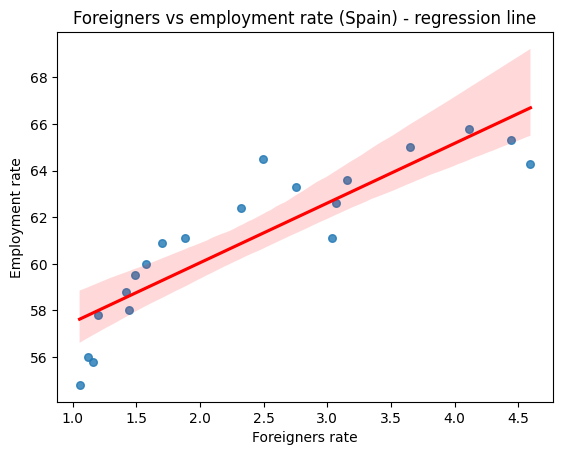

In [28]:
sns.regplot(data=spain_data, x='foreigners_pop_share', y='employment_rate', scatter_kws={'s': 30}, line_kws={'color': 'red'})
plt.title('Foreigners vs employment rate (Spain) - regression line')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

#### Węgry

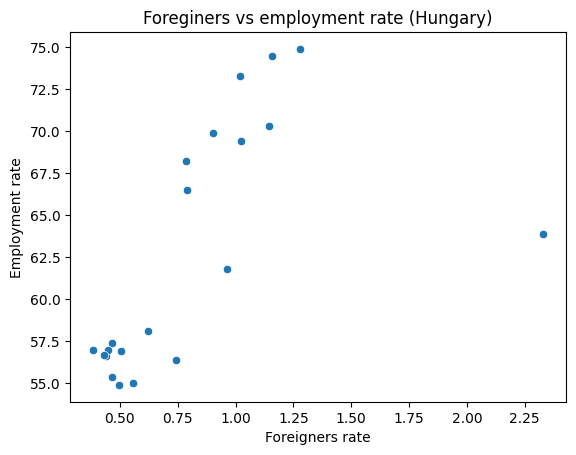

In [29]:
hungary_data = merged2[(merged2['geo'] == "Hungary")  
                  ] 

sns.scatterplot(data=hungary_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreginers vs employment rate (Hungary)')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

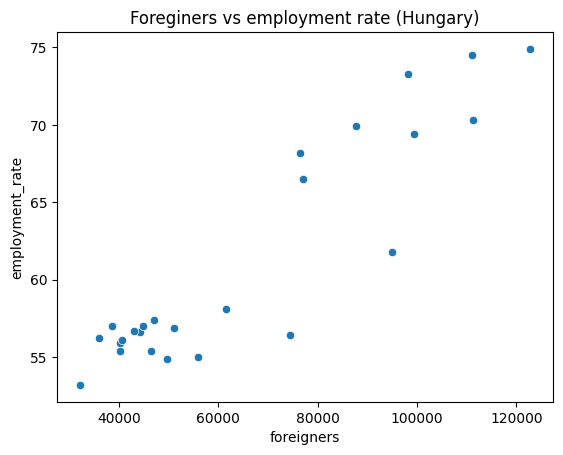

In [30]:
hungary_data = merged2[(merged2['geo'] == "Hungary")
                       & (merged2['foreigners'] < 150_000)] # deleted outliers

sns.scatterplot(data=hungary_data, x='foreigners', y='employment_rate')
plt.title('Foreginers vs employment rate (Hungary)')
plt.show()

#### Słowenia

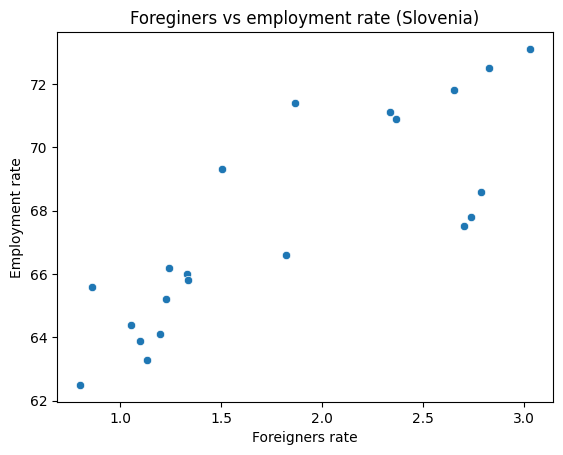

In [31]:
slovenia_data = merged2[(merged2['geo'] == "Slovenia")]

sns.scatterplot(data=slovenia_data, x='foreigners_pop_share', y='employment_rate')
plt.title('Foreginers vs employment rate (Slovenia)')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

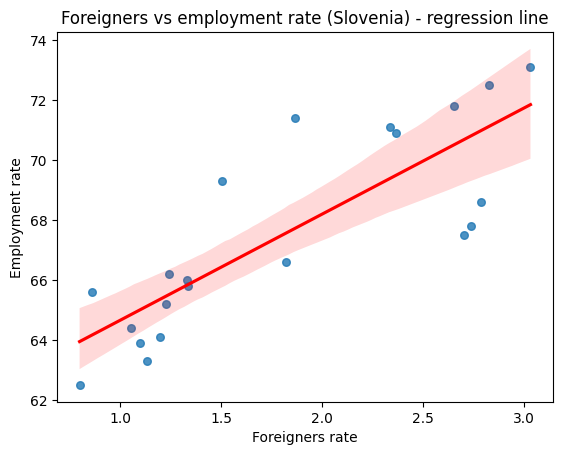

In [32]:
sns.regplot(data=slovenia_data, x='foreigners_pop_share', y='employment_rate', scatter_kws={'s': 30}, line_kws={'color': 'red'})
plt.title('Foreigners vs employment rate (Slovenia) - regression line')
plt.xlabel('Foreigners rate')
plt.ylabel('Employment rate')
plt.show()

### Unemployment rate - analiza

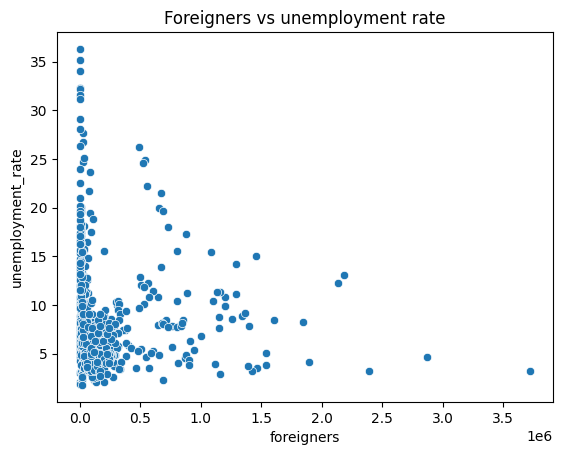

In [33]:
sns.scatterplot(data=merged2, x='foreigners', y='unemployment_rate')
plt.title('Foreigners vs unemployment rate')
plt.show()

Widać ogólny trend malejący, wraz ze wzrostem liczby migrantów maleje stopa bezrobocia

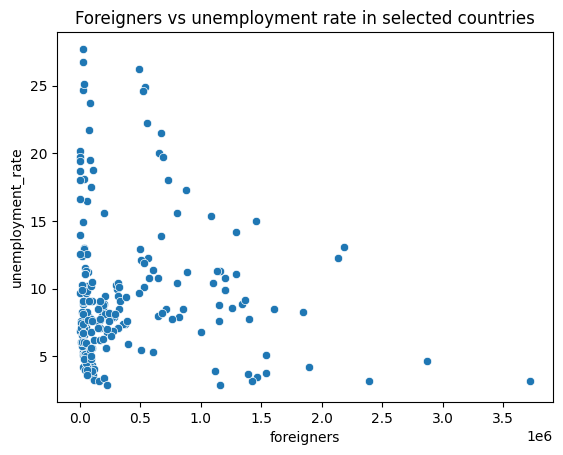

In [34]:
sns.scatterplot(data=merged2[merged2['geo'].isin(selected_countries)], x='foreigners', y='unemployment_rate')
plt.title('Foreigners vs unemployment rate in selected countries')
plt.show()


Dla wybranych krajów podobny trend jak dla wszystkich

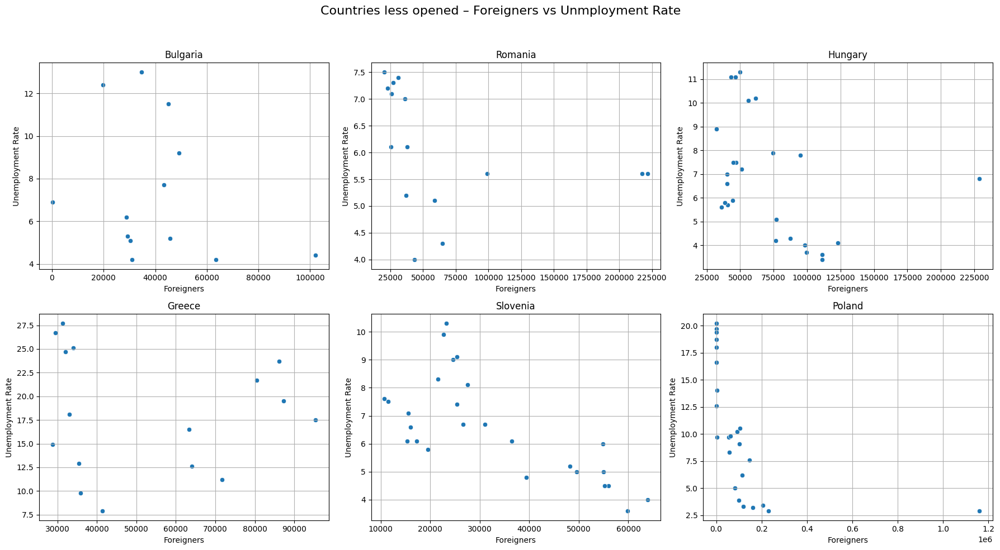

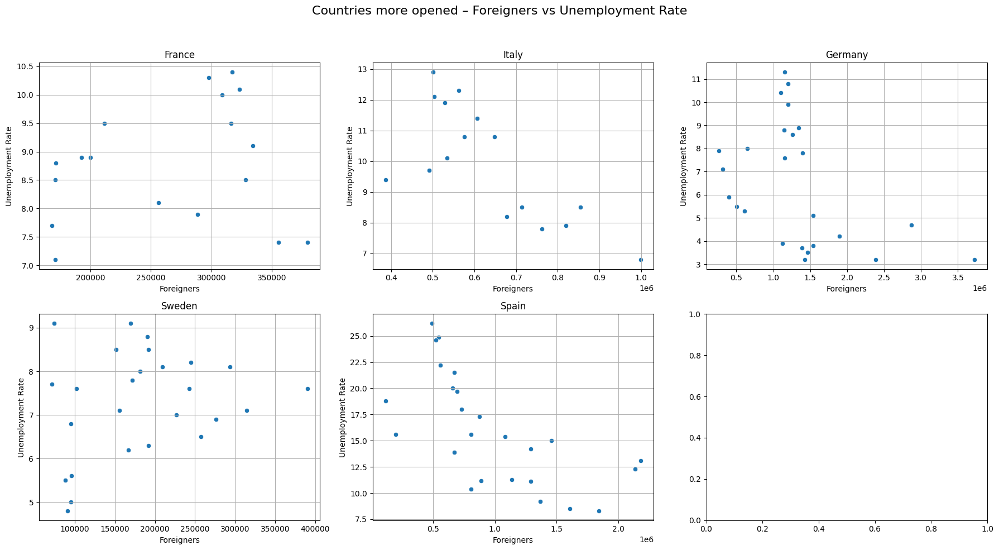

In [35]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10)) 
fig.suptitle('Countries less opened – Foreigners vs Unmployment Rate', fontsize=16)

for ax, country in zip(axs.flat, less_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners', y='unemployment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Foreigners')
        ax.set_ylabel('Unemployment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()



fig, axs = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle('Countries more opened – Foreigners vs Unemployment Rate', fontsize=16)

for ax, country in zip(axs.flat, more_migrants):
    country_data = merged2[merged2['geo'] == country]
    
    if not country_data.empty:
        sns.scatterplot(data=country_data, x='foreigners', y='unemployment_rate', ax=ax)
        ax.set_title(country)
        ax.set_xlabel('Foreigners')
        ax.set_ylabel('Unemployment Rate')
        ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

#### Polska

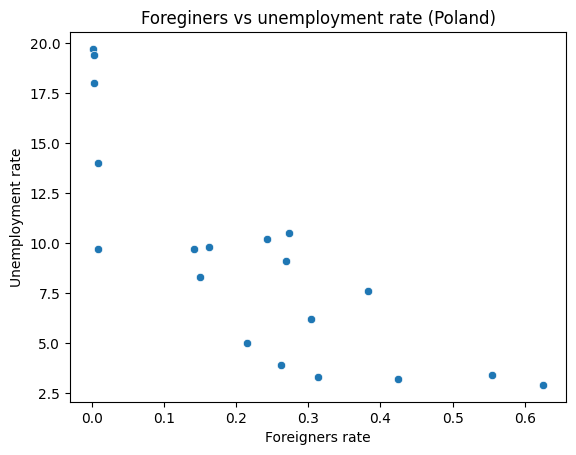

In [60]:
poland_data = merged2[(merged2['geo'] == "Poland") & 
                      (merged2['foreigners_pop_share'] < 3)  # delete outliers
                  ] 

sns.scatterplot(data=poland_data, x='foreigners_pop_share', y='unemployment_rate')
plt.title('Foreginers vs unemployment rate (Poland)')
plt.xlabel('Foreigners rate')
plt.ylabel('Unemployment rate')
plt.show()

W przypadku: Hiszpani, Polski, Słoweni, Węgier, Włoch widoczny jest trend malejący. 

### Klasteryzacja

#### Empoloyment rate

In [36]:
features = merged2.groupby('geo').agg({
    'employment_rate': ['mean', 'std'],
    'foreigners': ['mean', 'std']
}).dropna()

features.columns = ['employment_mean', 'employment_std', 'foreigners_mean', 'foreigners_std']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

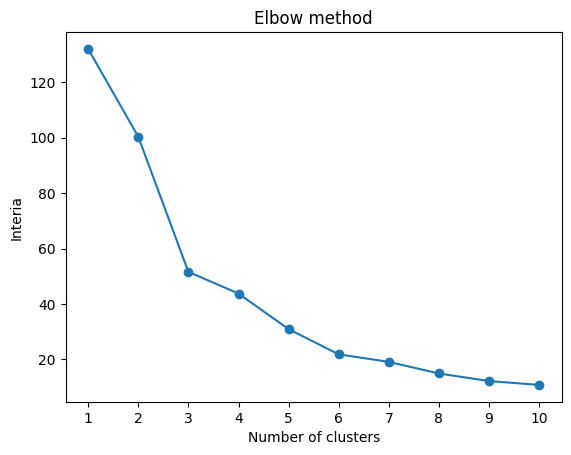

In [37]:
# check k for KMeans

intertias = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_scaled)
    intertias.append(kmeans.inertia_)

plt.plot(range(1, 11), intertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(1, 11))
plt.ylabel('Interia')
plt.title('Elbow method')
plt.show()

Dobrym pomysłem jest podział na 3 grupy

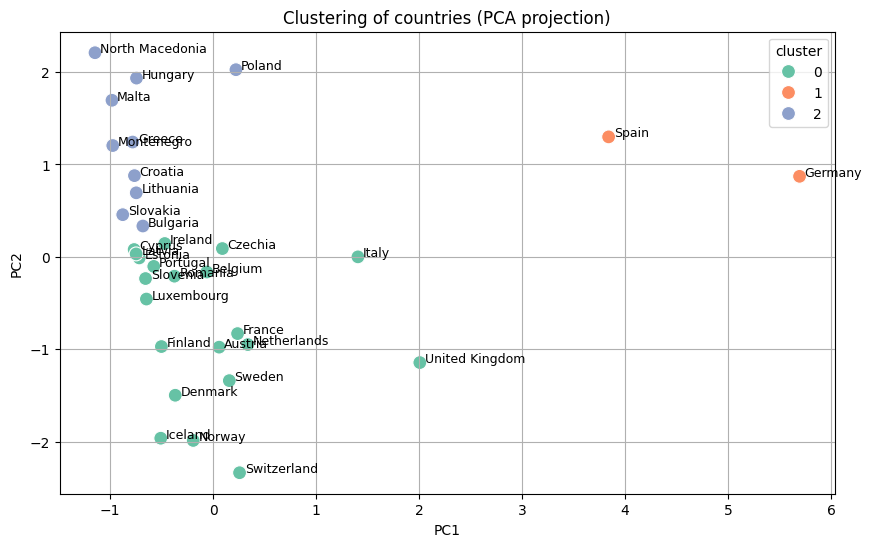

In [38]:
kmeans = KMeans(n_clusters=3, random_state=0)
features['cluster'] = kmeans.fit_predict(X_scaled)


pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)
features['PC1'] = components[:, 0]
features['PC2'] = components[:, 1]


plt.figure(figsize=(10, 6))
sns.scatterplot(data=features, x='PC1', y='PC2', hue='cluster', palette='Set2', s=100)


for country, row in features.iterrows():
    plt.text(row['PC1'] + 0.05, row['PC2'], country, fontsize=9)

plt.title('Clustering of countries (PCA projection)')
plt.grid(True)
plt.show()


W klastrze 0 znajdują się kraje powszechnie uznawane za liberalne w kontekście migracji.

W klastrze 2 znajdują się kraje powszechnie uznawane za konserwatywne w kontekście migracji.

W klastrze 1 znajdują się 2 kraje (Niemcy i Hiszpania) przyjmujące największą liczbę migrantów. 

Klastry są dobrze wizualnie od siebie rozdzielone.

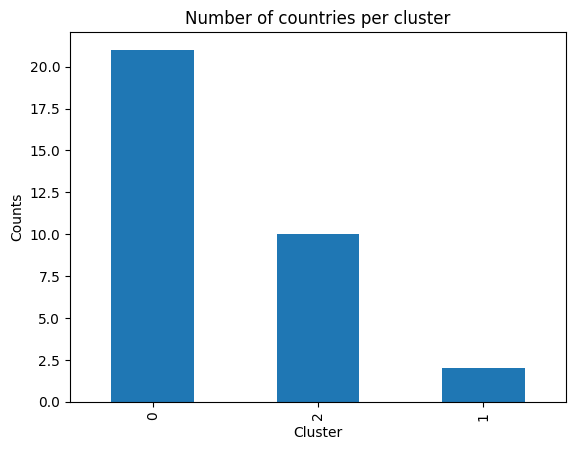

In [39]:
features["cluster"].value_counts().plot(kind="bar")

plt.xlabel("Cluster")
plt.ylabel("Counts")
plt.title("Number of countries per cluster")

plt.show()

#### Unemployment rate

In [40]:
features = merged2.groupby('geo').agg({
    'unemployment_rate': ['mean', 'std'],
    'foreigners': ['mean', 'std']
}).dropna()

features.columns = ['unemployment_mean', 'unemployment_std', 'foreigners_mean', 'foreigners_std']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

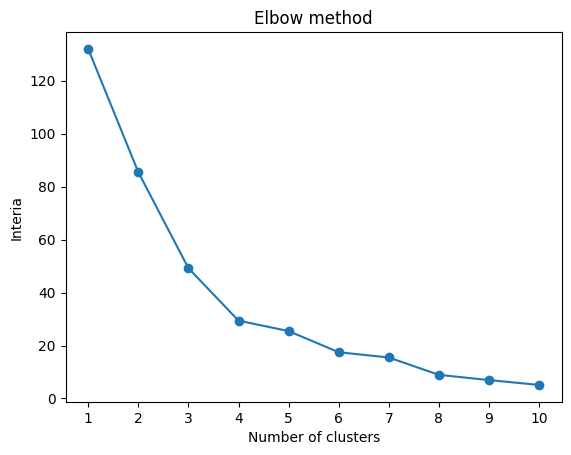

In [41]:
# check k for KMeans

intertias = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_scaled)
    intertias.append(kmeans.inertia_)

plt.plot(range(1, 11), intertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(range(1, 11))
plt.ylabel('Interia')
plt.title('Elbow method')
plt.show()

4 klastry 

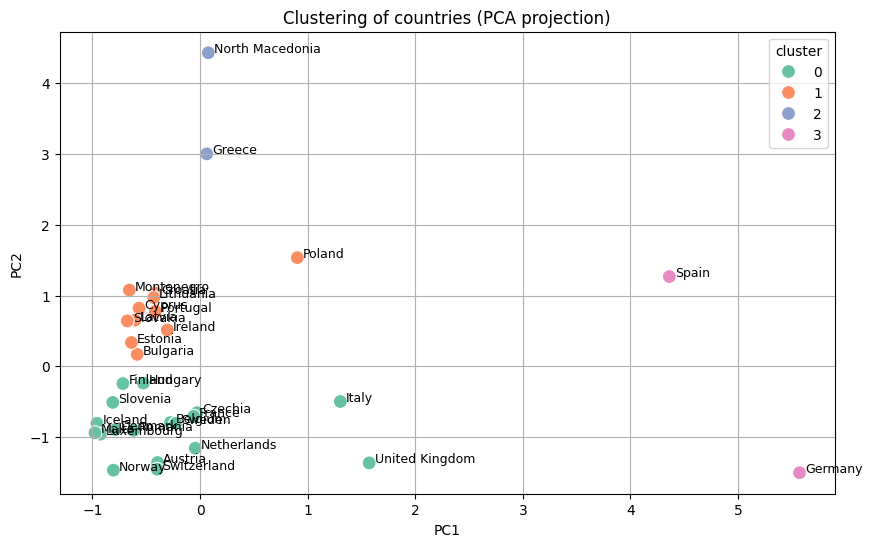

In [51]:
kmeans = KMeans(n_clusters=4, random_state=0)
features['cluster'] = kmeans.fit_predict(X_scaled)


pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)
features['PC1'] = components[:, 0]
features['PC2'] = components[:, 1]


plt.figure(figsize=(10, 6))
sns.scatterplot(data=features, x='PC1', y='PC2', hue='cluster', palette='Set2', s=100)


for country, row in features.iterrows():
    plt.text(row['PC1'] + 0.05, row['PC2'], country, fontsize=9)

plt.title('Clustering of countries (PCA projection)')
plt.grid(True)
plt.show()

Podział jest podobny jak w wypadku unemployment, jedynie Grecja i Macedonia Północna znacznie odstają grupy krajów konserwatywnych w kontekście migracji

W przypadku Grecji wynika to najprawdopodobniej z kryzysu gospodarczego.